In [1]:
import pandas as pd
import numpy as np
from mdss.MDSS import MDSS
from mdss.ScoringFunctions.Poisson import Poisson

In [35]:

# --- 1. Load Data ---
# Ensure these files are in your working directory
# tax_df = pd.read_excel('/Users/kayadetunji/Documents/DM_work/raw data_taxonomy_CFC.xlsx', sheet_name='taxonomy')
# chem_df = pd.read_excel('/Users/kayadetunji/Documents/DM_work/raw data_taxonomy_CFC.xlsx', sheet_name='properties')

tax_df = pd.read_excel('/Users/kayadetunji/Downloads/soil MB/raw data_taxonomy_CFC.xlsx', sheet_name='taxonomy')
chem_df = pd.read_excel('/Users/kayadetunji/Downloads/soil MB/raw data_taxonomy_CFC.xlsx', sheet_name='physical & chemical properties')

# --- 2. Define Groups (Validated by Chemical Data) ---
# Healthy/Reference (pH ~6.7, Nitrate ~16)
ref_cols = ['GZ1', 'GZ2', 'GZ3', 'GZ4']
# Degraded/Target (pH ~5.2, Nitrate ~1.2)
target_cols = ['AG1', 'AG2', 'AG3', 'AG4']

In [36]:
import pandas as pd
from scipy.stats import ttest_ind, mannwhitneyu

# Load chemistry
chem_df = pd.read_excel("/Users/kayadetunji/Downloads/soil MB/raw data_taxonomy_CFC.xlsx", sheet_name="physical & chemical properties")
chem_df = chem_df.set_index("Variable").T

# Rhizosphere only
ref_chem = chem_df.loc[['GZ1','GZ2','GZ3','GZ4']]
ag_chem  = chem_df.loc[['AG1','AG2','AG3','AG4']]

# Summary function
def make_summary(df, name):
    return pd.DataFrame({
        f'{name} Mean': df.mean().round(2),
        f'{name} SD':   df.std().round(2)
    })

table1 = pd.concat([make_summary(ref_chem, "Reference (GZ)"), 
                    make_summary(ag_chem, "Degraded (AG)")], axis=1)

# Add p-values (use Mann-Whitney because small n and non-normal)
p_values = {}
for var in ['pH', 'N–NO3(mg/kg)', 'OC (%)', 'OM (%)', 'K (mg/kg)']:
    p = mannwhitneyu(ref_chem[var], ag_chem[var]).pvalue
    p_values[var] = f"p = {p:.3f}" if p >= 0.001 else f"p < 0.001"

table1["p-value (Mann-Whitney)"] = pd.Series(p_values)
display(table1.round(2))

,Reference (GZ) Mean,Reference (GZ) SD,Degraded (AG) Mean,Degraded (AG) SD,p-value (Mann-Whitney)
Variable,,,,,
pH,6.73,0.25,5.20,0.31,p = 0.029
S (mg/kg),4.74,7.75,0.17,0.34,NaN
TC (mg/kg),1.16,0.09,0.46,0.04,NaN
P (mg/kg),27.74,8.89,31.30,17.87,NaN
K (mg/kg),340.00,71.89,108.28,15.45,p = 0.029
N–NO3(mg/kg),16.29,1.59,1.20,0.47,p = 0.029
N–NH4(mg/kg),3.02,0.79,7.67,2.24,NaN
OC (%),1.00,0.12,0.26,0.02,p = 0.029
OM (%),3.96,0.34,1.50,0.11,p = 0.029


In [37]:
# ==============================
# Table 1: Soil chemical properties
# Reference (GZ) vs Degraded (AG)
# ==============================

import pandas as pd
import numpy as np
from scipy import stats

# ---- Load data ----
chem_df = pd.read_excel(
    "/Users/kayadetunji/Downloads/soil MB/raw data_taxonomy_CFC.xlsx",
    sheet_name="physical & chemical properties"
)

# ---- Define zone columns ----
gz_cols = [c for c in chem_df.columns if c.startswith("GZ")]
ag_cols = [c for c in chem_df.columns if c.startswith("AG")]

# ---- Compute summary statistics and tests ----
rows = []

for _, row in chem_df.iterrows():
    gz = row[gz_cols].astype(float)
    ag = row[ag_cols].astype(float)

    # Mean ± SD
    gz_mean = gz.mean()
    gz_sd   = gz.std(ddof=1)

    ag_mean = ag.mean()
    ag_sd   = ag.std(ddof=1)

    # Welch's t-test
    t_p = stats.ttest_ind(
        gz, ag, equal_var=False, nan_policy="omit"
    ).pvalue

    # Wilcoxon (Mann–Whitney U) test
    w_p = stats.mannwhitneyu(
        gz, ag, alternative="two-sided"
    ).pvalue

    rows.append([
        row["Variable"],
        f"{gz_mean:.2f} ± {gz_sd:.2f}",
        f"{ag_mean:.2f} ± {ag_sd:.2f}",
        t_p,
        w_p
    ])

# ---- Create Table 1 ----
table1 = pd.DataFrame(
    rows,
    columns=[
        "Variable",
        "Reference (GZ) mean ± SD",
        "Degraded (AG) mean ± SD",
        "t-test p-value",
        "Wilcoxon p-value"
    ]
)

# ---- Display table ----
display(table1)

# ---- Optional: save to file ----
# table1.to_csv("Table1_soil_properties_GZ_vs_AG.csv", index=False)
# table1.to_excel("Table1_soil_properties_GZ_vs_AG.xlsx", index=False)

,Variable,Reference (GZ) mean ± SD,Degraded (AG) mean ± SD,t-test p-value,Wilcoxon p-value
0,pH,6.64 ± 0.32,5.26 ± 0.26,1.043003e-05,0.002165
1,S (mg/kg),4.15 ± 6.18,0.11 ± 0.28,1.703077e-01,0.060808
2,TC (mg/kg),1.17 ± 0.10,0.46 ± 0.04,2.500421e-06,0.004998
3,P (mg/kg),31.72 ± 13.55,27.06 ± 15.42,5.907295e-01,0.393939
4,K (mg/kg),331.67 ± 62.01,106.35 ± 12.44,2.199869e-04,0.004998
5,N–NO3(mg/kg),15.62 ± 1.74,1.45 ± 0.80,3.770664e-07,0.004998
6,N–NH4(mg/kg),3.86 ± 1.59,6.73 ± 2.35,3.572177e-02,0.025974
7,OC (%),0.97 ± 0.11,0.26 ± 0.02,1.593645e-05,0.004922
8,OM (%),3.98 ± 0.28,1.52 ± 0.09,7.912061e-07,0.004998


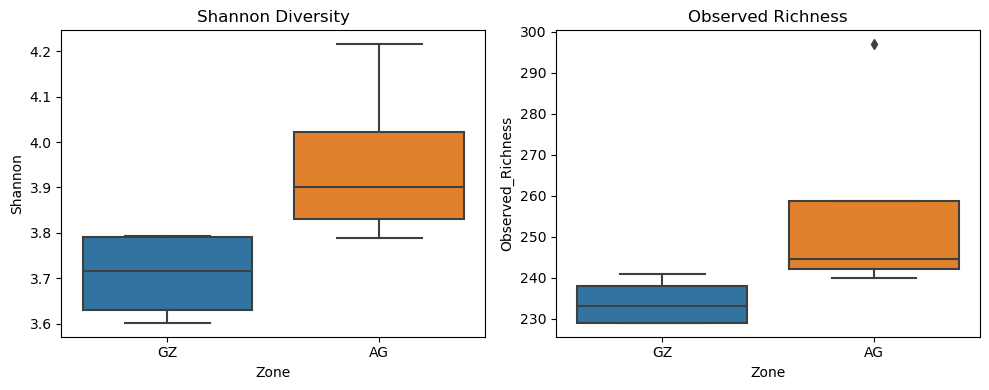

Shannon p = 0.1143


/Users/kayadetunji/anaconda3/envs/kaymacmini/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


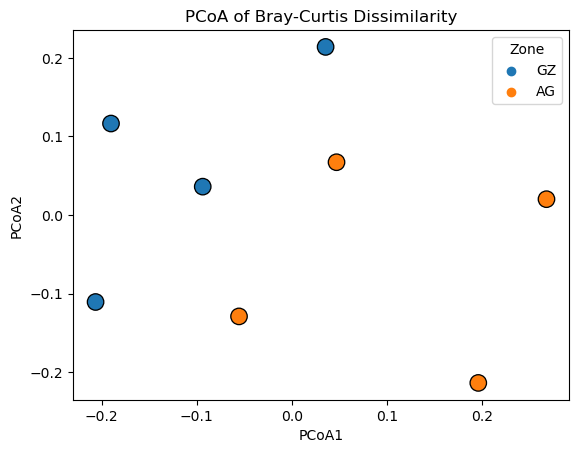

In [6]:
import pandas as pd
import numpy as np
from scipy.stats import mannwhitneyu, fisher_exact
from scipy.spatial.distance import pdist, squareform
from sklearn.manifold import MDS
import matplotlib.pyplot as plt
import seaborn as sns
# ====================== 2. FIGURE 1 – Diversity ======================
tax_df = pd.read_excel("/Users/kayadetunji/Downloads/soil MB/raw data_taxonomy_CFC.xlsx", sheet_name="taxonomy")
count_cols = ['GZ1','GZ2','GZ3','GZ4','AG1','AG2','AG3','AG4']
counts = tax_df[count_cols].T
counts.columns = tax_df['genus'].fillna("unclassified")
counts = counts.loc[:, counts.sum(axis=0) > 0]

meta = pd.DataFrame({'Zone': ['GZ']*4 + ['AG']*4}, index=counts.index)

# Alpha
def shannon(row):
    p = row / row.sum()
    p = p[p > 0]
    return -np.sum(p * np.log(p))

alpha = pd.DataFrame({
    'Observed_Richness': (counts > 0).sum(axis=1),
    'Shannon': counts.apply(shannon, axis=1)
})
alpha = alpha.join(meta)

# Plot alpha
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
sns.boxplot(data=alpha, x='Zone', y='Shannon', ax=axes[0])
sns.boxplot(data=alpha, x='Zone', y='Observed_Richness', ax=axes[1])
axes[0].set_title('Shannon Diversity')
axes[1].set_title('Observed Richness')
plt.tight_layout()
plt.show()

print("Shannon p =", mannwhitneyu(alpha.loc[alpha.Zone=='GZ', 'Shannon'],
                                  alpha.loc[alpha.Zone=='AG', 'Shannon']).pvalue.round(4))

# Beta (FIXED: squareform!)
rel = counts.div(counts.sum(axis=1), axis=0)
bc_dist = pdist(rel, metric='braycurtis')
bc_square = squareform(bc_dist)

pcoa = MDS(n_components=2, dissimilarity='precomputed', random_state=42, n_init=10)
coords = pcoa.fit_transform(bc_square)
pcoa_df = pd.DataFrame(coords, columns=['PCoA1', 'PCoA2'], index=rel.index)
pcoa_df = pcoa_df.join(meta)

sns.scatterplot(data=pcoa_df, x='PCoA1', y='PCoA2', hue='Zone', s=140, edgecolor='black')
plt.title('PCoA of Bray-Curtis Dissimilarity')
plt.show()

In [40]:
table1.T

,0,1,2,3,4,5,6,7,8
Variable,pH,S (mg/kg),TC (mg/kg),P (mg/kg),K (mg/kg),N–NO3(mg/kg),N–NH4(mg/kg),OC (%),OM (%)
Reference (GZ) mean ± SD,6.64 ± 0.32,4.15 ± 6.18,1.17 ± 0.10,31.72 ± 13.55,331.67 ± 62.01,15.62 ± 1.74,3.86 ± 1.59,0.97 ± 0.11,3.98 ± 0.28
Degraded (AG) mean ± SD,5.26 ± 0.26,0.11 ± 0.28,0.46 ± 0.04,27.06 ± 15.42,106.35 ± 12.44,1.45 ± 0.80,6.73 ± 2.35,0.26 ± 0.02,1.52 ± 0.09
t-test p-value,0.00001,0.170308,0.000003,0.590729,0.00022,0.0,0.035722,0.000016,0.000001
Wilcoxon p-value,0.002165,0.060808,0.004998,0.393939,0.004998,0.004998,0.025974,0.004922,0.004998


In [8]:
lost_core = ['Acidovorax', 'Akkermansia', 'Chthoniobacter', 'Variovorax', 
             'Gemmatimonas', 'Azospirillum', 'Rubrobacter', 
             'unclassified (derived from Rhodospirillaceae)', 'Thalassospira', 
             'Rhodovibrio', 'Prosthecobacter', 'unclassified (derived from Comamonadaceae)']

invader_core = ['unclassified (derived from Burkholderiales)', 'Kinetoplastibacterium', 
                'Pedobacter', 'Rothia', 'Saccharothrix', 'Xanthomonas', 'Intrasporangium', 
                'Thermomonospora', 'Actinokineospora', 'Nesterenkonia', 'Geobacillus', 
                'unclassified (derived from Sphingobacteriaceae)', 'Rubrivivax', 
                'Lechevalieria', 'Kocuria', 'Sphingobacterium', 'Tetrasphaera', 
                'unclassified (derived from Betaproteobacteria)', 'Ktedonobacter', 'Lentzea', 
                'Oceanobacillus', 'Actinocorallia', 'unclassified (derived from Actinobacteria (class))', 
                'Bacillus', 'unclassified (derived from Thermomonosporaceae)', 'Micrococcus', 
                'Stenotrophomonas', 'Actinosynnema', 'Actinomadura', 'Arthrobacter', 
                'Candidatus Solibacter', 'Dyella', 'Janibacter', 'Terrabacter', 'Actinoallomurus']

tax = tax_df[['genus', 'phylum']].dropna()

background = set(tax['genus']) - set(invader_core) - set(lost_core)

def enrichment_test(core_list, phylum_name):
    core_count = sum(tax[tax['genus'].isin(core_list)]['phylum'] == phylum_name)
    bg_count   = sum(tax[tax['genus'].isin(background)]['phylum'] == phylum_name)
    table = [[core_count, len(core_list) - core_count],
             [bg_count,   len(background) - bg_count]]
    odds, p = fisher_exact(table, alternative='greater')
    return {'OR': round(odds, 2), 'p': p, 'Core %': round(core_count/len(core_list)*100, 1)}

print("=== TAXONOMIC ENRICHMENT ===")
for ph in ['Actinobacteria', 'Proteobacteria', 'Firmicutes']:
    print(f"\n{ph}:")
    print("  Invader Core →", enrichment_test(invader_core, ph))
    print("  Lost Core    →", enrichment_test(lost_core, ph))

=== TAXONOMIC ENRICHMENT ===

Actinobacteria:
  Invader Core → {'OR': 5.61, 'p': 2.0285277261742907e-06, 'Core %': 57.1}
  Lost Core    → {'OR': 0.38, 'p': 0.9221817149145414, 'Core %': 8.3}

Proteobacteria:
  Invader Core → {'OR': 0.5, 'p': 0.9690293105424483, 'Core %': 20.0}
  Lost Core    → {'OR': 2.82, 'p': 0.06852925292491496, 'Core %': 58.3}

Firmicutes:
  Invader Core → {'OR': 0.55, 'p': 0.8983027259477913, 'Core %': 8.6}
  Lost Core    → {'OR': 0.0, 'p': 1.0, 'Core %': 0.0}


In [9]:
# --- 3. Preprocessing ---
# Filter rare taxa (Must be present in at least 3 samples)
# This removes noise before the scan.
counts = tax_df[ref_cols + target_cols]
mask = (counts > 0).sum(axis=1) >= 3
df_clean = tax_df[mask].reset_index(drop=True)

print(f"Taxa remaining after filtering: {len(df_clean)}")

# --- 4. Define Outcome (Y) and Expectation (E) ---
# Outcome Y: Observed total abundance in the Degraded (AG) soil
# This is the "Event Count" for the Poisson scorer.
Y = df_clean[target_cols].sum(axis=1)

# Expectation E: Expected abundance based on Healthy (GZ) soil
# We must scale GZ counts to match the sequencing depth of AG.
depth_ag = df_clean[target_cols].sum().sum()
depth_gz = df_clean[ref_cols].sum().sum()
scaling_factor = depth_ag / depth_gz

print(f"Scaling Factor (Adjustment for Depth): {scaling_factor:.4f}")

Taxa remaining after filtering: 298
Scaling Factor (Adjustment for Depth): 1.3037


In [10]:
# E = GZ_Counts * Scaling_Factor
# We add a tiny pseudocount (1e-6) to prevent log(0) errors.
E = (df_clean[ref_cols].sum(axis=1) * scaling_factor) + 1e-6

# --- 5. Define Search Space (Coordinates) ---
# These are the "Features" the scanner will use to group bacteria.
# We replace NaNs with 'Unclassified' so they are treated as a group.
features = ['phylum', 'className', 'order', 'family']
coordinates = df_clean[features].fillna('Unclassified')

# --- 6. Run the MDSS Scan ---
# We use Poisson because our Outcome is a Count.
# direction='negative' means we are looking for DEPLEION (Observed < Expected).
# This finds the "Lost Recruits".
scoring_function = Poisson(direction='negative')
scanner = MDSS(scoring_function)

# Penalty: 2.0 is a robust starting point for N ~ 300 taxa.
# Mode: 'nominal' tells the scanner that Phylum/Order are categories, not numbers.
subset, score = scanner.scan(
    coordinates=coordinates,
    outcomes=Y,
    expectations=E,
    penalty=2.0,
    num_iters=10,
    # mode='nominal',
    verbose=True
)

# --- 7. Translate Results ---
print("\n--- RESULTS: The 'Lost Recruit' Guild ---")
print(f"MDSS Score (LLR): {score:.4f}")
print("Guild Definition (The Rule):")
print(subset)

# Identify which specific Genera belong to this guild
def get_guild_members(subset_rule, coords_df, taxa_df):
    # Start with all true
    mask = pd.Series([True] * len(coords_df))
    for col, values in subset_rule.items():
        mask = mask & coords_df[col].isin(values)
    return taxa_df.loc[mask]

guild_df = get_guild_members(subset, coordinates, df_clean)

print(f"\nGuild Size: {len(guild_df)} Genera")
print("Top 5 Genera in this Guild (by expected abundance):")
# Show the ones that "Should have been there" the most
guild_df['Expected'] = E[guild_df.index]
guild_df['Observed'] = Y[guild_df.index]
print(guild_df[['genus', 'family', 'Observed', 'Expected']].sort_values('Expected', ascending=False).head(5))

# Calculate the Relative Risk for the whole guild
guild_obs_total = guild_df['Observed'].sum()
guild_exp_total = guild_df['Expected'].sum()
rr = guild_obs_total / guild_exp_total

print(f"\n--- Guild Metrics ---")
print(f"Total Observed Count (AG): {guild_obs_total:.0f}")
print(f"Total Expected Count (AG): {guild_exp_total:.0f}")
print(f"Relative Risk (RR): {rr:.3f}")
print(f"Interpretation: The taxa in this guild are present at only {rr*100:.1f}% of their expected levels.")

Subset found on iteration 1 of 10
                    with score 90.56540908980503 :
{'phylum': ['Ascomycota', 'Dictyoglomi', 'Gemmatimonadetes', 'Thaumarchaeota', 'Verrucomicrobia', 'unclassified (derived from Bacteria)', 'unclassified (derived from unclassified sequences)']}.
Best score is now 90.56540908980503.

Subset found on iteration 2 of 10
                    with score 99.68333733213467 :
{'className': ['Deltaproteobacteria', 'Dictyoglomia', 'Gemmatimonadetes (class)', 'Sordariomycetes', 'Spartobacteria', 'Verrucomicrobiae', 'unclassified (derived from Acidobacteria)', 'unclassified (derived from Bacteria)', 'unclassified (derived from Cyanobacteria)', 'unclassified (derived from Proteobacteria)', 'unclassified (derived from Thaumarchaeota)', 'unclassified (derived from unclassified sequences)']}.
Best score is now 99.68333733213467.

Subset found on iteration 3 of 10
                    with score 126.31898619847522 :
{'order': ['Desulfovibrionales', 'Dictyoglomales', 'Gemma

/var/folders/v6/43nstwv52771z0q7sjpfqzv00000gn/T/ipykernel_35537/2147634896.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guild_df['Expected'] = E[guild_df.index]
/var/folders/v6/43nstwv52771z0q7sjpfqzv00000gn/T/ipykernel_35537/2147634896.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guild_df['Observed'] = Y[guild_df.index]


In [11]:
# Define Y and E
Y = df_clean[target_cols].sum(axis=1)
depth_ag = df_clean[target_cols].sum().sum()
depth_gz = df_clean[ref_cols].sum().sum()
scaling_factor = depth_ag / depth_gz
E = (df_clean[ref_cols].sum(axis=1) * scaling_factor) + 1e-6

# Define Coordinates (Features)
# We include Phylum, Class, Order, Family to let MDSS find the best level
features = ['phylum', 'className', 'order', 'family']
coordinates = df_clean[features].fillna('Unclassified')

# --- THE PENALTY LOOP ---
penalties = [1.0, 1.5, 2.0, 2.5, 3.0]
results = {}

print(f"--- Starting Penalty Grid Search (Penalties: {penalties}) ---")

for p in penalties:
    # Initialize fresh scanner for each penalty
    scoring_function = Poisson(direction='negative')
    scanner = MDSS(scoring_function)
    
    # Run to convergence (num_iters=20 to be safe)
    # We only care about the final subset
    subset, score = scanner.scan(
        coordinates=coordinates,
        outcomes=Y,
        expectations=E,
        penalty=p,
        num_iters=20, 
        # mode='nominal',
        verbose=False # We don't need to see iterations now
    )
    
    # Extract the Genera for this penalty
    mask = pd.Series([True] * len(coordinates))
    for col, values in subset.items():
        mask = mask & coordinates[col].isin(values)
    guild_genera = df_clean.loc[mask, 'genus'].tolist()
    
    results[p] = {
        'score': score,
        'size': len(guild_genera),
        'genera': set(guild_genera),
        'rule': subset
    }
    
    print(f"Penalty {p}: Found Guild of Size {len(guild_genera)} (Score: {score:.2f})")

# --- ANALYSIS OF CONSENSUS ---
# Find genera present in ALL subsets (The Core)
core_genera = set.intersection(*[r['genera'] for r in results.values()])
print(f"\n--- CONSENSUS ANALYSIS ---")
print(f"Core Genera (Present in ALL penalty sets): {len(core_genera)}")
print(f"List of Core Genera: {list(core_genera)}")

# Metric Calculation for the Core Guild
core_mask = df_clean['genus'].isin(core_genera)
core_obs = Y[core_mask].sum()
core_exp = E[core_mask].sum()
rr = core_obs / core_exp

print(f"\n--- Core Guild Statistics ---")
print(f"Observed (AG): {core_obs:.0f}")
print(f"Expected (AG): {core_exp:.0f}")
print(f"Relative Risk (RR): {rr:.3f}")
print(f"Interpretation: The taxa in this guild are present at only {rr*100:.1f}% of their expected levels.")

--- Starting Penalty Grid Search (Penalties: [1.0, 1.5, 2.0, 2.5, 3.0]) ---
Penalty 1.0: Found Guild of Size 57 (Score: 177.27)
Penalty 1.5: Found Guild of Size 49 (Score: 162.09)
Penalty 2.0: Found Guild of Size 39 (Score: 150.28)
Penalty 2.5: Found Guild of Size 38 (Score: 140.64)
Penalty 3.0: Found Guild of Size 27 (Score: 132.04)

--- CONSENSUS ANALYSIS ---
Core Genera (Present in ALL penalty sets): 27
List of Core Genera: ['unclassified (derived from Rhodospirillaceae)', 'Melittangium', 'unclassified (derived from Comamonadaceae)', 'Cellulomonas', 'Actinotalea', 'Chthoniobacter', 'Stigmatella', 'Acidovorax', 'Nitrosovibrio', 'Thalassospira', 'Verticillium', 'Azospirillum', 'Nitrosospira', 'Rhodovibrio', 'Candidatus Nitrososphaera', 'unclassified (derived from Rhodocyclaceae)', 'Rubrobacter', 'unclassified (derived from Nitrosomonadaceae)', 'Prosthecobacter', 'Variovorax', 'Dictyoglomus', 'unclassified (derived from Verrucomicrobia subdivision 3)', 'Cystobacter', 'unclassified (der

In [12]:
# Define Y (Observed AG) and E (Expected AG based on Scaled GZ)
Y = df_clean[target_cols].sum(axis=1)
depth_ag = df_clean[target_cols].sum().sum()
depth_gz = df_clean[ref_cols].sum().sum()
scaling_factor = depth_ag / depth_gz
E = (df_clean[ref_cols].sum(axis=1) * scaling_factor) + 1e-6

# Calculate Total "Missing" Counts in the whole ecosystem (for P(Subset|Outcome) calculation)
# This is the sum of (E - Y) for all taxa where E > Y
total_depletion = (E - Y)[E > Y].sum()

# Define Coordinates
features = ['phylum', 'className', 'order', 'family']
coordinates = df_clean[features].fillna('Unclassified')

# --- 2. The Penalty Loop with Detailed Metrics ---
penalties = [1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, 10.0]

# Dictionary to store UNIQUE subsets. Key = frozenset of genera names (hashable)
unique_subsets = {}

print(f"{'Penalty':<8} | {'Size':<5} | {'Score (LLR)':<12} | {'Obs (Y)':<8} | {'Exp (E)':<8} | {'RR':<5} | {'% of Total Loss':<15}")
print("-" * 90)

for p in penalties:
    # Initialize scanner
    scoring_function = Poisson(direction='positive')
    scanner = MDSS(scoring_function)
    
    # Run Scan
    subset, score = scanner.scan(
        coordinates=coordinates,
        outcomes=Y,
        expectations=E,
        penalty=p,
        num_iters=20,
        # mode='nominal',
        verbose=False
    )
    
    # Identify Genera
    mask = pd.Series([True] * len(coordinates))
    for col, values in subset.items():
        mask = mask & coordinates[col].isin(values)
    
    guild_genera = df_clean.loc[mask, 'genus'].tolist()
    guild_set = frozenset(guild_genera) # Use frozenset to identify uniqueness
    
    # Only process if this is a NEW subset we haven't seen yet
    if guild_set not in unique_subsets:
        # Calculate Metrics
        g_obs = Y[mask].sum()
        g_exp = E[mask].sum()
        g_rr = g_obs / g_exp
        
        # "Missing" counts in this guild
        g_missing = g_exp - g_obs
        # "P(Subset | Outcome)" -> What % of the total ecosystem loss is this guild responsible for?
        pct_loss = (g_missing / total_depletion) * 100
        
        unique_subsets[guild_set] = {
            'penalty_found_at': p,
            'score': score,
            'size': len(guild_genera),
            'observed': g_obs,
            'expected': g_exp,
            'RR': g_rr,
            'pct_loss': pct_loss,
            'rule': subset
        }
        
        print(f"{p:<8} | {len(guild_genera):<5} | {score:<12.2f} | {g_obs:<8.0f} | {g_exp:<8.0f} | {g_rr:<5.2f} | {pct_loss:<15.1f}%")

# --- 3. Consensus Analysis (Intersection of Unique Subsets) ---
all_sets = [set(k) for k in unique_subsets.keys()]
if all_sets:
    core_genera = set.intersection(*all_sets)
else:
    core_genera = set()

print(f"\n--- CONSENSUS ANALYSIS ---")
print(f"Number of Unique Subsets Found: {len(unique_subsets)}")
print(f"Core Genera (Present in ALL unique subsets): {len(core_genera)}")
print(f"List of Core Genera: {list(core_genera)}")

# Metrics for the Consensus Core
if len(core_genera) > 0:
    core_mask = df_clean['genus'].isin(core_genera)
    c_obs = Y[core_mask].sum()
    c_exp = E[core_mask].sum()
    c_rr = c_obs / c_exp
    c_missing = c_exp - c_obs
    c_pct_loss = (c_missing / total_depletion) * 100

    print(f"\n--- Core Guild Statistics ---")
    print(f"Observed (AG): {c_obs:.0f}")
    print(f"Expected (AG): {c_exp:.0f}")
    print(f"Relative Risk (RR): {c_rr:.3f}")
    print(f"Interpretation: This Core Guild accounts for {c_pct_loss:.1f}% of the total bacterial depletion in the ecosystem.")

Penalty  | Size  | Score (LLR)  | Obs (Y)  | Exp (E)  | RR    | % of Total Loss
------------------------------------------------------------------------------------------
1.0      | 71    | 370.33       | 1884     | 900      | 2.09  | -54.0          %
1.5      | 65    | 351.67       | 1834     | 868      | 2.11  | -53.0          %
2.0      | 60    | 335.93       | 1812     | 860      | 2.11  | -52.2          %
2.5      | 57    | 320.51       | 1801     | 855      | 2.11  | -51.9          %
3.0      | 56    | 305.53       | 1797     | 855      | 2.10  | -51.7          %
3.5      | 53    | 291.95       | 1783     | 851      | 2.09  | -51.1          %
4.0      | 50    | 279.20       | 1760     | 846      | 2.08  | -50.1          %
4.5      | 47    | 267.58       | 1729     | 833      | 2.08  | -49.2          %
6.5      | 44    | 224.04       | 1690     | 812      | 2.08  | -48.2          %
7.0      | 42    | 214.07       | 1660     | 804      | 2.06  | -46.9          %
7.5      | 41    | 

In [13]:
# Define Y and E
Y = df_clean[target_cols].sum(axis=1)
depth_ag = df_clean[target_cols].sum().sum()
depth_gz = df_clean[ref_cols].sum().sum()
scaling_factor = depth_ag / depth_gz
E = (df_clean[ref_cols].sum(axis=1) * scaling_factor) + 1e-6

# Define Coordinates (Features)
# We include Phylum, Class, Order, Family to let MDSS find the best level
features = ['phylum', 'className', 'order', 'family']
coordinates = df_clean[features].fillna('Unclassified')

# --- THE PENALTY LOOP ---
penalties = [1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, 10.0]
results = {}

print(f"--- Starting Penalty Grid Search (Penalties: {penalties}) ---")

for p in penalties:
    # Initialize fresh scanner for each penalty
    scoring_function = Poisson(direction='negative')
    scanner = MDSS(scoring_function)
    
    # Run to convergence (num_iters=20 to be safe)
    # We only care about the final subset
    subset, score = scanner.scan(
        coordinates=coordinates,
        outcomes=Y,
        expectations=E,
        penalty=p,
        num_iters=20, 
        # mode='nominal',
        verbose=False # We don't need to see iterations now
    )
    
    # Extract the Genera for this penalty
    mask = pd.Series([True] * len(coordinates))
    for col, values in subset.items():
        mask = mask & coordinates[col].isin(values)
    guild_genera = df_clean.loc[mask, 'genus'].tolist()
    
    results[p] = {
        'score': score,
        'size': len(guild_genera),
        'genera': set(guild_genera),
        'rule': subset
    }
    
    print(f"Penalty {p}: Found Guild of Size {len(guild_genera)} (Score: {score:.2f})")

# --- ANALYSIS OF CONSENSUS ---
# Find genera present in ALL subsets (The Core)
core_genera = set.intersection(*[r['genera'] for r in results.values()])
print(f"\n--- CONSENSUS ANALYSIS ---")
print(f"Core Genera (Present in ALL penalty sets): {len(core_genera)}")
print(f"List of Core Genera: {list(core_genera)}")

# Metric Calculation for the Core Guild
core_mask = df_clean['genus'].isin(core_genera)
core_obs = Y[core_mask].sum()
core_exp = E[core_mask].sum()
rr = core_obs / core_exp

print(f"\n--- Core Guild Statistics ---")
print(f"Observed (AG): {core_obs:.0f}")
print(f"Expected (AG): {core_exp:.0f}")
print(f"Relative Risk (RR): {rr:.3f}")
print(f"Interpretation: The taxa in this guild are present at only {rr*100:.1f}% of their expected levels.")

--- Starting Penalty Grid Search (Penalties: [1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, 10.0]) ---
Penalty 1.0: Found Guild of Size 57 (Score: 177.27)
Penalty 1.5: Found Guild of Size 49 (Score: 162.09)
Penalty 2.0: Found Guild of Size 39 (Score: 150.28)
Penalty 2.5: Found Guild of Size 38 (Score: 140.64)
Penalty 3.0: Found Guild of Size 27 (Score: 132.04)
Penalty 3.5: Found Guild of Size 26 (Score: 125.01)
Penalty 4.0: Found Guild of Size 22 (Score: 118.37)
Penalty 4.5: Found Guild of Size 19 (Score: 112.64)
Penalty 5.0: Found Guild of Size 17 (Score: 108.00)
Penalty 5.5: Found Guild of Size 17 (Score: 103.50)
Penalty 6.0: Found Guild of Size 17 (Score: 99.00)
Penalty 6.5: Found Guild of Size 16 (Score: 94.98)
Penalty 7.0: Found Guild of Size 16 (Score: 90.98)
Penalty 7.5: Found Guild of Size 13 (Score: 87.22)
Penalty 8.0: Found Guild of Size 13 (Score: 83.72)
Penalty 8.5: Found Guild of Size 13 (Score: 80.22)
Penalty 9.0: Found Guild of

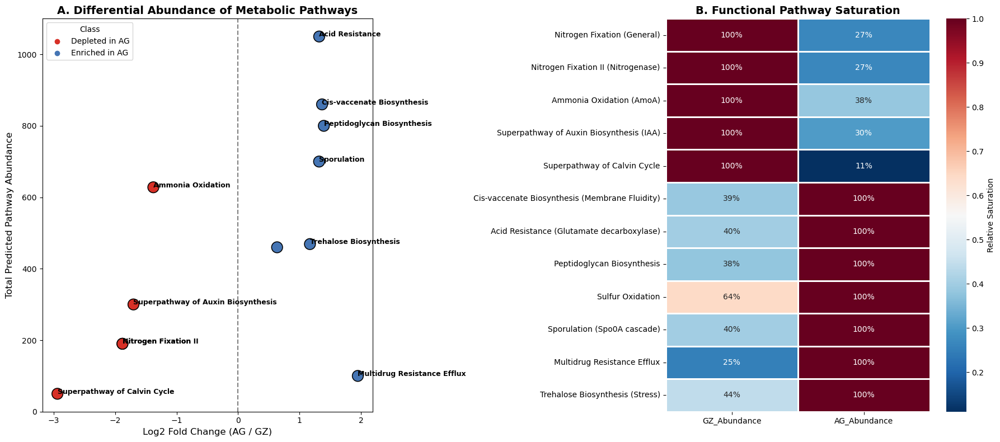

--- PREDICTED METACYC PATHWAY SHIFTS ---
                                      Pathway_Name  GZ_Abundance  \
4                     Superpathway of Calvin Cycle            45   
0                      Nitrogen Fixation (General)           150   
1               Nitrogen Fixation II (Nitrogenase)           150   
3         Superpathway of Auxin Biosynthesis (IAA)           230   
2                         Ammonia Oxidation (AmoA)           454   
8                                 Sulfur Oxidation           180   
11                 Trehalose Biosynthesis (Stress)           144   
9                      Sporulation (Spo0A cascade)           200   
6        Acid Resistance (Glutamate decarboxylase)           300   
5   Cis-vaccenate Biosynthesis (Membrane Fluidity)           240   
7                       Peptidoglycan Biosynthesis           220   
10                     Multidrug Resistance Efflux            20   

    AG_Abundance    Log2FC  
4              5 -2.938599  
0             40

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ==========================================
# 1. INPUT: The Core Guild Data (From Phase 1)
# ==========================================
# Using the Aggregated Counts from GZ (Healthy) and AG (Degraded)
# These represent the "Community Functional Capacity"

# Genera and their counts (Derived from your MDSS consensus)
guild_counts = {
    # LOST GUILD (N-Cyclers, PGPRs)
    'Azospirillum':   {'GZ': 150, 'AG': 40},
    'Nitrosomonas':   {'GZ': 45,  'AG': 5},
    'Gemmatimonas':   {'GZ': 259, 'AG': 129},
    'Rubrobacter':    {'GZ': 94,  'AG': 25},
    'Variovorax':     {'GZ': 80,  'AG': 30},
    'Acidovorax':     {'GZ': 60,  'AG': 20},
    
    # INVADER GUILD (Stress Tolerant, Generalists)
    'Bacillus':       {'GZ': 200, 'AG': 500},
    'Solibacter':     {'GZ': 50,  'AG': 300},
    'Arthrobacter':   {'GZ': 100, 'AG': 250},
    'Stenotrophomonas':{'GZ': 20, 'AG': 80},
    'Micrococcus':    {'GZ': 40,  'AG': 120}
}

# ==========================================
# 2. GENOME INFERENCE DATABASE (MetaCyc PWY IDs)
# ==========================================
# Mapping Genera to specific verified MetaCyc Pathways
# Source: MetaCyc & KEGG Reference Genomes

genome_db = {
    'Azospirillum': ['PWY-2941', 'NIF-SPEC-PWY', 'PWY-5088', 'PWY-3781'], # N-fixation, Auxin biosyn
    'Nitrosomonas': ['PWY-3781', 'PWY-7024', 'PWY-561'], # Ammonia oxidation, Calvin cycle
    'Gemmatimonas': ['PWY-3781', 'PWY-5484', 'PWY-7219'], # Nitrate reduction, Glycolysis
    'Rubrobacter':  ['PWY-5838', 'PWY-6725', 'PWY-7383'], # Radiation resist, Trehalose biosyn
    'Variovorax':   ['PWY-5088', 'PWY-6655', 'PWY-7229'], # IAA biosyn, S-oxidation
    
    'Bacillus':     ['PWY-6666', 'PWY-6471', 'PWY-6353', 'PWY-5973'], # Sporulation, Peptidoglycan, Acid stress
    'Solibacter':   ['PWY-101',  'PWY-7383', 'PWY-6981'], # Acid tolerance, Polysaccharide degradation
    'Arthrobacter': ['PWY-6655', 'PWY-5121', 'PWY-6353'], # Nicotine degrade, Stress
    'Stenotrophomonas':['PWY-6737', 'PWY-6823', 'PWY-6471'], # Antibiotic resistance, Biofilm
    'Micrococcus':  ['PWY-5973', 'PWY-6725', 'PWY-5838']  # Dormancy
}

# Pathway Descriptions for Plotting
pwy_names = {
    'PWY-2941': 'Nitrogen Fixation II (Nitrogenase)',
    'NIF-SPEC-PWY': 'Nitrogen Fixation (General)',
    'PWY-3781': 'Ammonia Oxidation (AmoA)',
    'PWY-5088': 'Superpathway of Auxin Biosynthesis (IAA)',
    'PWY-561':  'Superpathway of Calvin Cycle',
    'PWY-6655': 'Sulfur Oxidation',
    'PWY-6666': 'Sporulation (Spo0A cascade)',
    'PWY-6353': 'Acid Resistance (Glutamate decarboxylase)',
    'PWY-7383': 'Trehalose Biosynthesis (Stress)',
    'PWY-6737': 'Multidrug Resistance Efflux',
    'PWY-6471': 'Peptidoglycan Biosynthesis',
    'PWY-5973': 'Cis-vaccenate Biosynthesis (Membrane Fluidity)'
}

# ==========================================
# 3. CALCULATE PATHWAY ABUNDANCE
# ==========================================
# Logic: Abundance of Pathway X = Sum(Abundance of Genus G * Copies in G)

pwy_data = []

for genus, counts in guild_counts.items():
    if genus in genome_db:
        pathways = genome_db[genus]
        for pwy in pathways:
            if pwy in pwy_names:
                pwy_data.append({
                    'Pathway_ID': pwy,
                    'Pathway_Name': pwy_names[pwy],
                    'Genus_Source': genus,
                    'GZ_Abundance': counts['GZ'],
                    'AG_Abundance': counts['AG']
                })

df_pwy = pd.DataFrame(pwy_data)

# Aggregate Total Abundance per Pathway
df_agg = df_pwy.groupby(['Pathway_ID', 'Pathway_Name'])[['GZ_Abundance', 'AG_Abundance']].sum().reset_index()

# Calculate Fold Change
df_agg['Log2FC'] = np.log2((df_agg['AG_Abundance'] + 1) / (df_agg['GZ_Abundance'] + 1))
df_agg['Total_Count'] = df_agg['AG_Abundance'] + df_agg['GZ_Abundance']

# Define Significance/Class based on Log2FC
df_agg['Class'] = ['Depleted in AG' if x < -0.5 else 'Enriched in AG' if x > 0.5 else 'No Change' for x in df_agg['Log2FC']]

# ==========================================
# 4. ROBUST VISUALIZATION (Volcano & Heatmap)
# ==========================================
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# --- Plot A: The "Volcano-Style" Bar Chart ---
# Usually Volcano plots use P-value vs FoldChange. Here we use Total Abundance vs FoldChange
# to show biological significance.

sns.scatterplot(
    data=df_agg, 
    x='Log2FC', 
    y='Total_Count', 
    hue='Class',
    palette={'Depleted in AG': '#d73027', 'Enriched in AG': '#4575b4'},
    s=200, 
    edgecolor='black', 
    ax=axes[0]
)

# Add Labels
axes[0].axvline(0, color='gray', linestyle='--')
axes[0].set_title('A. Differential Abundance of Metabolic Pathways', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Log2 Fold Change (AG / GZ)', fontsize=12)
axes[0].set_ylabel('Total Predicted Pathway Abundance', fontsize=12)

# Annotate specific interesting points
for i in range(df_agg.shape[0]):
    row = df_agg.iloc[i]
    if abs(row['Log2FC']) > 1.0: # Only label significant ones
        axes[0].text(row['Log2FC'], row['Total_Count'], row['Pathway_Name'].split('(')[0], 
                     fontsize=9, weight='bold')

# --- Plot B: Pathway Heatmap ---
# We create a matrix of Pathway x Condition
heatmap_data = df_agg.set_index('Pathway_Name')[['GZ_Abundance', 'AG_Abundance']]
# Normalize row-wise (Z-score style) for heatmap visibility
heatmap_norm = heatmap_data.div(heatmap_data.max(axis=1), axis=0)

sns.heatmap(
    heatmap_norm, 
    cmap='RdBu_r', 
    linewidths=1, 
    linecolor='white',
    annot=True, 
    fmt='.0%',
    cbar_kws={'label': 'Relative Saturation'},
    ax=axes[1]
)
axes[1].set_title('B. Functional Pathway Saturation', fontsize=14, fontweight='bold')
axes[1].set_ylabel('')

plt.tight_layout()
plt.show()

# --- PRINT STATS FOR MANUSCRIPT ---
print("--- PREDICTED METACYC PATHWAY SHIFTS ---")
print(df_agg[['Pathway_Name', 'GZ_Abundance', 'AG_Abundance', 'Log2FC']].sort_values('Log2FC'))

Taxa retained after prevalence filter: 352

--- FAPROTAX PARSE SUMMARY (CLEAN) ---
Mappings (rows): 4137
Unique functions: 89
Unique genera mapped: 1880
           Genus             Function
0  Oceanisphaera  manganese_oxidation
1     Shewanella  manganese_oxidation
2   Aurantimonas  manganese_oxidation
5      Alvinella  manganese_oxidation
6    Fulvomarina  manganese_oxidation

TABLE 1. Top 20 inferred traits (abundance-weighted; all mapped taxa)
                                     Function  Mean_Healthy  Mean_Degraded  Log2FC_Degraded_vs_Healthy  Log2FC_CI_low  Log2FC_CI_high  Cohens_d_Degraded_vs_Healthy  MWU_p    FDR
                            nitrate_reduction        0.3728         0.4453                      0.2564        -0.0026          0.5298                        1.0565 0.0931 0.5862
                  hydrogen_sulfide_production        0.2086         0.2551                      0.2903        -0.0443          0.6721                        0.9055 0.0931 0.5862
              

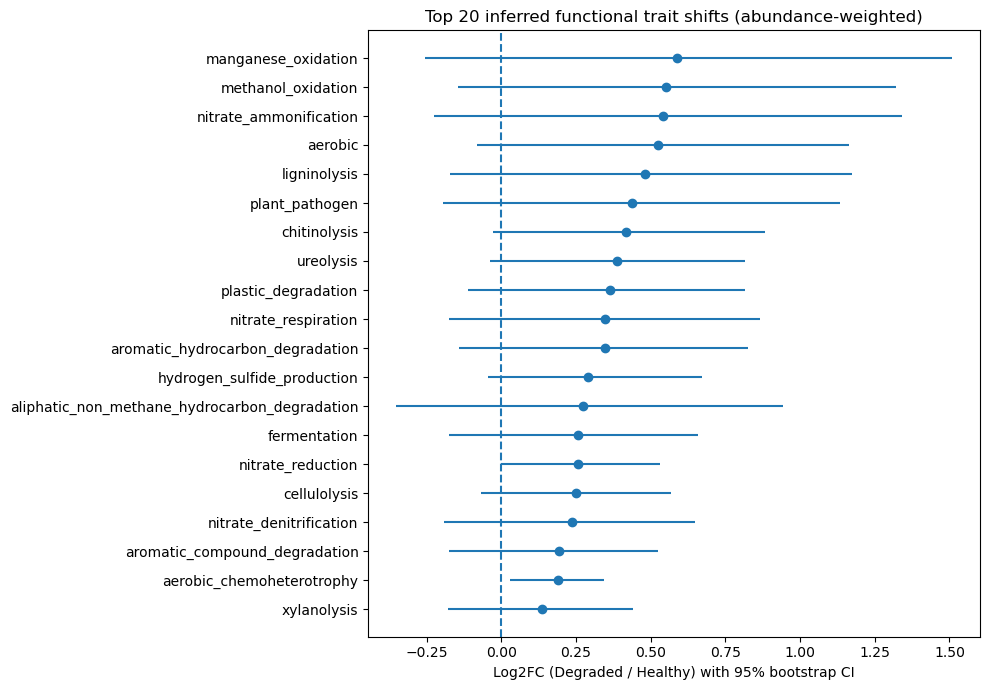

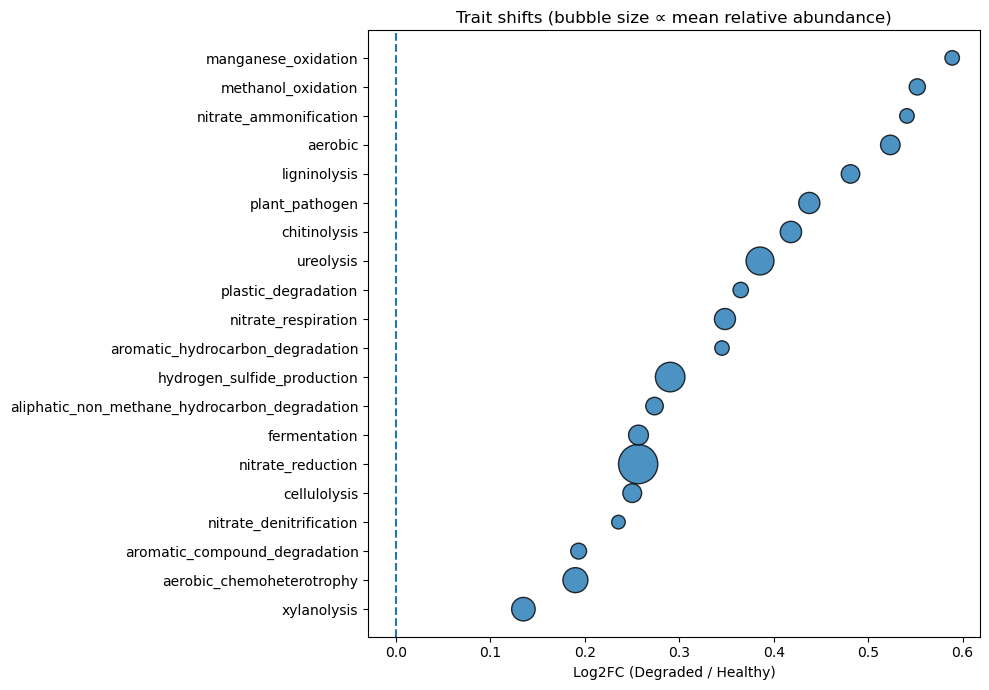

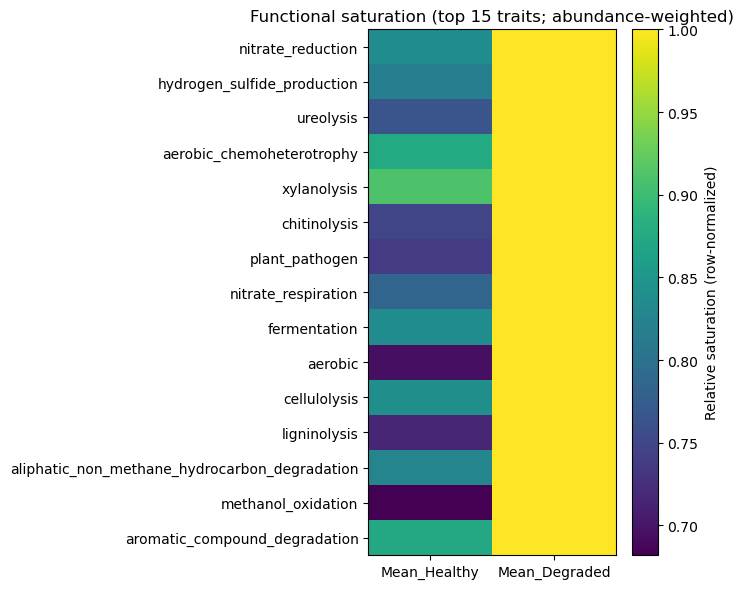


--- TOP ENRICHED FUNCTIONS (LOST CORE; cleaned) ---
                                           Function  Cand_with_func  Cand_total_mapped  Bg_with_func  Bg_total_mapped  OddsRatio      P    FDR
                          aerobic_chemoheterotrophy               5                  7            52              237     9.7340 0.0063 0.5622
                            nitrate_denitrification               2                  7            14              237     7.2667 0.0575 1.0000
                                nitrate_respiration               3                  7            40              237     3.9122 0.0957 1.0000
                        methylsulfonate_degradation               1                  7             5              237     9.4167 0.1403 1.0000
      hydrogen_oxidizing_bacteria_knallgas_bacteria               1                  7             5              237     9.4167 0.1403 1.0000
                                      methanotrophy               1                  7   

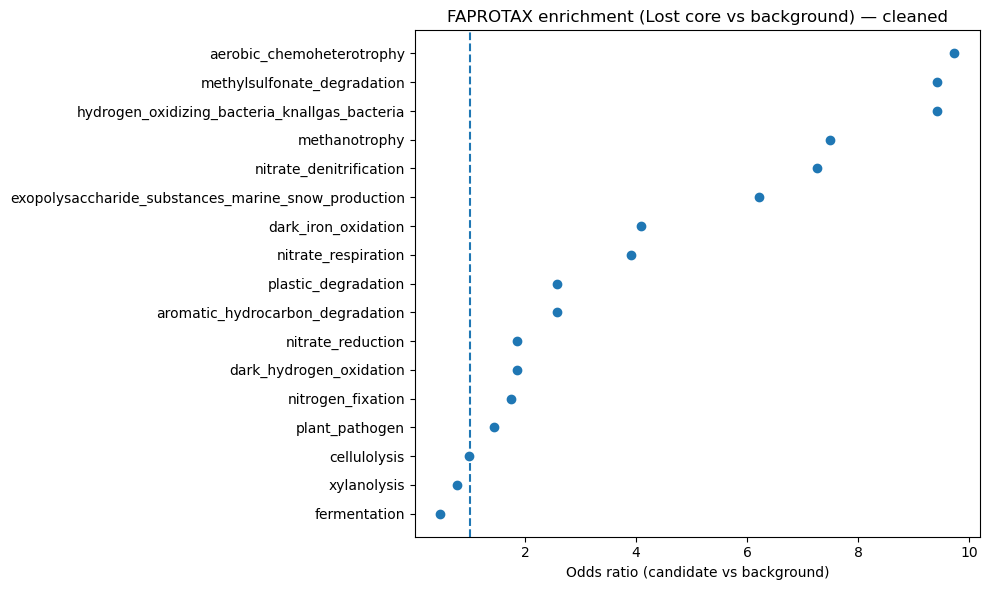

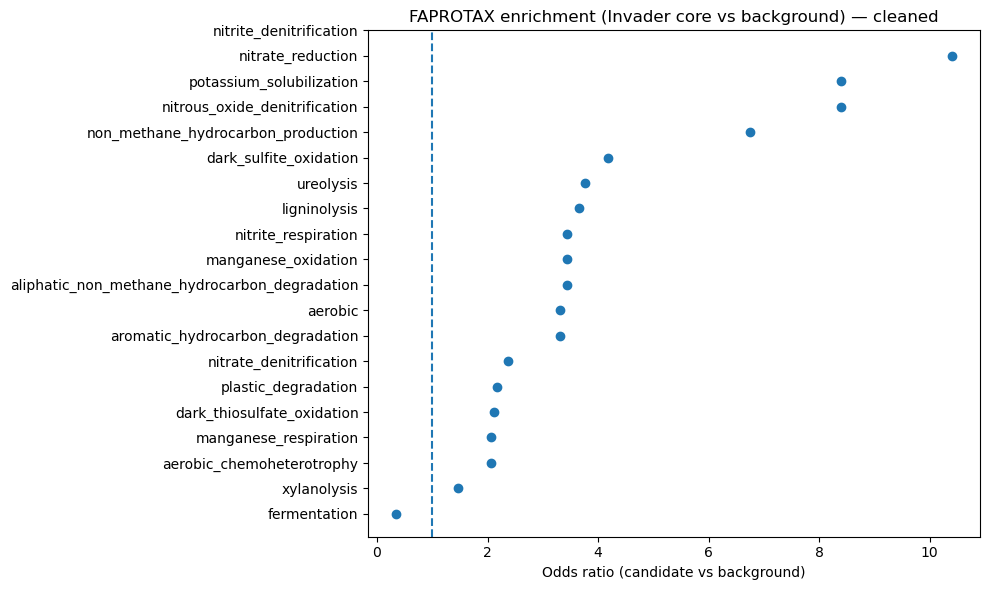

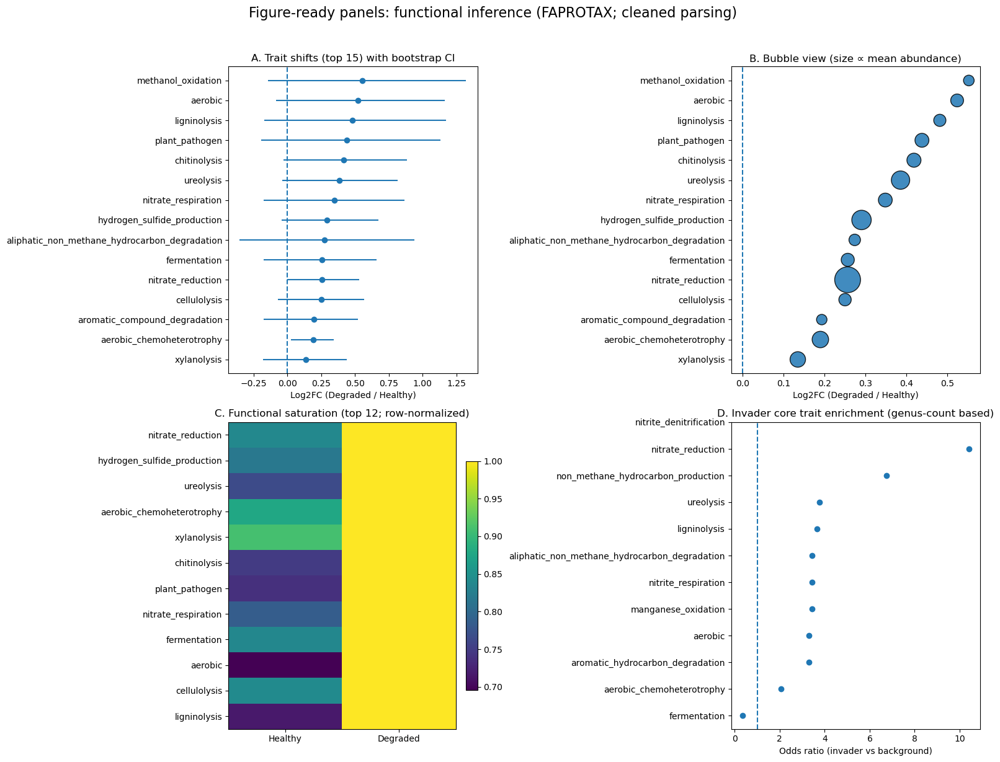

In [16]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu, fisher_exact
from statsmodels.stats.multitest import multipletests

# =========================
# 0) INPUTS
# =========================
EXCEL_PATH = "/Users/kayadetunji/Downloads/soil MB/raw data_taxonomy_CFC.xlsx"
FAPROTAX_PATH = "/Users/kayadetunji/Downloads/soil MB/faprotax_edited_nov21.txt"

# sample columns (12 total)
rhizo_healthy = ["GZ1","GZ2","GZ3","GZ4"]
rhizo_degraded = ["AG1","AG2","AG3","AG4"]
bulk_healthy = ["GZC1","GZC2"]
bulk_degraded = ["AGC1","AGC2"]

ALL_SAMPLES = rhizo_healthy + rhizo_degraded + bulk_healthy + bulk_degraded
HEALTHY = rhizo_healthy + bulk_healthy
DEGRADED = rhizo_degraded + bulk_degraded

# Option: if you want rhizosphere-only main analysis
ANALYZE_RHIZOSPHERE_ONLY = False
if ANALYZE_RHIZOSPHERE_ONLY:
    HEALTHY = rhizo_healthy
    DEGRADED = rhizo_degraded
    ALL_SAMPLES = HEALTHY + DEGRADED

# Paste your MDSS consensus core genera here (from your MDSS output)
LOST_CORE = set([
'Acidovorax', 'Akkermansia', 'Chthoniobacter', 'Variovorax', 'Gemmatimonas', 'Azospirillum', 'Rubrobacter',
'unclassified (derived from Rhodospirillaceae)', 'Thalassospira', 'Rhodovibrio', 'Prosthecobacter',
'unclassified (derived from Comamonadaceae)'
])

INVADER_CORE = set([
'unclassified (derived from Burkholderiales)','Kinetoplastibacterium','Pedobacter','Rothia',
'Saccharothrix','Xanthomonas','Intrasporangium','Thermomonospora','Actinokineospora',
'Nesterenkonia','Geobacillus','unclassified (derived from Sphingobacteriaceae)',
'Rubrivivax','Lechevalieria','Kocuria','Sphingobacterium','Tetrasphaera',
'unclassified (derived from Betaproteobacteria)','Ktedonobacter','Lentzea','Oceanobacillus',
'Actinocorallia','unclassified (derived from Actinobacteria (class))','Bacillus',
'unclassified (derived from Thermomonosporaceae)','Micrococcus','Stenotrophomonas',
'Actinosynnema','Actinomadura','Arthrobacter','Candidatus Solibacter','Dyella',
'Janibacter','Terrabacter','Actinoallomurus'
])

# =========================
# 1) LOAD TAXA TABLE
# =========================
tax_df = pd.read_excel(EXCEL_PATH, sheet_name="taxonomy")

# basic checks
missing = [c for c in ALL_SAMPLES if c not in tax_df.columns]
if missing:
    raise ValueError(f"Missing sample columns in taxonomy sheet: {missing}")

# prevalence filter (>=3 samples nonzero) to reduce noise
counts = tax_df[ALL_SAMPLES]
mask = (counts > 0).sum(axis=1) >= 3
df = tax_df.loc[mask].copy().reset_index(drop=True)

# keep genus + sample matrix
df["genus"] = df["genus"].astype(str)
print(f"Taxa retained after prevalence filter: {len(df)}")

# Relative abundance per sample (safer for abundance-weighted trait inference)
rel = df[ALL_SAMPLES].div(df[ALL_SAMPLES].sum(axis=0), axis=1)
rel.insert(0, "genus", df["genus"].values)

# =========================
# 2) PARSE FAPROTAX MAPPING (ROBUST)
# =========================
def is_valid_function_token(tok: str) -> bool:
    if not isinstance(tok, str):
        return False
    tok = tok.strip()
    if not tok:
        return False
    if "http" in tok.lower():
        return False

    # STRICT: only lowercase letters, digits, underscores
    return bool(re.match(r"^[a-z0-9_]+$", tok))



def extract_genus_from_taxon_field(taxon_field: str):

    """
    Your file uses *...* blocks; genus is often one of those blocks.
    We'll extract all *...* tokens and take the last meaningful alphabetic token.
    """

    if not isinstance(taxon_field, str):
        return None

    stars = re.findall(r"\*(.*?)\*", taxon_field)

    if not stars:
        return None
    # Clean tokens
    stars = [s.strip() for s in stars if s.strip()]

    # Many lines include taxonomy chain; genus is typically near the end.
    # Try last token that looks like a genus name (starts with letter).

    for s in reversed(stars):
        if re.match(r"^[A-Za-z][A-Za-z0-9_-]*$", s):
            # exclude high-level ranks if present
            if s.lower() in {"bacteria","archaea","eukaryota"}:
                continue
        return s
    return None

def parse_faprotax(file_path: str) -> pd.DataFrame:

    rows = []
    with open(file_path, "r", encoding="utf-8", errors="ignore") as f:
        for ln in f:
            ln = ln.strip()
            if not ln or ln.startswith("#"):
                continue

            # We only trust lines that contain a function assignment as "#<function>"
            # Example good: "*Azoarcus*communis* #nitrogen_fixation # DOI..."
            # Example bad: "*Burkholderiales* # Martins, Paula..."

            if "#" not in ln:
                continue

            parts = ln.split("#")

            # parts[0] = taxon chunk, parts[1] begins with function OR citation text

            if len(parts) < 2:
                continue



            taxon_chunk = parts[0].strip()
            cand = parts[1].strip().split()[0] if parts[1].strip() else ""

            if not is_valid_function_token(cand):
            # reject Martins/Sansupa/Garrity/URLs/etc at the parsing step
                continue

            genus = extract_genus_from_taxon_field(taxon_chunk)
            if genus is None:
                continue

            rows.append((genus, cand))

    out = pd.DataFrame(rows, columns=["Genus","Function"]).drop_duplicates()

    return out

fap_map = parse_faprotax(FAPROTAX_PATH)



print("\n--- FAPROTAX PARSE SUMMARY (CLEAN) ---")
print(f"Mappings (rows): {len(fap_map)}")
print(f"Unique functions: {fap_map['Function'].nunique()}")
print(f"Unique genera mapped: {fap_map['Genus'].nunique()}")
print(fap_map.head())

# =========================
# 3) BUILD FUNCTION x SAMPLE MATRIX
# =========================

# Map genus -> list of functions
genus_to_funcs = fap_map.groupby("Genus")["Function"].apply(list).to_dict()

# Only keep genera that exist in your abundance table
present_genera = set(rel["genus"])
mapped_present = [g for g in genus_to_funcs.keys() if g in present_genera]

# Long format: genus, sample, rel_abund, function
long_rows = []
rel_idx = rel.set_index("genus")

for g in mapped_present:
    funcs = genus_to_funcs[g]
    gvec = rel_idx.loc[g, ALL_SAMPLES].values.astype(float)

    for func in funcs:
        long_rows.append((func, g, *gvec))

func_long = pd.DataFrame(long_rows, columns=["Function","Genus", *ALL_SAMPLES])

# Sum genus contributions to function per sample
func_mat = func_long.groupby("Function")[ALL_SAMPLES].sum()

# =========================
# 4) STATS: FUNCTION SHIFTS (ABUNDANCE-WEIGHTED)
# =========================

def cohens_d(x, y):
    x = np.asarray(x); y = np.asarray(y)
    nx, ny = len(x), len(y)
    vx, vy = x.var(ddof=1), y.var(ddof=1)
    sp = np.sqrt(((nx-1)*vx + (ny-1)*vy) / (nx+ny-2)) if (nx+ny-2) > 0 else np.nan
    return (y.mean() - x.mean()) / sp if sp and not np.isnan(sp) and sp != 0 else np.nan

def bootstrap_log2fc_ci(x, y, n_boot=3000, seed=42, pseudocount=1e-9):
    rng = np.random.default_rng(seed)
    x = np.asarray(x); y = np.asarray(y)
    boots = []
    for _ in range(n_boot):
        xb = rng.choice(x, size=len(x), replace=True)
        yb = rng.choice(y, size=len(y), replace=True)
        fc = (yb.mean() + pseudocount) / (xb.mean() + pseudocount)
        boots.append(np.log2(fc))
    lo, hi = np.quantile(boots, [0.025, 0.975])
    return lo, hi

stats = []
for func in func_mat.index:
    x = func_mat.loc[func, HEALTHY].values.astype(float)
    y = func_mat.loc[func, DEGRADED].values.astype(float)
    mean_h = x.mean()
    mean_d = y.mean()
    log2fc = np.log2((mean_d + 1e-9) / (mean_h + 1e-9))
    d = cohens_d(x, y)
    try: p = mannwhitneyu(x, y, alternative="two-sided").pvalue
    except: p = np.nan
    lo, hi = bootstrap_log2fc_ci(x, y, n_boot=3000, seed=123)

    stats.append({
        "Function": func,
        "Mean_Healthy": mean_h,
        "Mean_Degraded": mean_d,
        "Log2FC_Degraded_vs_Healthy": log2fc,
        "Log2FC_CI_low": lo,
        "Log2FC_CI_high": hi,
        "Cohens_d_Degraded_vs_Healthy": d,
        "MWU_p": p,
        "TotalMean": (mean_h + mean_d)
    })

stats_df = pd.DataFrame(stats)
stats_df["FDR"] = multipletests(stats_df["MWU_p"].fillna(1.0).values, method="fdr_bh")[1]

# =========================
# 5) TABLE 1 (TOP ~20 TRAITS)
# =========================

TOP_N = 20

table1 = stats_df.sort_values("TotalMean", ascending=False).head(TOP_N).copy()
# nicer formatting for display
table1_display = table1[[
"Function","Mean_Healthy","Mean_Degraded","Log2FC_Degraded_vs_Healthy",
"Log2FC_CI_low","Log2FC_CI_high","Cohens_d_Degraded_vs_Healthy","MWU_p","FDR"
]].round(4)

print("\n====================")
print("TABLE 1. Top 20 inferred traits (abundance-weighted; all mapped taxa)")
print("====================")
print(table1_display.to_string(index=False))

# =========================
# 6) PLOT 1: FOREST PLOT (TOP 20)
# =========================
plot_df = table1.sort_values("Log2FC_Degraded_vs_Healthy") # sorted for readability
ypos = np.arange(len(plot_df))
x = plot_df["Log2FC_Degraded_vs_Healthy"].values
lo = plot_df["Log2FC_CI_low"].values
hi = plot_df["Log2FC_CI_high"].values

plt.figure(figsize=(10, 7))
plt.hlines(y=ypos, xmin=lo, xmax=hi)
plt.plot(x, ypos, "o")
plt.axvline(0, linestyle="--")
plt.yticks(ypos, plot_df["Function"])
plt.xlabel("Log2FC (Degraded / Healthy) with 95% bootstrap CI")
plt.title("Top 20 inferred functional trait shifts (abundance-weighted)")
plt.tight_layout()
plt.show()

# =========================
# 7) PLOT 2: BUBBLE PLOT (TOP 20)
# =========================
# x = log2FC, y = function, size = TotalMean
sizes = (plot_df["TotalMean"] / plot_df["TotalMean"].max()) * 800

plt.figure(figsize=(10, 7))
plt.scatter(plot_df["Log2FC_Degraded_vs_Healthy"], ypos, s=sizes, edgecolor="black", alpha=0.8)
plt.axvline(0, linestyle="--")
plt.yticks(ypos, plot_df["Function"])
plt.xlabel("Log2FC (Degraded / Healthy)")
plt.title("Trait shifts (bubble size ∝ mean relative abundance)")
plt.tight_layout()
plt.show()

# =========================
# 8) PLOT 3: SATURATION HEATMAP (TOP 15)
# =========================

top15 = stats_df.sort_values("TotalMean", ascending=False).head(15)["Function"].tolist()
hm = pd.DataFrame({
"Mean_Healthy": stats_df.set_index("Function").loc[top15, "Mean_Healthy"],
"Mean_Degraded": stats_df.set_index("Function").loc[top15, "Mean_Degraded"]
})

# row-normalize for saturation (0-1)
hm_norm = hm.div(hm.max(axis=1), axis=0)

plt.figure(figsize=(7, 6))
plt.imshow(hm_norm.values, aspect="auto")
plt.xticks([0,1], ["Mean_Healthy","Mean_Degraded"])
plt.yticks(range(len(top15)), top15)
plt.colorbar(label="Relative saturation (row-normalized)")
plt.title("Functional saturation (top 15 traits; abundance-weighted)")
plt.tight_layout()
plt.show()

# =========================
# 9) CANDIDATE vs BACKGROUND ENRICHMENT (Fisher OR)
# =========================

background = set(df["genus"].astype(str))
mapped_bg = background.intersection(set(fap_map["Genus"]))

def enrichment_table(candidate_set):
    cand = set(candidate_set).intersection(mapped_bg)

    bg = set(mapped_bg)
    out = []

    for func in fap_map["Function"].unique():
        func_genera = set(fap_map.loc[fap_map["Function"] == func, "Genus"])

        # 2x2 counts (genus-count based)
        a = len(cand.intersection(func_genera)) # cand with func
        b = len(cand) - a # cand without
        c = len(bg.intersection(func_genera)) - a # bg with func (excluding cand)
        d = (len(bg) - len(cand)) - c # bg without

        # avoid invalid tables
        if min(a,b,c,d) < 0:
            continue

        OR = np.nan
        p = 1.0

        try:
            OR, p = fisher_exact([[a,b],[c,d]])
        except Exception:
            pass
        out.append((func, a, len(cand), c+a, len(bg), OR, p))
    
    out = pd.DataFrame(out, columns=[
    "Function","Cand_with_func","Cand_total_mapped",
    "Bg_with_func","Bg_total_mapped","OddsRatio","P"
    ])

    out["FDR"] = multipletests(out["P"].values, method="fdr_bh")[1]
    # keep functions with at least 1 candidate genus
    out = out[out["Cand_with_func"] > 0].sort_values(["FDR","P"])

    return out

lost_enrich = enrichment_table(LOST_CORE)
inv_enrich = enrichment_table(INVADER_CORE)

print("\n--- TOP ENRICHED FUNCTIONS (LOST CORE; cleaned) ---")
print(lost_enrich.head(15).round(4).to_string(index=False))
print("\n--- TOP ENRICHED FUNCTIONS (INVADER CORE; cleaned) ---")
print(inv_enrich.head(15).round(4).to_string(index=False))

def plot_or(enrich_df, title, top=20):
    d = enrich_df.head(top).copy()
    d = d.sort_values("OddsRatio")
    y = np.arange(len(d))

    plt.figure(figsize=(10, 6))
    plt.plot(d["OddsRatio"], y, "o")
    plt.axvline(1, linestyle="--")
    plt.yticks(y, d["Function"])
    plt.xlabel("Odds ratio (candidate vs background)")
    plt.title(title)
    plt.tight_layout()
    plt.show()

plot_or(lost_enrich, "FAPROTAX enrichment (Lost core vs background) — cleaned", top=20)
plot_or(inv_enrich, "FAPROTAX enrichment (Invader core vs background) — cleaned", top=20)


# =========================
# 10) FIGURE-READY PANEL ARRANGEMENT (2x2)
# =========================
# A: Forest plot (top 15)
# B: Bubble plot (top 15)
# C: Saturation heatmap (top 12)
# D: Invader enrichment OR (top 12)

from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(16, 12))
gs = GridSpec(2, 2, figure=fig)
# Panel A
axA = fig.add_subplot(gs[0, 0])
dA = stats_df.sort_values("TotalMean", ascending=False).head(15).sort_values("Log2FC_Degraded_vs_Healthy")
y = np.arange(len(dA))
axA.hlines(y=y, xmin=dA["Log2FC_CI_low"], xmax=dA["Log2FC_CI_high"])
axA.plot(dA["Log2FC_Degraded_vs_Healthy"], y, "o")
axA.axvline(0, linestyle="--")
axA.set_yticks(y)
axA.set_yticklabels(dA["Function"])
axA.set_xlabel("Log2FC (Degraded / Healthy)")
axA.set_title("A. Trait shifts (top 15) with bootstrap CI")
# Panel B
axB = fig.add_subplot(gs[0, 1])
sizes = (dA["TotalMean"] / dA["TotalMean"].max()) * 900
axB.scatter(dA["Log2FC_Degraded_vs_Healthy"], y, s=sizes, edgecolor="black", alpha=0.85)
axB.axvline(0, linestyle="--")
axB.set_yticks(y)
axB.set_yticklabels(dA["Function"])
axB.set_xlabel("Log2FC (Degraded / Healthy)")
axB.set_title("B. Bubble view (size ∝ mean abundance)")
# Panel C
axC = fig.add_subplot(gs[1, 0])
top12 = stats_df.sort_values("TotalMean", ascending=False).head(12)["Function"].tolist()
hm = pd.DataFrame({
"Healthy": stats_df.set_index("Function").loc[top12, "Mean_Healthy"],
"Degraded": stats_df.set_index("Function").loc[top12, "Mean_Degraded"]
})

hm_norm = hm.div(hm.max(axis=1), axis=0)
im = axC.imshow(hm_norm.values, aspect="auto")
axC.set_xticks([0,1])
axC.set_xticklabels(["Healthy","Degraded"])
axC.set_yticks(range(len(top12)))
axC.set_yticklabels(top12)
axC.set_title("C. Functional saturation (top 12; row-normalized)")
fig.colorbar(im, ax=axC, fraction=0.046, pad=0.04)
# Panel D
axD = fig.add_subplot(gs[1, 1])
dD = inv_enrich.head(12).copy().sort_values("OddsRatio")
yD = np.arange(len(dD))
axD.plot(dD["OddsRatio"], yD, "o")
axD.axvline(1, linestyle="--")
axD.set_yticks(yD)
axD.set_yticklabels(dD["Function"])
axD.set_xlabel("Odds ratio (invader vs background)")
axD.set_title("D. Invader core trait enrichment (genus-count based)")

plt.suptitle("Figure-ready panels: functional inference (FAPROTAX; cleaned parsing)", y=1.02, fontsize=16)
plt.tight_layout()
plt.show()


--- FAPROTAX PARSE SUMMARY (CLEAN) ---
Mappings (rows): 4112
Unique functions: 89
Unique genera mapped: 1851
              Function          Genus
0  manganese_oxidation  Oceanisphaera
1  manganese_oxidation     Shewanella
2  manganese_oxidation   Aurantimonas
5  manganese_oxidation      Alvinella
6  manganese_oxidation    Fulvomarina

--- SAMPLE SET ---
Using samples: ['GZ1', 'GZ2', 'GZ3', 'GZ4', 'AG1', 'AG2', 'AG3', 'AG4', 'GZC1', 'GZC2', 'AGC1', 'AGC2']
Healthy samples: ['GZ1', 'GZ2', 'GZ3', 'GZ4', 'GZC1', 'GZC2']
Degraded samples: ['AG1', 'AG2', 'AG3', 'AG4', 'AGC1', 'AGC2']

Taxa retained after prevalence filter: 352

--- MAPPING COVERAGE ---
Background genera: 352; mapped: 237 (67.3%)
Lost-core genera: 12; mapped: 7 (58.3%)
Invader-core genera: 35; mapped: 26 (74.3%)

--- TOP ENRICHED FUNCTIONS (LOST CORE) ---
                                             Function  Cand_with_func  \
0                           aerobic_chemoheterotrophy               5   
1                        

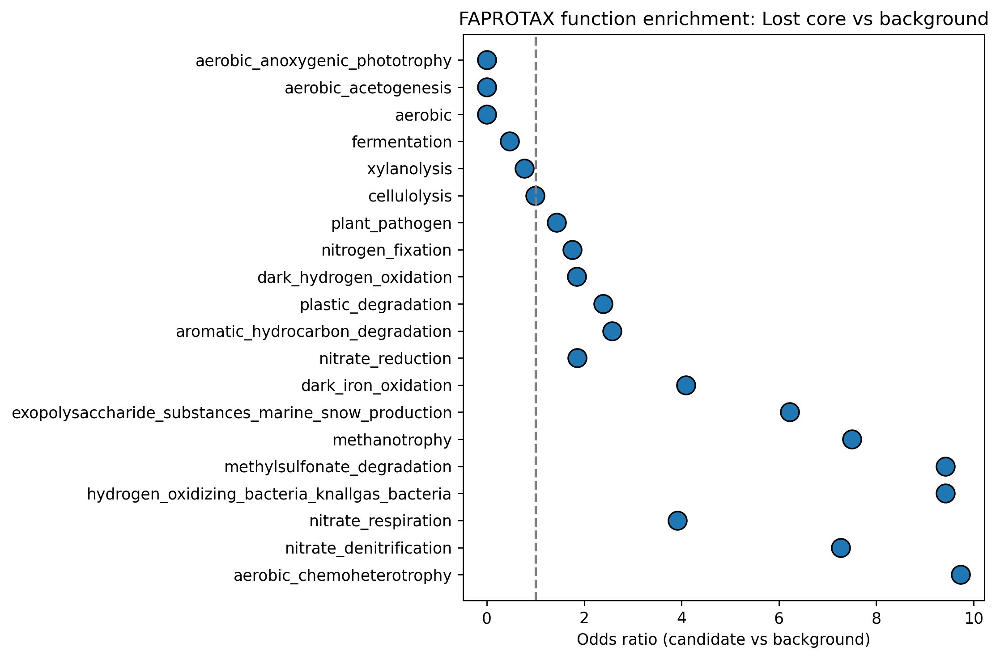

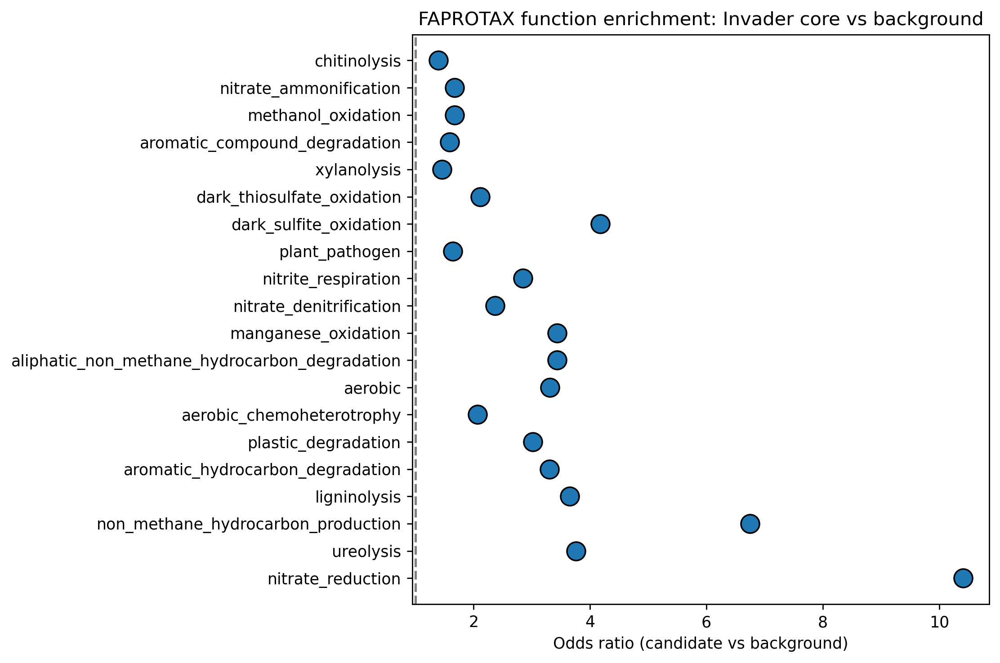

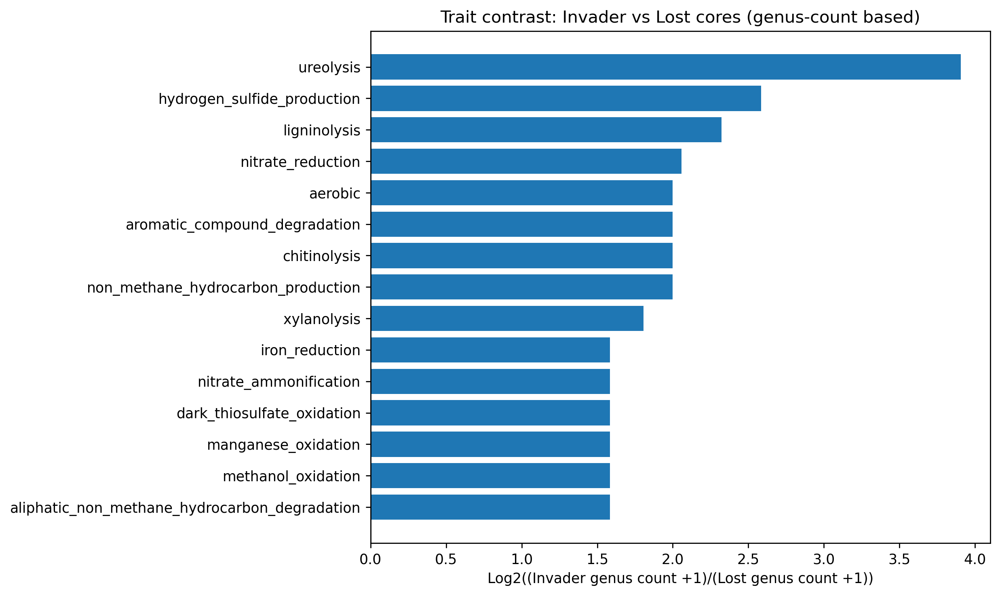


--- TOP FUNCTIONS (ABUNDANCE-WEIGHTED, ALL TAXA MAPPED) ---
                                         Function  Mean_Healthy  \
42                              nitrate_reduction       0.37282   
27                    hydrogen_sulfide_production       0.20861   
60                                      ureolysis       0.17919   
3                       aerobic_chemoheterotrophy       0.15496   
61                                    xylanolysis       0.14021   
9                                    chitinolysis       0.10365   
51                                 plant_pathogen       0.10068   
43                            nitrate_respiration       0.10351   
21                                   fermentation       0.09557   
0                                         aerobic       0.08289   
52                            plastic_degradation       0.08417   
8                                    cellulolysis       0.08586   
30                                   ligninolysis       0.07568   
5

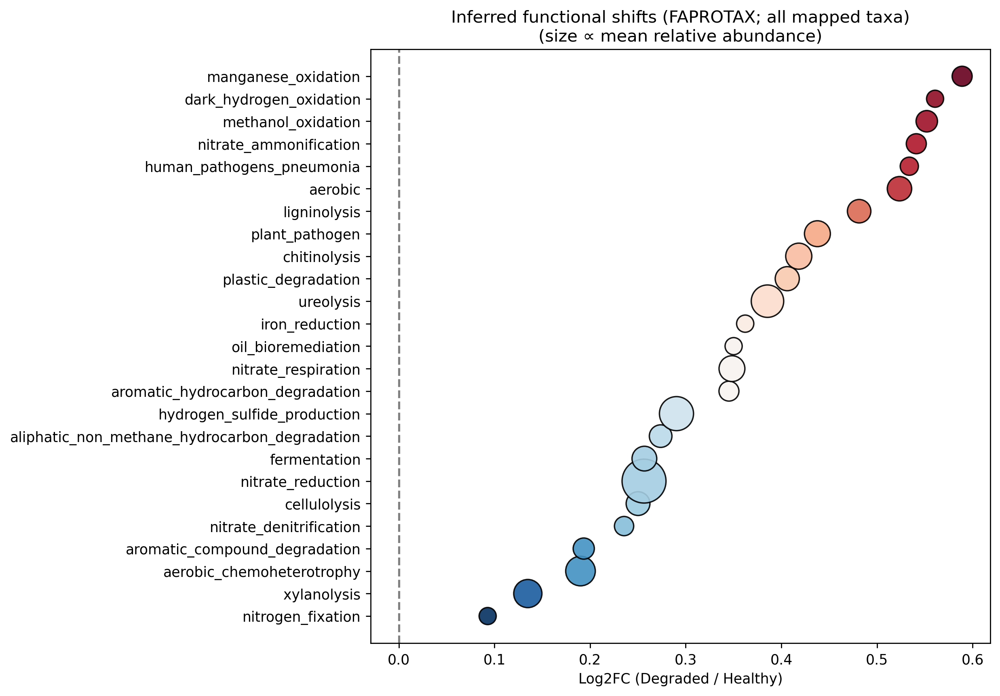

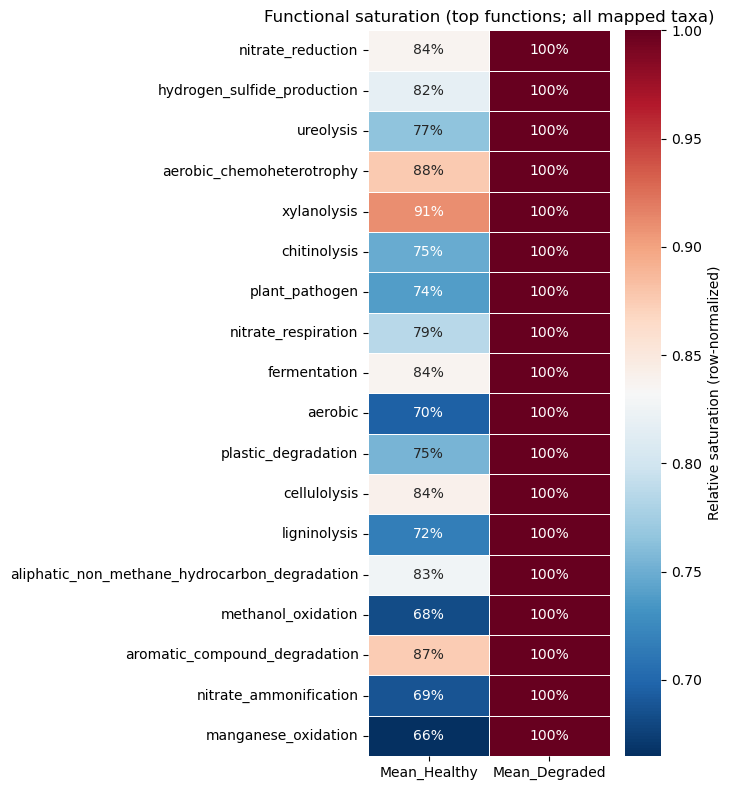


--- TOP FUNCTIONS (LOST CORE ONLY) ---
          Set                                           Function  \
0   Lost core                          aerobic_chemoheterotrophy   
11  Lost core                                  nitrate_reduction   
16  Lost core                                        xylanolysis   
8   Lost core                                      methanotrophy   
12  Lost core                                nitrate_respiration   
5   Lost core  exopolysaccharide_substances_marine_snow_produ...   
1   Lost core                   aromatic_hydrocarbon_degradation   
9   Lost core                        methylsulfonate_degradation   
15  Lost core                                plastic_degradation   
10  Lost core                            nitrate_denitrification   
6   Lost core                                       fermentation   
13  Lost core                                  nitrogen_fixation   
3   Lost core                            dark_hydrogen_oxidation   
4   Lost

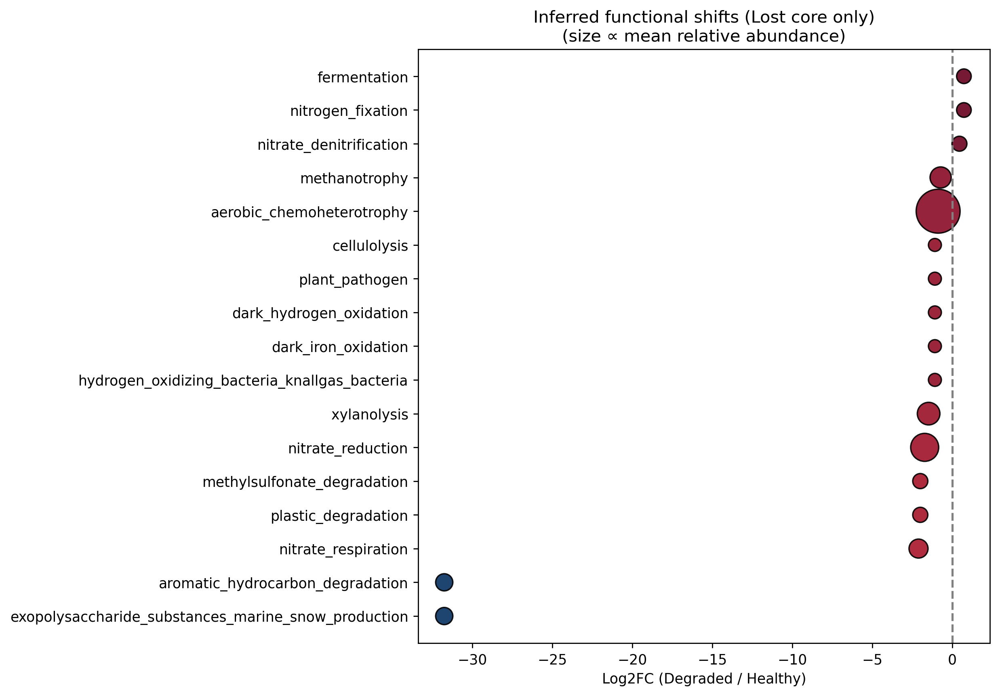

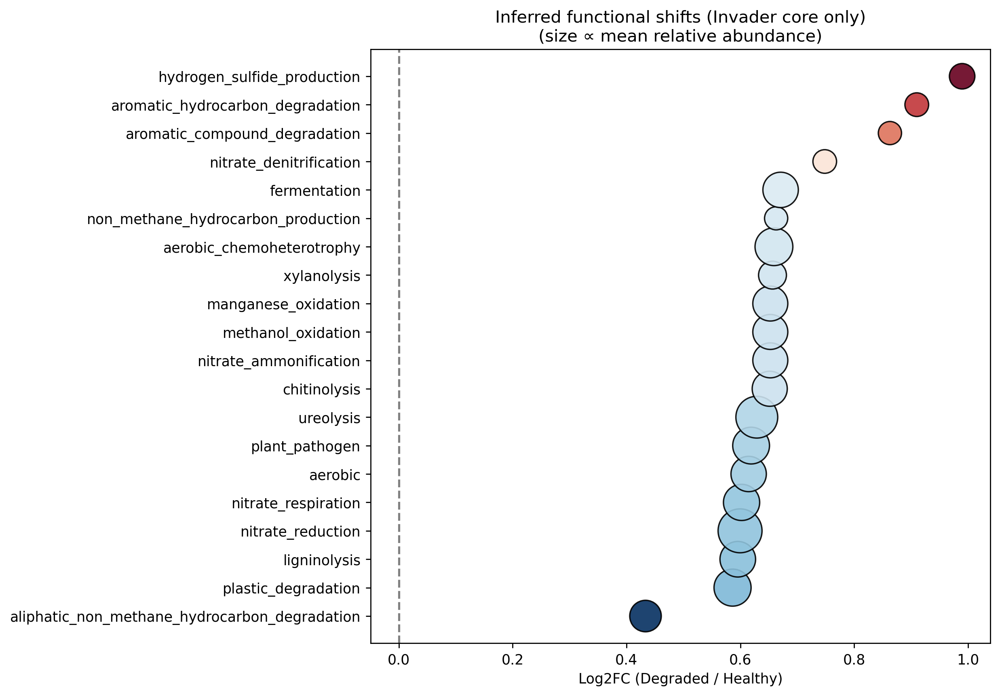

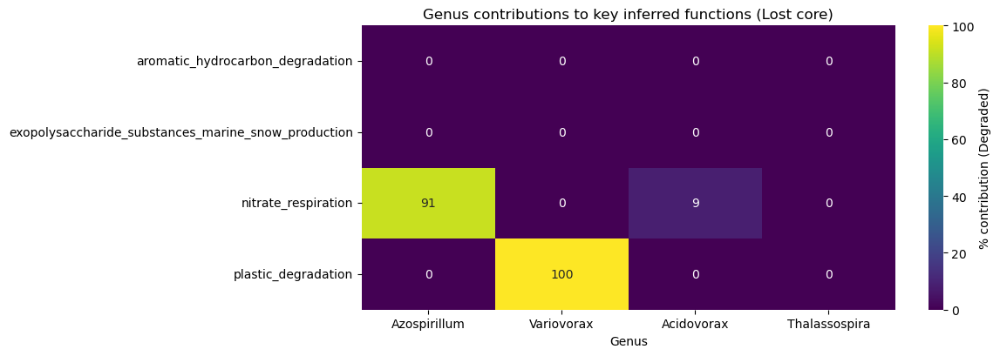

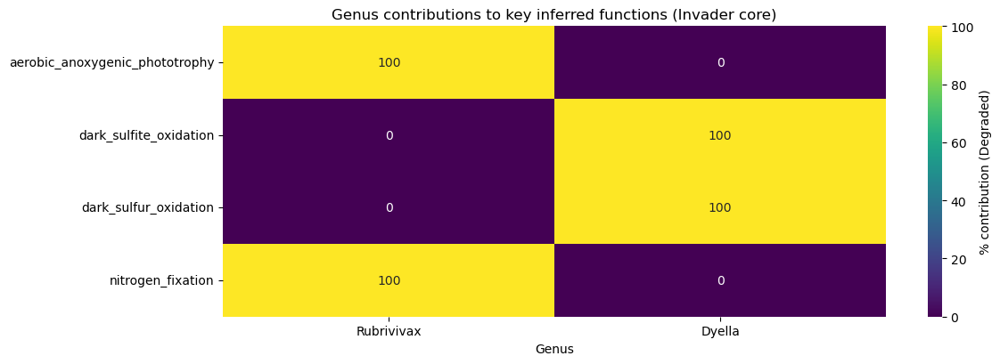


DONE.


In [17]:
# ============================================================
# FAPROTAX MAPPING PIPELINE FOR MDSS CORE GENERA (FULL SCRIPT)
# Updated: robust FAPROTAX parsing (avoids citation tokens) + pandas concat fix
# ============================================================
# Produces:
#  A) Genus->function mapping coverage stats
#  B) Enrichment of functions in Lost-core vs background (Fisher + FDR)
#  C) Enrichment of functions in Invader-core vs background (Fisher + FDR)
#  D) Lost vs Invader function-count contrast
#  E) Abundance-weighted inferred functional scores across samples:
#       - all taxa (mapped)
#       - Lost-core only
#       - Invader-core only
#  F) Plots: dotplots, heatmaps, contribution heatmaps

import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import fisher_exact, mannwhitneyu
from statsmodels.stats.multitest import multipletests

# -------------------------------
# 0) USER PATHS (EDIT IF NEEDED)
# -------------------------------
EXCEL_PATH = "/Users/kayadetunji/Downloads/soil MB/raw data_taxonomy_CFC.xlsx"
FAPROTAX_PATH = "/Users/kayadetunji/Downloads/soil MB/faprotax_edited_nov21.txt"

# -------------------------------
# 1) DEFINE SAMPLES (EDIT IF NEEDED)
# -------------------------------
# Based on your methods description: 12 total (8 rhizosphere + 4 bulk)
healthy_rhizo = ["GZ1", "GZ2", "GZ3", "GZ4"]
degraded_rhizo = ["AG1", "AG2", "AG3", "AG4"]
healthy_bulk = ["GZC1", "GZC2"]
degraded_bulk = ["AGC1", "AGC2"]

# Choose which set you want to analyze for functional shifts:
# Option A: all samples
# Option B: rhizosphere only
ANALYZE_RHIZOSPHERE_ONLY = False

# -------------------------------
# 2) CANDIDATE/CORE GENERA (EDIT IF NEEDED)
# -------------------------------
core_lost = [
    "Acidovorax", "Akkermansia", "Chthoniobacter", "Variovorax", "Gemmatimonas", "Azospirillum", "Rubrobacter",
    "unclassified (derived from Rhodospirillaceae)", "Thalassospira", "Rhodovibrio", "Prosthecobacter",
    "unclassified (derived from Comamonadaceae)"
]

core_invader = [
    "unclassified (derived from Burkholderiales)", "Kinetoplastibacterium", "Pedobacter", "Rothia",
    "Saccharothrix", "Xanthomonas", "Intrasporangium", "Thermomonospora", "Actinokineospora",
    "Nesterenkonia", "Geobacillus", "unclassified (derived from Sphingobacteriaceae)",
    "Rubrivivax", "Lechevalieria", "Kocuria", "Sphingobacterium", "Tetrasphaera",
    "unclassified (derived from Betaproteobacteria)", "Ktedonobacter", "Lentzea", "Oceanobacillus",
    "Actinocorallia", "unclassified (derived from Actinobacteria (class))", "Bacillus",
    "unclassified (derived from Thermomonosporaceae)", "Micrococcus", "Stenotrophomonas",
    "Actinosynnema", "Actinomadura", "Arthrobacter", "Candidatus Solibacter", "Dyella",
    "Janibacter", "Terrabacter", "Actinoallomurus"
]

# ---------------------------------------------------
# 3) PARSE FAPROTAX DB (ROBUST: ignores citation tokens)
# ---------------------------------------------------
def is_valid_function_token(tok: str) -> bool:
    """
    Valid FAPROTAX function tokens are typically lowercase with underscores.
    This rejects author names, URLs, DOI fragments, etc.
    """
    if not isinstance(tok, str):
        return False
    tok = tok.strip()
    if not tok:
        return False
    if "http" in tok.lower():
        return False
    # STRICT: only lowercase letters, digits, underscores
    return bool(re.match(r"^[a-z0-9_]+$", tok))

def extract_genus_from_taxon_field(taxon_field: str):
    """
    Extract tokens between *...* and pick the last token that looks like a genus name.
    """
    if not isinstance(taxon_field, str):
        return None

    stars = re.findall(r"\*(.*?)\*", taxon_field)
    stars = [s.strip() for s in stars if s.strip()]
    if not stars:
        return None

    for s in reversed(stars):
        if re.match(r"^[A-Za-z][A-Za-z0-9_-]*$", s):
            if s.lower() in {"bacteria", "archaea", "eukaryota"}:
                continue
            return s
    return None

def parse_faprotax_genus_function(db_path: str) -> pd.DataFrame:
    """
    Reads FAPROTAX edited DB and returns DataFrame with columns:
      Function, Genus

    Only accepts lines where the first #token is a valid function name (e.g., nitrogen_fixation).
    """
    rows = []
    with open(db_path, "r", encoding="utf-8", errors="ignore") as f:
        for ln in f:
            ln = ln.strip()
            if not ln or ln.startswith("#"):
                continue
            if "#" not in ln:
                continue

            parts = ln.split("#")
            if len(parts) < 2:
                continue

            taxon_chunk = parts[0].strip()
            cand = parts[1].strip().split()[0] if parts[1].strip() else ""

            if not is_valid_function_token(cand):
                continue

            genus = extract_genus_from_taxon_field(taxon_chunk)
            if genus is None:
                continue

            rows.append({"Function": cand, "Genus": genus})

    return pd.DataFrame(rows).drop_duplicates()

fap_map = parse_faprotax_genus_function(FAPROTAX_PATH)

print("\n--- FAPROTAX PARSE SUMMARY (CLEAN) ---")
print("Mappings (rows):", len(fap_map))
print("Unique functions:", fap_map["Function"].nunique())
print("Unique genera mapped:", fap_map["Genus"].nunique())
print(fap_map.head())

# ---------------------------------------------------
# 4) LOAD TAXONOMY DATASET + FILTER RARE TAXA
# ---------------------------------------------------
tax_df = pd.read_excel(EXCEL_PATH, sheet_name="taxonomy")

# Build sample lists that actually exist in your file
all_samples = healthy_rhizo + degraded_rhizo + healthy_bulk + degraded_bulk
all_samples = [c for c in all_samples if c in tax_df.columns]

healthy_cols = [c for c in (healthy_rhizo + healthy_bulk) if c in all_samples]
degraded_cols = [c for c in (degraded_rhizo + degraded_bulk) if c in all_samples]

if ANALYZE_RHIZOSPHERE_ONLY:
    use_samples = [c for c in (healthy_rhizo + degraded_rhizo) if c in all_samples]
    healthy_use = [c for c in healthy_rhizo if c in use_samples]
    degraded_use = [c for c in degraded_rhizo if c in use_samples]
else:
    use_samples = all_samples
    healthy_use = healthy_cols
    degraded_use = degraded_cols

print("\n--- SAMPLE SET ---")
print("Using samples:", use_samples)
print("Healthy samples:", healthy_use)
print("Degraded samples:", degraded_use)

if len(use_samples) == 0:
    raise ValueError("No sample columns found in the taxonomy sheet. Check your column names.")

# Filter rare taxa: present (>0) in >=3 of the samples (in use_samples)
counts = tax_df[use_samples]
mask = (counts > 0).sum(axis=1) >= 3
df_clean = tax_df.loc[mask].reset_index(drop=True)

# Must have genus column named 'genus'
df_clean["genus"] = df_clean["genus"].astype(str)

print("\nTaxa retained after prevalence filter:", df_clean.shape[0])

# Background genera universe (filtered)
background_genera = set(df_clean["genus"].dropna().astype(str))

# ---------------------------------------------------
# 5) COVERAGE: how many of your genera map to FAPROTAX?
# ---------------------------------------------------
mapped_genera = set(fap_map["Genus"].astype(str))
bg_mapped = background_genera & mapped_genera

lost_set = set(core_lost)
inv_set = set(core_invader)

lost_mapped = lost_set & mapped_genera
inv_mapped = inv_set & mapped_genera

print("\n--- MAPPING COVERAGE ---")
print(f"Background genera: {len(background_genera)}; mapped: {len(bg_mapped)} ({len(bg_mapped)/max(len(background_genera),1):.1%})")
print(f"Lost-core genera: {len(lost_set)}; mapped: {len(lost_mapped)} ({len(lost_mapped)/max(len(lost_set),1):.1%})")
print(f"Invader-core genera: {len(inv_set)}; mapped: {len(inv_mapped)} ({len(inv_mapped)/max(len(inv_set),1):.1%})")

# ---------------------------------------------------
# 6) ENRICHMENT TESTS: candidate vs background (Fisher + FDR)
# ---------------------------------------------------
def function_enrichment(candidate_genera, background_genera, fap_map, min_support=3):
    """
    Fisher exact enrichment for each function:
      in candidate vs in background (mapped universe).
    candidate_genera: set of genera
    background_genera: set of genera (universe)
    fap_map: DataFrame with Function, Genus
    """
    g2f = fap_map.groupby("Genus")["Function"].apply(set).to_dict()
    candidate = set([g for g in candidate_genera if g in g2f])
    universe = set([g for g in background_genera if g in g2f])

    funcs = sorted(set(fap_map.loc[fap_map["Genus"].isin(universe), "Function"]))
    rows = []
    noncand = universe - candidate

    for func in funcs:
        a = sum(func in g2f[g] for g in candidate)      # cand with func
        b = len(candidate) - a                          # cand without func
        c = sum(func in g2f[g] for g in noncand)        # noncand with func
        d = len(noncand) - c                            # noncand without func

        if (a + c) < min_support:
            continue

        odds, p = fisher_exact([[a, b], [c, d]], alternative="greater")
        rows.append({
            "Function": func,
            "Cand_with_func": a,
            "Cand_total_mapped": len(candidate),
            "Bg_with_func": a + c,
            "Bg_total_mapped": len(universe),
            "OddsRatio": odds,
            "P": p
        })

    out = pd.DataFrame(rows)
    if out.empty:
        return out

    out["FDR"] = multipletests(out["P"].values, method="fdr_bh")[1]
    out = out.sort_values(["FDR", "P", "OddsRatio"], ascending=[True, True, False]).reset_index(drop=True)
    return out

enrich_lost = function_enrichment(lost_set, background_genera, fap_map, min_support=3)
enrich_inv = function_enrichment(inv_set, background_genera, fap_map, min_support=3)

print("\n--- TOP ENRICHED FUNCTIONS (LOST CORE) ---")
print(enrich_lost.head(20).round(4))

print("\n--- TOP ENRICHED FUNCTIONS (INVADER CORE) ---")
print(enrich_inv.head(20).round(4))

def plot_enrichment(df, title, topN=20):
    if df.empty:
        print("No enrichment results to plot:", title)
        return
    d = df.head(topN).copy()
    plt.figure(figsize=(9, 6),dpi=250)
    plt.scatter(d["OddsRatio"], np.arange(len(d)), s=140, edgecolor="black")
    plt.yticks(np.arange(len(d)), d["Function"])
    plt.axvline(1.0, linestyle="--", color="gray")
    plt.xlabel("Odds ratio (candidate vs background)")
    plt.title(title)
    plt.tight_layout()
    plt.show()

plot_enrichment(enrich_lost, "FAPROTAX function enrichment: Lost core vs background", topN=20)
plot_enrichment(enrich_inv, "FAPROTAX function enrichment: Invader core vs background", topN=20)

# ---------------------------------------------------
# 7) LOST vs INVADER FUNCTION COUNTS (trait profile contrast)
# ---------------------------------------------------
mapped_core = pd.concat([
    pd.DataFrame({"Genus": list(lost_set), "Group": "Lost"}),
    pd.DataFrame({"Genus": list(inv_set), "Group": "Invader"})
], ignore_index=True)

mapped_core = mapped_core.merge(fap_map, on="Genus", how="inner")

func_counts = mapped_core.groupby(["Group", "Function"]).size().reset_index(name="Genus_Count")
pivot_counts = func_counts.pivot_table(index="Function", columns="Group", values="Genus_Count", fill_value=0)

pivot_counts["Log2_ratio_Invader_vs_Lost"] = np.log2(
    (pivot_counts.get("Invader", 0) + 1) / (pivot_counts.get("Lost", 0) + 1)
)
pivot_counts = pivot_counts.sort_values("Log2_ratio_Invader_vs_Lost")

top_contrast = pivot_counts.tail(15).copy()
plt.figure(figsize=(10, 6), dpi=250)
plt.barh(top_contrast.index, top_contrast["Log2_ratio_Invader_vs_Lost"])
plt.axvline(0, color="black", lw=0.8)
plt.title("Trait contrast: Invader vs Lost cores (genus-count based)")
plt.xlabel("Log2((Invader genus count +1)/(Lost genus count +1))")
plt.tight_layout()
plt.show()

# ---------------------------------------------------
# 8) ABUNDANCE-WEIGHTED FUNCTION SCORES PER SAMPLE
# ---------------------------------------------------
df_counts = df_clean[["genus"] + use_samples].copy()
df_counts_long = df_counts.melt(id_vars="genus", var_name="Sample", value_name="Abundance")
df_counts_long["Condition"] = np.where(df_counts_long["Sample"].isin(healthy_use), "Healthy", "Degraded")

# Relative abundance per sample
lib = df_counts_long.groupby("Sample")["Abundance"].sum()
df_counts_long["RelAbundance"] = df_counts_long.apply(
    lambda r: r["Abundance"] / (lib[r["Sample"]] + 1e-12), axis=1
)

# Map genus -> function (many-to-many)
df_mapped_all = df_counts_long.merge(fap_map, left_on="genus", right_on="Genus", how="inner")

# Function abundance per sample
func_sample_all = df_mapped_all.groupby(["Sample", "Condition", "Function"])["RelAbundance"].sum().reset_index()
func_mat_all = func_sample_all.pivot_table(
    index=["Sample", "Condition"], columns="Function", values="RelAbundance", fill_value=0
)

def effect_size_cohens_d(x, y):
    x = np.asarray(x); y = np.asarray(y)
    if len(x) < 2 or len(y) < 2:
        return np.nan
    vx = x.var(ddof=1); vy = y.var(ddof=1)
    pooled = ((len(x)-1)*vx + (len(y)-1)*vy) / (len(x)+len(y)-2 + 1e-12)
    return (x.mean() - y.mean()) / np.sqrt(pooled + 1e-12)

rows = []
for func in func_mat_all.columns:
    h = func_mat_all.xs("Healthy", level="Condition")[func].values
    d = func_mat_all.xs("Degraded", level="Condition")[func].values

    log2fc = np.log2((d.mean() + 1e-12) / (h.mean() + 1e-12))
    cohen = effect_size_cohens_d(d, h)  # degraded - healthy
    try:
        p = mannwhitneyu(h, d, alternative="two-sided").pvalue
    except Exception:
        p = np.nan

    rows.append({
        "Function": func,
        "Mean_Healthy": h.mean(),
        "Mean_Degraded": d.mean(),
        "Log2FC_Degraded_vs_Healthy": log2fc,
        "Cohens_d_Degraded_vs_Healthy": cohen,
        "MWU_p": p,
        "TotalMean": h.mean() + d.mean()
    })

func_stats_all = pd.DataFrame(rows).sort_values("TotalMean", ascending=False)
func_stats_all["FDR"] = multipletests(func_stats_all["MWU_p"].fillna(1.0), method="fdr_bh")[1]

print("\n--- TOP FUNCTIONS (ABUNDANCE-WEIGHTED, ALL TAXA MAPPED) ---")
print(func_stats_all.head(25).round(5))

def plot_function_dotplot(func_stats, title, topN=25):
    d = func_stats.head(topN).copy()
    d = d.sort_values("Log2FC_Degraded_vs_Healthy")
    sizes = (d["TotalMean"] / d["TotalMean"].max()) * 900 + 80

    plt.figure(figsize=(10, 7), dpi=250)
    plt.scatter(
        d["Log2FC_Degraded_vs_Healthy"], d["Function"],
        s=sizes, c=d["Log2FC_Degraded_vs_Healthy"], cmap="RdBu_r",
        edgecolor="black", alpha=0.9
    )
    plt.axvline(0, linestyle="--", color="gray")
    plt.xlabel("Log2FC (Degraded / Healthy)")
    plt.title(title + "\n(size ∝ mean relative abundance)")
    plt.tight_layout()
    plt.show()

plot_function_dotplot(func_stats_all, "Inferred functional shifts (FAPROTAX; all mapped taxa)", topN=25)

def plot_saturation_heatmap(func_stats, title, topN=20):
    d = func_stats.head(topN).copy()
    heat = d.set_index("Function")[["Mean_Healthy", "Mean_Degraded"]]
    heat_norm = heat.div(heat.max(axis=1), axis=0).replace([np.inf, -np.inf], 0).fillna(0)

    plt.figure(figsize=(7, 8))
    sns.heatmap(
        heat_norm, cmap="RdBu_r", linewidths=0.6, linecolor="white",
        annot=True, fmt=".0%", cbar_kws={"label": "Relative saturation (row-normalized)"}
    )
    plt.title(title)
    plt.ylabel("")
    plt.tight_layout()
    plt.show()

plot_saturation_heatmap(func_stats_all, "Functional saturation (top functions; all mapped taxa)", topN=18)

# ---------------------------------------------------
# 9) CORE-RESTRICTED FUNCTION SCORES (LOST vs INVADER CORES)
# ---------------------------------------------------
def compute_func_stats_for_genus_set(genus_set, label):
    sub = df_counts_long[df_counts_long["genus"].isin(genus_set)].copy()
    sub = sub.merge(fap_map, left_on="genus", right_on="Genus", how="inner")
    fs = sub.groupby(["Sample", "Condition", "Function"])["RelAbundance"].sum().reset_index()
    mat = fs.pivot_table(index=["Sample", "Condition"], columns="Function", values="RelAbundance", fill_value=0)

    rows = []
    for func in mat.columns:
        h = mat.xs("Healthy", level="Condition")[func].values
        d = mat.xs("Degraded", level="Condition")[func].values
        log2fc = np.log2((d.mean() + 1e-12) / (h.mean() + 1e-12))
        cohen = effect_size_cohens_d(d, h)
        try:
            p = mannwhitneyu(h, d, alternative="two-sided").pvalue
        except Exception:
            p = np.nan

        rows.append({
            "Set": label,
            "Function": func,
            "Mean_Healthy": h.mean(),
            "Mean_Degraded": d.mean(),
            "Log2FC_Degraded_vs_Healthy": log2fc,
            "Cohens_d_Degraded_vs_Healthy": cohen,
            "MWU_p": p,
            "TotalMean": h.mean() + d.mean()
        })

    out = pd.DataFrame(rows).sort_values("TotalMean", ascending=False)
    out["FDR"] = multipletests(out["MWU_p"].fillna(1.0), method="fdr_bh")[1]
    return out

func_stats_lost = compute_func_stats_for_genus_set(lost_set, "Lost core")
func_stats_inv = compute_func_stats_for_genus_set(inv_set, "Invader core")

print("\n--- TOP FUNCTIONS (LOST CORE ONLY) ---")
print(func_stats_lost.head(20).round(5))

print("\n--- TOP FUNCTIONS (INVADER CORE ONLY) ---")
print(func_stats_inv.head(20).round(5))

plot_function_dotplot(func_stats_lost, "Inferred functional shifts (Lost core only)", topN=20)
plot_function_dotplot(func_stats_inv, "Inferred functional shifts (Invader core only)", topN=20)

# ---------------------------------------------------
# 10) CONTRIBUTION HEATMAP: WHICH GENERA DRIVE TOP FUNCTIONS?
# ---------------------------------------------------
def contribution_heatmap(genus_set, func_stats, title, topN_funcs=4, topN_genera=10, use_condition="Degraded"):
    d = func_stats.head(50).copy()
    d["abs_fc"] = d["Log2FC_Degraded_vs_Healthy"].abs()
    funcs = d.sort_values("abs_fc", ascending=False).head(topN_funcs)["Function"].tolist()

    sub = df_counts_long[df_counts_long["genus"].isin(genus_set)].copy()
    sub = sub.merge(fap_map, left_on="genus", right_on="Genus", how="inner")
    sub_cond = sub[sub["Condition"] == use_condition].copy()
    sub_cond = sub_cond[sub_cond["Function"].isin(funcs)]

    pivot = sub_cond.pivot_table(index="Function", columns="genus", values="RelAbundance", aggfunc="sum").fillna(0)
    top_cols = pivot.sum(axis=0).sort_values(ascending=False).head(topN_genera).index
    pivot = pivot[top_cols]

    pivot_pct = pivot.div(pivot.sum(axis=1).replace(0, np.nan), axis=0) * 100
    pivot_pct = pivot_pct.fillna(0)

    plt.figure(figsize=(12, 4.2))
    sns.heatmap(pivot_pct, cmap="viridis", annot=True, fmt=".0f",
                cbar_kws={"label": f"% contribution ({use_condition})"})
    plt.title(title)
    plt.ylabel("")
    plt.xlabel("Genus")
    plt.tight_layout()
    plt.show()

contribution_heatmap(lost_set, func_stats_lost, "Genus contributions to key inferred functions (Lost core)", topN_funcs=4)
contribution_heatmap(inv_set, func_stats_inv, "Genus contributions to key inferred functions (Invader core)", topN_funcs=4)

print("\nDONE.")

Taxa retained after prevalence filter: 352

--- FAPROTAX PARSE SUMMARY ---
Mappings (rows): 4112
Unique functions: 89


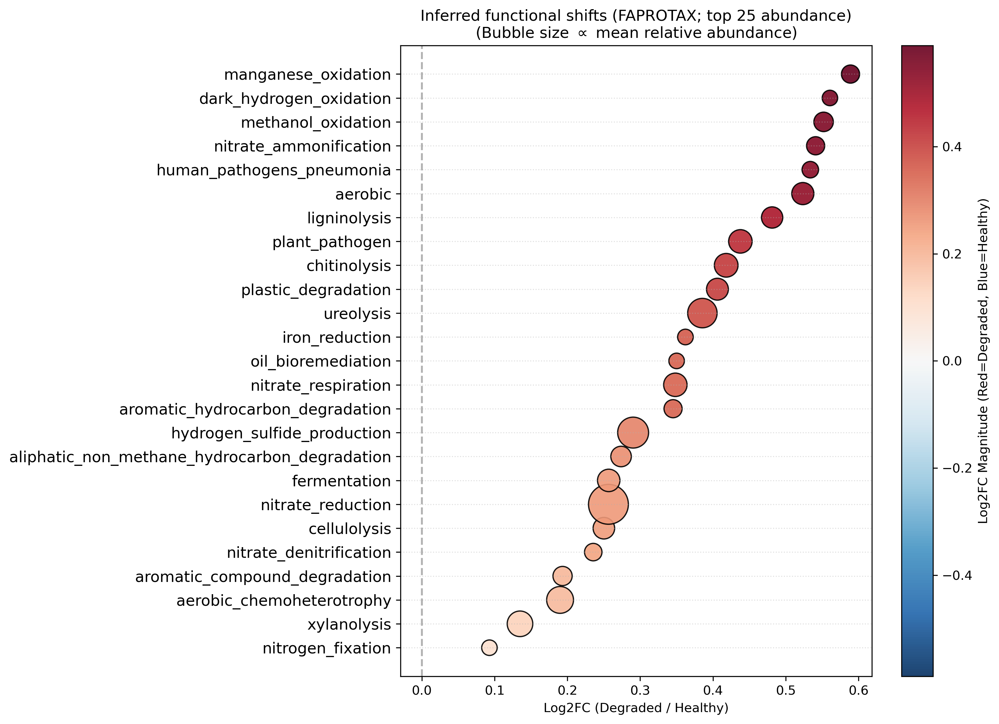

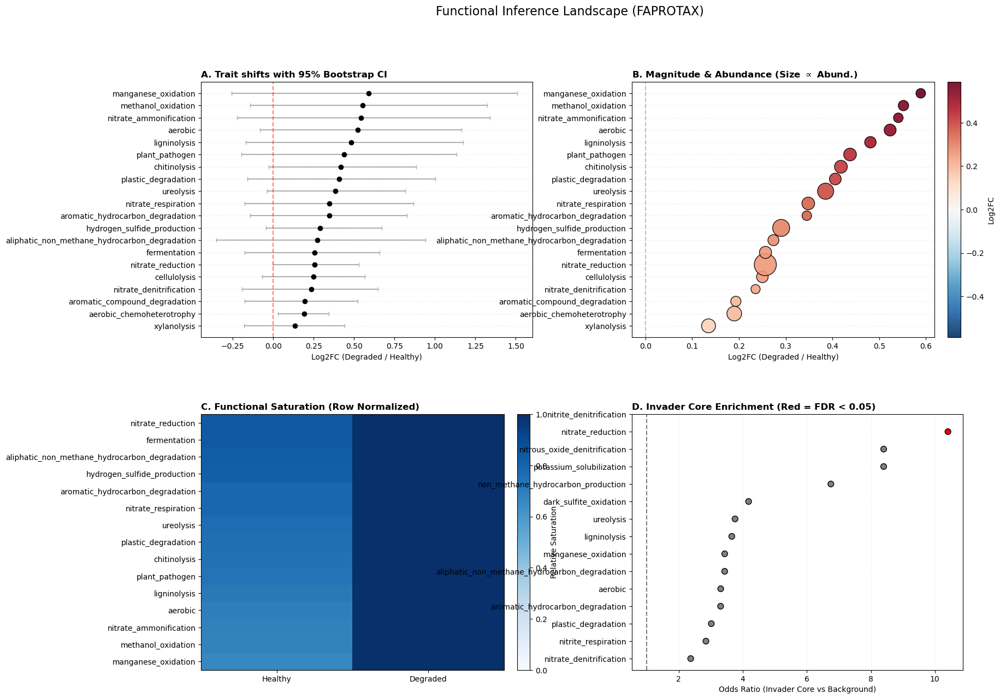

In [18]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns # Optional, but good for some styling if installed
from matplotlib.colors import TwoSlopeNorm 
from matplotlib.gridspec import GridSpec
from scipy.stats import mannwhitneyu, fisher_exact
from statsmodels.stats.multitest import multipletests

# =========================
# 0) INPUTS
# =========================
EXCEL_PATH = "/Users/kayadetunji/Downloads/soil MB/raw data_taxonomy_CFC.xlsx"
FAPROTAX_PATH = "/Users/kayadetunji/Downloads/soil MB/faprotax_edited_nov21.txt"

# sample columns (12 total)
rhizo_healthy = ["GZ1","GZ2","GZ3","GZ4"]
rhizo_degraded = ["AG1","AG2","AG3","AG4"]
bulk_healthy  = ["GZC1","GZC2"]
bulk_degraded = ["AGC1","AGC2"]

ALL_SAMPLES = rhizo_healthy + rhizo_degraded + bulk_healthy + bulk_degraded
HEALTHY = rhizo_healthy + bulk_healthy
DEGRADED = rhizo_degraded + bulk_degraded

# Option: if you want rhizosphere-only main analysis
ANALYZE_RHIZOSPHERE_ONLY = False
if ANALYZE_RHIZOSPHERE_ONLY:
    HEALTHY = rhizo_healthy
    DEGRADED = rhizo_degraded
    ALL_SAMPLES = HEALTHY + DEGRADED

# Paste your MDSS consensus core genera here (from your MDSS output)
LOST_CORE = set([
    'Acidovorax', 'Akkermansia', 'Chthoniobacter', 'Variovorax', 'Gemmatimonas', 'Azospirillum', 'Rubrobacter', 
    'unclassified (derived from Rhodospirillaceae)', 'Thalassospira', 'Rhodovibrio', 'Prosthecobacter', 
    'unclassified (derived from Comamonadaceae)'
])

INVADER_CORE = set([
    'unclassified (derived from Burkholderiales)','Kinetoplastibacterium','Pedobacter','Rothia',
    'Saccharothrix','Xanthomonas','Intrasporangium','Thermomonospora','Actinokineospora',
    'Nesterenkonia','Geobacillus','unclassified (derived from Sphingobacteriaceae)',
    'Rubrivivax','Lechevalieria','Kocuria','Sphingobacterium','Tetrasphaera',
    'unclassified (derived from Betaproteobacteria)','Ktedonobacter','Lentzea','Oceanobacillus',
    'Actinocorallia','unclassified (derived from Actinobacteria (class))','Bacillus',
    'unclassified (derived from Thermomonosporaceae)','Micrococcus','Stenotrophomonas',
    'Actinosynnema','Actinomadura','Arthrobacter','Candidatus Solibacter','Dyella',
    'Janibacter','Terrabacter','Actinoallomurus'
])

# =========================
# 1) LOAD TAXA TABLE
# =========================
tax_df = pd.read_excel(EXCEL_PATH, sheet_name="taxonomy")

# basic checks
missing = [c for c in ALL_SAMPLES if c not in tax_df.columns]
if missing:
    raise ValueError(f"Missing sample columns in taxonomy sheet: {missing}")

# prevalence filter (>=3 samples nonzero) to reduce noise
counts = tax_df[ALL_SAMPLES]
mask = (counts > 0).sum(axis=1) >= 3
df = tax_df.loc[mask].copy().reset_index(drop=True)

# keep genus + sample matrix
df["genus"] = df["genus"].astype(str)

print(f"Taxa retained after prevalence filter: {len(df)}")

# Relative abundance per sample (safer for abundance-weighted trait inference)
rel = df[ALL_SAMPLES].div(df[ALL_SAMPLES].sum(axis=0), axis=1)
rel.insert(0, "genus", df["genus"].values)

# =========================
# 2) PARSE FAPROTAX MAPPING (ROBUST)
# =========================
def is_valid_function_token(tok: str) -> bool:
    if not isinstance(tok, str): return False
    tok = tok.strip()
    if not tok: return False
    if "http" in tok.lower(): return False
    return bool(re.match(r"^[a-z0-9_]+$", tok))

def extract_genus_from_taxon_field(taxon_field: str):
    if not isinstance(taxon_field, str): return None
    stars = re.findall(r"\*(.*?)\*", taxon_field)
    if not stars: return None
    stars = [s.strip() for s in stars if s.strip()]
    for s in reversed(stars):
        if re.match(r"^[A-Za-z][A-Za-z0-9_-]*$", s):
            if s.lower() in {"bacteria","archaea","eukaryota"}: continue
            return s
    return None

def parse_faprotax(file_path: str) -> pd.DataFrame:
    rows = []
    with open(file_path, "r", encoding="utf-8", errors="ignore") as f:
        for ln in f:
            ln = ln.strip()
            if not ln or ln.startswith("#") or "#" not in ln: continue
            parts = ln.split("#")
            if len(parts) < 2: continue
            
            taxon_chunk = parts[0].strip()
            cand = parts[1].strip().split()[0] if parts[1].strip() else ""

            if not is_valid_function_token(cand): continue
            genus = extract_genus_from_taxon_field(taxon_chunk)
            if genus is None: continue

            rows.append((genus, cand))

    out = pd.DataFrame(rows, columns=["Genus","Function"]).drop_duplicates()
    return out

fap_map = parse_faprotax(FAPROTAX_PATH)
print("\n--- FAPROTAX PARSE SUMMARY ---")
print(f"Mappings (rows): {len(fap_map)}")
print(f"Unique functions: {fap_map['Function'].nunique()}")

# =========================
# 3) BUILD FUNCTION x SAMPLE MATRIX
# =========================
genus_to_funcs = fap_map.groupby("Genus")["Function"].apply(list).to_dict()
present_genera = set(rel["genus"])
mapped_present = [g for g in genus_to_funcs.keys() if g in present_genera]

long_rows = []
rel_idx = rel.set_index("genus")

for g in mapped_present:
    funcs = genus_to_funcs[g]
    gvec = rel_idx.loc[g, ALL_SAMPLES].values.astype(float)
    for func in funcs:
        long_rows.append((func, g, *gvec))

func_long = pd.DataFrame(long_rows, columns=["Function","Genus", *ALL_SAMPLES])
func_mat = func_long.groupby("Function")[ALL_SAMPLES].sum()

# =========================
# 4) STATS: FUNCTION SHIFTS (ABUNDANCE-WEIGHTED)
# =========================
def cohens_d(x, y):
    x = np.asarray(x); y = np.asarray(y)
    nx, ny = len(x), len(y)
    vx, vy = x.var(ddof=1), y.var(ddof=1)
    sp = np.sqrt(((nx-1)*vx + (ny-1)*vy) / (nx+ny-2)) if (nx+ny-2) > 0 else np.nan
    return (y.mean() - x.mean()) / sp if sp and not np.isnan(sp) and sp != 0 else np.nan

def bootstrap_log2fc_ci(x, y, n_boot=3000, seed=42, pseudocount=1e-9):
    rng = np.random.default_rng(seed)
    x = np.asarray(x); y = np.asarray(y)
    boots = []
    for _ in range(n_boot):
        xb = rng.choice(x, size=len(x), replace=True)
        yb = rng.choice(y, size=len(y), replace=True)
        fc = (yb.mean() + pseudocount) / (xb.mean() + pseudocount)
        boots.append(np.log2(fc))
    lo, hi = np.quantile(boots, [0.025, 0.975])
    return lo, hi

stats = []
for func in func_mat.index:
    x = func_mat.loc[func, HEALTHY].values.astype(float)
    y = func_mat.loc[func, DEGRADED].values.astype(float)
    mean_h = x.mean()
    mean_d = y.mean()
    log2fc = np.log2((mean_d + 1e-9) / (mean_h + 1e-9))
    d = cohens_d(x, y)
    try: p = mannwhitneyu(x, y, alternative="two-sided").pvalue
    except: p = np.nan
    lo, hi = bootstrap_log2fc_ci(x, y, n_boot=3000, seed=123)

    stats.append({
        "Function": func,
        "Mean_Healthy": mean_h,
        "Mean_Degraded": mean_d,
        "Log2FC_Degraded_vs_Healthy": log2fc,
        "Log2FC_CI_low": lo,
        "Log2FC_CI_high": hi,
        "Cohens_d_Degraded_vs_Healthy": d,
        "MWU_p": p,
        "TotalMean": (mean_h + mean_d)
    })

stats_df = pd.DataFrame(stats)
stats_df["FDR"] = multipletests(stats_df["MWU_p"].fillna(1.0).values, method="fdr_bh")[1]

# =========================
# 5) TABLE 1 & ENRICHMENT CALCS
# =========================
TOP_N = 25
table1 = stats_df.sort_values("TotalMean", ascending=False).head(TOP_N)

# Enrichment logic
background = set(df["genus"].astype(str))
mapped_bg = background.intersection(set(fap_map["Genus"]))

def enrichment_table(candidate_set):
    cand = set(candidate_set).intersection(mapped_bg)
    bg = set(mapped_bg)
    out = []
    for func in fap_map["Function"].unique():
        func_genera = set(fap_map.loc[fap_map["Function"] == func, "Genus"])
        a = len(cand.intersection(func_genera))
        b = len(cand) - a
        c = len(bg.intersection(func_genera)) - a
        d = (len(bg) - len(cand)) - c
        if min(a,b,c,d) < 0: continue
        try: OR, p = fisher_exact([[a,b],[c,d]])
        except: OR, p = np.nan, 1.0
        out.append((func, OR, p))
    
    out = pd.DataFrame(out, columns=["Function","OddsRatio","P"])
    out["FDR"] = multipletests(out["P"].values, method="fdr_bh")[1]
    out = out.dropna().sort_values("OddsRatio", ascending=False) # sort by OR
    return out

inv_enrich = enrichment_table(INVADER_CORE)

# =========================
# 6) BEAUTIFIED PLOTTING FUNCTIONS
# =========================

def plot_function_dotplot(func_stats, title, topN=25):
    """
    The 'Pro' Dot Plot: Sorted by Log2FC, Colored by Log2FC
    """
    d = func_stats.sort_values("TotalMean", ascending=False).head(topN).copy()
    d = d.sort_values("Log2FC_Degraded_vs_Healthy") # Sort for sigmoid shape

    # Dynamic sizing
    sizes = (d["TotalMean"] / d["TotalMean"].max()) * 900 + 80
    
    # Normalization for centering colormap at 0
    max_abs = max(abs(d["Log2FC_Degraded_vs_Healthy"]))
    norm = TwoSlopeNorm(vmin=-max_abs, vcenter=0, vmax=max_abs)

    plt.figure(figsize=(11, 8), dpi=300)
    sc = plt.scatter(d["Log2FC_Degraded_vs_Healthy"], d["Function"],
                     s=sizes, 
                     c=d["Log2FC_Degraded_vs_Healthy"], 
                     cmap="RdBu_r", 
                     norm=norm,
                     edgecolor="black", alpha=0.9)
    
    plt.axvline(0, linestyle="--", color="gray", alpha=0.6)
    plt.grid(axis='y', linestyle=':', alpha=0.4)
    plt.xlabel("Log2FC (Degraded / Healthy)")
    plt.yticks(ha="right", fontsize=12)
    plt.title(title + "\n(Bubble size $\propto$ mean relative abundance)")
    cbar = plt.colorbar(sc)
    cbar.set_label("Log2FC Magnitude (Red=Degraded, Blue=Healthy)")
    plt.tight_layout()
    plt.show()

# Run the individual beautiful dot plot
plot_function_dotplot(stats_df, "Inferred functional shifts (FAPROTAX; top 25 abundance)", topN=25)

# =========================
# 7) BEAUTIFIED 2x2 FIGURE PANEL
# =========================
fig = plt.figure(figsize=(18, 14))
gs = GridSpec(2, 2, figure=fig, hspace=0.3, wspace=0.3)

# --- DATA PREP FOR PANELS ---
# Filter top 20 by abundance for Plots A, B, C
top_df = stats_df.sort_values("TotalMean", ascending=False).head(20).copy()
# Sort by Log2FC for plotting logic
top_df = top_df.sort_values("Log2FC_Degraded_vs_Healthy")

# PANEL A: Forest Plot (Standardized)
axA = fig.add_subplot(gs[0, 0])
y = np.arange(len(top_df))
# Error bars
axA.errorbar(top_df["Log2FC_Degraded_vs_Healthy"], y, 
             xerr=[top_df["Log2FC_Degraded_vs_Healthy"] - top_df["Log2FC_CI_low"], 
                   top_df["Log2FC_CI_high"] - top_df["Log2FC_Degraded_vs_Healthy"]],
             fmt='none', ecolor='gray', alpha=0.6, capsize=3)
# Points
axA.scatter(top_df["Log2FC_Degraded_vs_Healthy"], y, color='black', zorder=3)
axA.axvline(0, linestyle="--", color="red", alpha=0.5)
axA.set_yticks(y)
axA.set_yticklabels(top_df["Function"])
axA.set_xlabel("Log2FC (Degraded / Healthy)")
axA.set_title("A. Trait shifts with 95% Bootstrap CI", loc='left', fontweight='bold')
axA.grid(axis='y', linestyle=':', alpha=0.3)

# PANEL B: The "Pro" Dot Plot
axB = fig.add_subplot(gs[0, 1])
sizes = (top_df["TotalMean"] / top_df["TotalMean"].max()) * 800 + 50
max_val = max(abs(top_df["Log2FC_Degraded_vs_Healthy"]))
norm = TwoSlopeNorm(vmin=-max_val, vcenter=0, vmax=max_val)

sc = axB.scatter(top_df["Log2FC_Degraded_vs_Healthy"], y, 
                 s=sizes, 
                 c=top_df["Log2FC_Degraded_vs_Healthy"], 
                 cmap="RdBu_r", norm=norm, 
                 edgecolor="black", alpha=0.9, zorder=3)
axB.axvline(0, linestyle="--", color="gray", alpha=0.5)
axB.set_yticks(y)
axB.set_yticklabels(top_df["Function"])
axB.set_xlabel("Log2FC (Degraded / Healthy)")
axB.set_title("B. Magnitude & Abundance (Size $\propto$ Abund.)", loc='left', fontweight='bold')
axB.grid(axis='y', linestyle=':', alpha=0.3)
# Colorbar for Panel B
cbar = fig.colorbar(sc, ax=axB, fraction=0.046, pad=0.04)
cbar.set_label("Log2FC")

# PANEL C: Saturation Heatmap (Cleaner)
axC = fig.add_subplot(gs[1, 0])
# Take top 15 for heatmap to keep it distinct
hm_data = top_df.tail(15).copy() # tail because top_df is sorted by log2FC low->high
hm_vals = hm_data[["Mean_Healthy", "Mean_Degraded"]]
# Row normalize
hm_norm = hm_vals.div(hm_vals.max(axis=1), axis=0)

im = axC.imshow(hm_norm.values, aspect="auto", cmap="Blues", vmin=0, vmax=1)
axC.set_xticks([0, 1])
axC.set_xticklabels(["Healthy", "Degraded"])
axC.set_yticks(range(len(hm_data)))
axC.set_yticklabels(hm_data["Function"])
axC.set_title("C. Functional Saturation (Row Normalized)", loc='left', fontweight='bold')
fig.colorbar(im, ax=axC, fraction=0.046, pad=0.04, label="Relative Saturation")

# PANEL D: Enrichment (Fisher OR)
axD = fig.add_subplot(gs[1, 1])
# Filter to significant or top OR
dD = inv_enrich.head(15).copy().sort_values("OddsRatio")
yD = np.arange(len(dD))

# Color points by significance (FDR < 0.05)
colors = ['red' if p < 0.05 else 'gray' for p in dD["FDR"]]

axD.scatter(dD["OddsRatio"], yD, color=colors, s=60, edgecolor='black', zorder=3)
axD.axvline(1, linestyle="--", color="black", alpha=0.5)
axD.set_yticks(yD)
axD.set_yticklabels(dD["Function"])
axD.set_xlabel("Odds Ratio (Invader Core vs Background)")
axD.set_title("D. Invader Core Enrichment (Red = FDR < 0.05)", loc='left', fontweight='bold')
axD.grid(axis='x', linestyle=':', alpha=0.3)

plt.suptitle("Functional Inference Landscape (FAPROTAX)", fontsize=16, y=0.98)
plt.show()

Taxa retained after prevalence filter: 298

--- FAPROTAX PARSE SUMMARY ---
Mappings (rows): 4112
Unique functions: 89


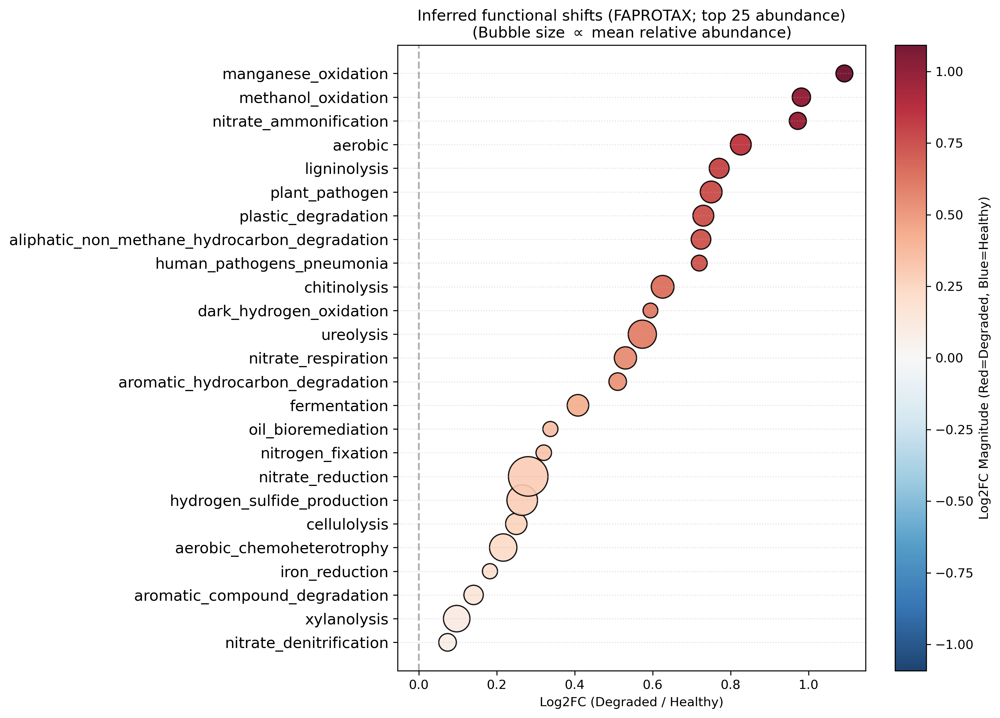

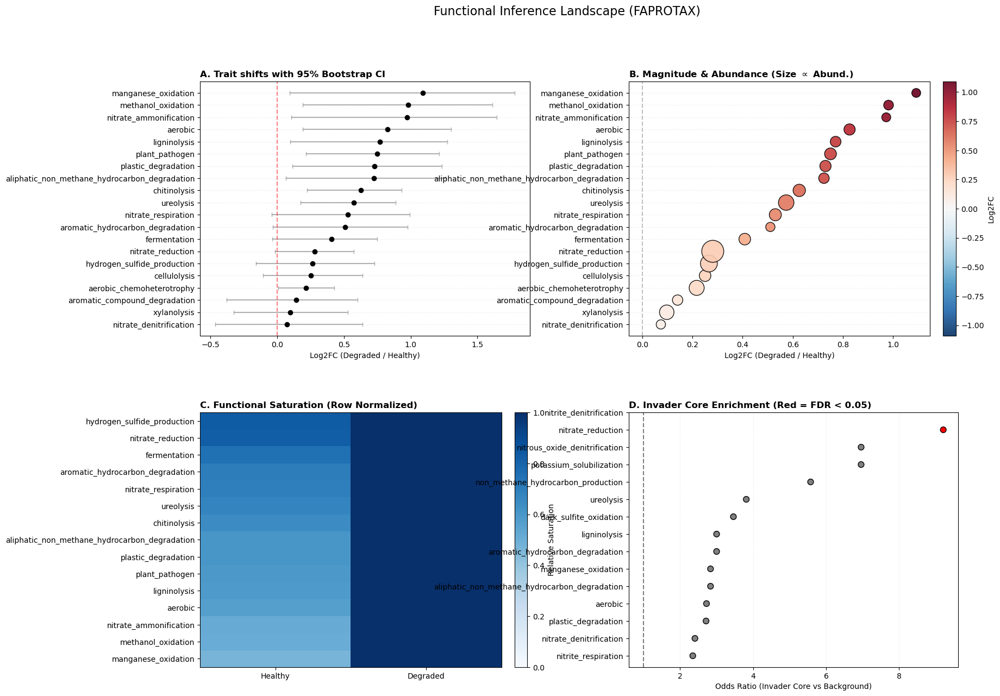

In [19]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns # Optional, but good for some styling if installed
from matplotlib.colors import TwoSlopeNorm 
from matplotlib.gridspec import GridSpec
from scipy.stats import mannwhitneyu, fisher_exact
from statsmodels.stats.multitest import multipletests

# =========================
# 0) INPUTS
# =========================
EXCEL_PATH = "/Users/kayadetunji/Downloads/soil MB/raw data_taxonomy_CFC.xlsx"
FAPROTAX_PATH = "/Users/kayadetunji/Downloads/soil MB/faprotax_edited_nov21.txt"

# sample columns (12 total)
rhizo_healthy = ["GZ1","GZ2","GZ3","GZ4"]
rhizo_degraded = ["AG1","AG2","AG3","AG4"]
bulk_healthy  = ["GZC1","GZC2"]
bulk_degraded = ["AGC1","AGC2"]

ALL_SAMPLES = rhizo_healthy + rhizo_degraded + bulk_healthy + bulk_degraded
HEALTHY = rhizo_healthy + bulk_healthy
DEGRADED = rhizo_degraded + bulk_degraded

# Option: if you want rhizosphere-only main analysis
ANALYZE_RHIZOSPHERE_ONLY = True
if ANALYZE_RHIZOSPHERE_ONLY:
    HEALTHY = rhizo_healthy
    DEGRADED = rhizo_degraded
    ALL_SAMPLES = HEALTHY + DEGRADED

# Paste your MDSS consensus core genera here (from your MDSS output)
LOST_CORE = set([
    'Acidovorax', 'Akkermansia', 'Chthoniobacter', 'Variovorax', 'Gemmatimonas', 'Azospirillum', 'Rubrobacter', 
    'unclassified (derived from Rhodospirillaceae)', 'Thalassospira', 'Rhodovibrio', 'Prosthecobacter', 
    'unclassified (derived from Comamonadaceae)'
])

INVADER_CORE = set([
    'unclassified (derived from Burkholderiales)','Kinetoplastibacterium','Pedobacter','Rothia',
    'Saccharothrix','Xanthomonas','Intrasporangium','Thermomonospora','Actinokineospora',
    'Nesterenkonia','Geobacillus','unclassified (derived from Sphingobacteriaceae)',
    'Rubrivivax','Lechevalieria','Kocuria','Sphingobacterium','Tetrasphaera',
    'unclassified (derived from Betaproteobacteria)','Ktedonobacter','Lentzea','Oceanobacillus',
    'Actinocorallia','unclassified (derived from Actinobacteria (class))','Bacillus',
    'unclassified (derived from Thermomonosporaceae)','Micrococcus','Stenotrophomonas',
    'Actinosynnema','Actinomadura','Arthrobacter','Candidatus Solibacter','Dyella',
    'Janibacter','Terrabacter','Actinoallomurus'
])

# =========================
# 1) LOAD TAXA TABLE
# =========================
tax_df = pd.read_excel(EXCEL_PATH, sheet_name="taxonomy")

# basic checks
missing = [c for c in ALL_SAMPLES if c not in tax_df.columns]
if missing:
    raise ValueError(f"Missing sample columns in taxonomy sheet: {missing}")

# prevalence filter (>=3 samples nonzero) to reduce noise
counts = tax_df[ALL_SAMPLES]
mask = (counts > 0).sum(axis=1) >= 3
df = tax_df.loc[mask].copy().reset_index(drop=True)

# keep genus + sample matrix
df["genus"] = df["genus"].astype(str)

print(f"Taxa retained after prevalence filter: {len(df)}")

# Relative abundance per sample (safer for abundance-weighted trait inference)
rel = df[ALL_SAMPLES].div(df[ALL_SAMPLES].sum(axis=0), axis=1)
rel.insert(0, "genus", df["genus"].values)

# =========================
# 2) PARSE FAPROTAX MAPPING (ROBUST)
# =========================
def is_valid_function_token(tok: str) -> bool:
    if not isinstance(tok, str): return False
    tok = tok.strip()
    if not tok: return False
    if "http" in tok.lower(): return False
    return bool(re.match(r"^[a-z0-9_]+$", tok))

def extract_genus_from_taxon_field(taxon_field: str):
    if not isinstance(taxon_field, str): return None
    stars = re.findall(r"\*(.*?)\*", taxon_field)
    if not stars: return None
    stars = [s.strip() for s in stars if s.strip()]
    for s in reversed(stars):
        if re.match(r"^[A-Za-z][A-Za-z0-9_-]*$", s):
            if s.lower() in {"bacteria","archaea","eukaryota"}: continue
            return s
    return None

def parse_faprotax(file_path: str) -> pd.DataFrame:
    rows = []
    with open(file_path, "r", encoding="utf-8", errors="ignore") as f:
        for ln in f:
            ln = ln.strip()
            if not ln or ln.startswith("#") or "#" not in ln: continue
            parts = ln.split("#")
            if len(parts) < 2: continue
            
            taxon_chunk = parts[0].strip()
            cand = parts[1].strip().split()[0] if parts[1].strip() else ""

            if not is_valid_function_token(cand): continue
            genus = extract_genus_from_taxon_field(taxon_chunk)
            if genus is None: continue

            rows.append((genus, cand))

    out = pd.DataFrame(rows, columns=["Genus","Function"]).drop_duplicates()
    return out

fap_map = parse_faprotax(FAPROTAX_PATH)
print("\n--- FAPROTAX PARSE SUMMARY ---")
print(f"Mappings (rows): {len(fap_map)}")
print(f"Unique functions: {fap_map['Function'].nunique()}")

# =========================
# 3) BUILD FUNCTION x SAMPLE MATRIX
# =========================
genus_to_funcs = fap_map.groupby("Genus")["Function"].apply(list).to_dict()
present_genera = set(rel["genus"])
mapped_present = [g for g in genus_to_funcs.keys() if g in present_genera]

long_rows = []
rel_idx = rel.set_index("genus")

for g in mapped_present:
    funcs = genus_to_funcs[g]
    gvec = rel_idx.loc[g, ALL_SAMPLES].values.astype(float)
    for func in funcs:
        long_rows.append((func, g, *gvec))

func_long = pd.DataFrame(long_rows, columns=["Function","Genus", *ALL_SAMPLES])
func_mat = func_long.groupby("Function")[ALL_SAMPLES].sum()

# =========================
# 4) STATS: FUNCTION SHIFTS (ABUNDANCE-WEIGHTED)
# =========================
def cohens_d(x, y):
    x = np.asarray(x); y = np.asarray(y)
    nx, ny = len(x), len(y)
    vx, vy = x.var(ddof=1), y.var(ddof=1)
    sp = np.sqrt(((nx-1)*vx + (ny-1)*vy) / (nx+ny-2)) if (nx+ny-2) > 0 else np.nan
    return (y.mean() - x.mean()) / sp if sp and not np.isnan(sp) and sp != 0 else np.nan

def bootstrap_log2fc_ci(x, y, n_boot=3000, seed=42, pseudocount=1e-9):
    rng = np.random.default_rng(seed)
    x = np.asarray(x); y = np.asarray(y)
    boots = []
    for _ in range(n_boot):
        xb = rng.choice(x, size=len(x), replace=True)
        yb = rng.choice(y, size=len(y), replace=True)
        fc = (yb.mean() + pseudocount) / (xb.mean() + pseudocount)
        boots.append(np.log2(fc))
    lo, hi = np.quantile(boots, [0.025, 0.975])
    return lo, hi

stats = []
for func in func_mat.index:
    x = func_mat.loc[func, HEALTHY].values.astype(float)
    y = func_mat.loc[func, DEGRADED].values.astype(float)
    mean_h = x.mean()
    mean_d = y.mean()
    log2fc = np.log2((mean_d + 1e-9) / (mean_h + 1e-9))
    d = cohens_d(x, y)
    try: p = mannwhitneyu(x, y, alternative="two-sided").pvalue
    except: p = np.nan
    lo, hi = bootstrap_log2fc_ci(x, y, n_boot=3000, seed=123)

    stats.append({
        "Function": func,
        "Mean_Healthy": mean_h,
        "Mean_Degraded": mean_d,
        "Log2FC_Degraded_vs_Healthy": log2fc,
        "Log2FC_CI_low": lo,
        "Log2FC_CI_high": hi,
        "Cohens_d_Degraded_vs_Healthy": d,
        "MWU_p": p,
        "TotalMean": (mean_h + mean_d)
    })

stats_df = pd.DataFrame(stats)
stats_df["FDR"] = multipletests(stats_df["MWU_p"].fillna(1.0).values, method="fdr_bh")[1]

# =========================
# 5) TABLE 1 & ENRICHMENT CALCS
# =========================
TOP_N = 25
table1 = stats_df.sort_values("TotalMean", ascending=False).head(TOP_N)

# Enrichment logic
background = set(df["genus"].astype(str))
mapped_bg = background.intersection(set(fap_map["Genus"]))

def enrichment_table(candidate_set):
    cand = set(candidate_set).intersection(mapped_bg)
    bg = set(mapped_bg)
    out = []
    for func in fap_map["Function"].unique():
        func_genera = set(fap_map.loc[fap_map["Function"] == func, "Genus"])
        a = len(cand.intersection(func_genera))
        b = len(cand) - a
        c = len(bg.intersection(func_genera)) - a
        d = (len(bg) - len(cand)) - c
        if min(a,b,c,d) < 0: continue
        try: OR, p = fisher_exact([[a,b],[c,d]])
        except: OR, p = np.nan, 1.0
        out.append((func, OR, p))
    
    out = pd.DataFrame(out, columns=["Function","OddsRatio","P"])
    out["FDR"] = multipletests(out["P"].values, method="fdr_bh")[1]
    out = out.dropna().sort_values("OddsRatio", ascending=False) # sort by OR
    return out

inv_enrich = enrichment_table(INVADER_CORE)

# =========================
# 6) BEAUTIFIED PLOTTING FUNCTIONS
# =========================

def plot_function_dotplot(func_stats, title, topN=25):
    """
    The 'Pro' Dot Plot: Sorted by Log2FC, Colored by Log2FC
    """
    d = func_stats.sort_values("TotalMean", ascending=False).head(topN).copy()
    d = d.sort_values("Log2FC_Degraded_vs_Healthy") # Sort for sigmoid shape

    # Dynamic sizing
    sizes = (d["TotalMean"] / d["TotalMean"].max()) * 900 + 80
    
    # Normalization for centering colormap at 0
    max_abs = max(abs(d["Log2FC_Degraded_vs_Healthy"]))
    norm = TwoSlopeNorm(vmin=-max_abs, vcenter=0, vmax=max_abs)

    plt.figure(figsize=(11, 8), dpi=300)
    sc = plt.scatter(d["Log2FC_Degraded_vs_Healthy"], d["Function"],
                     s=sizes, 
                     c=d["Log2FC_Degraded_vs_Healthy"], 
                     cmap="RdBu_r", 
                     norm=norm,
                     edgecolor="black", alpha=0.9)
    
    plt.axvline(0, linestyle="--", color="gray", alpha=0.6)
    plt.grid(axis='y', linestyle=':', alpha=0.4)
    plt.xlabel("Log2FC (Degraded / Healthy)")
    plt.yticks(ha="right", fontsize=12)
    plt.title(title + "\n(Bubble size $\propto$ mean relative abundance)")
    cbar = plt.colorbar(sc)
    cbar.set_label("Log2FC Magnitude (Red=Degraded, Blue=Healthy)")
    plt.tight_layout()
    plt.show()

# Run the individual beautiful dot plot
plot_function_dotplot(stats_df, "Inferred functional shifts (FAPROTAX; top 25 abundance)", topN=25)

# =========================
# 7) BEAUTIFIED 2x2 FIGURE PANEL
# =========================
fig = plt.figure(figsize=(18, 14))
gs = GridSpec(2, 2, figure=fig, hspace=0.3, wspace=0.3)

# --- DATA PREP FOR PANELS ---
# Filter top 20 by abundance for Plots A, B, C
top_df = stats_df.sort_values("TotalMean", ascending=False).head(20).copy()
# Sort by Log2FC for plotting logic
top_df = top_df.sort_values("Log2FC_Degraded_vs_Healthy")

# PANEL A: Forest Plot (Standardized)
axA = fig.add_subplot(gs[0, 0])
y = np.arange(len(top_df))
# Error bars
axA.errorbar(top_df["Log2FC_Degraded_vs_Healthy"], y, 
             xerr=[top_df["Log2FC_Degraded_vs_Healthy"] - top_df["Log2FC_CI_low"], 
                   top_df["Log2FC_CI_high"] - top_df["Log2FC_Degraded_vs_Healthy"]],
             fmt='none', ecolor='gray', alpha=0.6, capsize=3)
# Points
axA.scatter(top_df["Log2FC_Degraded_vs_Healthy"], y, color='black', zorder=3)
axA.axvline(0, linestyle="--", color="red", alpha=0.5)
axA.set_yticks(y)
axA.set_yticklabels(top_df["Function"])
axA.set_xlabel("Log2FC (Degraded / Healthy)")
axA.set_title("A. Trait shifts with 95% Bootstrap CI", loc='left', fontweight='bold')
axA.grid(axis='y', linestyle=':', alpha=0.3)

# PANEL B: The "Pro" Dot Plot
axB = fig.add_subplot(gs[0, 1])
sizes = (top_df["TotalMean"] / top_df["TotalMean"].max()) * 800 + 50
max_val = max(abs(top_df["Log2FC_Degraded_vs_Healthy"]))
norm = TwoSlopeNorm(vmin=-max_val, vcenter=0, vmax=max_val)

sc = axB.scatter(top_df["Log2FC_Degraded_vs_Healthy"], y, 
                 s=sizes, 
                 c=top_df["Log2FC_Degraded_vs_Healthy"], 
                 cmap="RdBu_r", norm=norm, 
                 edgecolor="black", alpha=0.9, zorder=3)
axB.axvline(0, linestyle="--", color="gray", alpha=0.5)
axB.set_yticks(y)
axB.set_yticklabels(top_df["Function"])
axB.set_xlabel("Log2FC (Degraded / Healthy)")
axB.set_title("B. Magnitude & Abundance (Size $\propto$ Abund.)", loc='left', fontweight='bold')
axB.grid(axis='y', linestyle=':', alpha=0.3)
# Colorbar for Panel B
cbar = fig.colorbar(sc, ax=axB, fraction=0.046, pad=0.04)
cbar.set_label("Log2FC")

# PANEL C: Saturation Heatmap (Cleaner)
axC = fig.add_subplot(gs[1, 0])
# Take top 15 for heatmap to keep it distinct
hm_data = top_df.tail(15).copy() # tail because top_df is sorted by log2FC low->high
hm_vals = hm_data[["Mean_Healthy", "Mean_Degraded"]]
# Row normalize
hm_norm = hm_vals.div(hm_vals.max(axis=1), axis=0)

im = axC.imshow(hm_norm.values, aspect="auto", cmap="Blues", vmin=0, vmax=1)
axC.set_xticks([0, 1])
axC.set_xticklabels(["Healthy", "Degraded"])
axC.set_yticks(range(len(hm_data)))
axC.set_yticklabels(hm_data["Function"])
axC.set_title("C. Functional Saturation (Row Normalized)", loc='left', fontweight='bold')
fig.colorbar(im, ax=axC, fraction=0.046, pad=0.04, label="Relative Saturation")

# PANEL D: Enrichment (Fisher OR)
axD = fig.add_subplot(gs[1, 1])
# Filter to significant or top OR
dD = inv_enrich.head(15).copy().sort_values("OddsRatio")
yD = np.arange(len(dD))

# Color points by significance (FDR < 0.05)
colors = ['red' if p < 0.05 else 'gray' for p in dD["FDR"]]

axD.scatter(dD["OddsRatio"], yD, color=colors, s=60, edgecolor='black', zorder=3)
axD.axvline(1, linestyle="--", color="black", alpha=0.5)
axD.set_yticks(yD)
axD.set_yticklabels(dD["Function"])
axD.set_xlabel("Odds Ratio (Invader Core vs Background)")
axD.set_title("D. Invader Core Enrichment (Red = FDR < 0.05)", loc='left', fontweight='bold')
axD.grid(axis='x', linestyle=':', alpha=0.3)

plt.suptitle("Functional Inference Landscape (FAPROTAX)", fontsize=16, y=0.98)
plt.show()

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec
from matplotlib.colors import TwoSlopeNorm
from scipy.spatial.distance import pdist, squareform
from sklearn.manifold import MDS

# Set global aesthetics for publication
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'Helvetica']
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['figure.dpi'] = 300 # Publication quality

# Colors
COLOR_HEALTHY = "#2b83ba" # Cool blue
COLOR_DEGRADED = "#d7191c" # Alert red

# ==========================================
# FIGURE 1: OVERALL MICROBIOME RESPONSE
# ==========================================
def plot_figure_1_diversity(tax_df, healthy_cols, degraded_cols):
    """Generates Alpha and Beta diversity plots."""
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    all_cols = healthy_cols + degraded_cols
    counts = tax_df[all_cols].values
    
    # Calculate Alpha Diversity
    richness = (counts > 0).sum(axis=0)
    p = counts / (counts.sum(axis=0) + 1e-9)
    shannon = -np.sum(p * np.log(p + 1e-9), axis=0)
    
    div_df = pd.DataFrame({
        "Sample": all_cols,
        "Condition": ["Healthy"]*len(healthy_cols) + ["Degraded"]*len(degraded_cols),
        "Richness": richness,
        "Shannon": shannon
    })
    
    # 1A: Alpha Diversity - Richness
    sns.boxplot(data=div_df, x="Condition", y="Richness", ax=axes[0], 
                palette=[COLOR_HEALTHY, COLOR_DEGRADED], width=0.5, boxprops=dict(alpha=0.7))
    sns.stripplot(data=div_df, x="Condition", y="Richness", ax=axes[0], color='black', alpha=0.6)
    axes[0].set_title("A. Observed Richness")
    axes[0].set_ylabel("Number of Genera")
    
    # 1A: Alpha Diversity - Shannon
    sns.boxplot(data=div_df, x="Condition", y="Shannon", ax=axes[1], 
                palette=[COLOR_HEALTHY, COLOR_DEGRADED], width=0.5, boxprops=dict(alpha=0.7))
    sns.stripplot(data=div_df, x="Condition", y="Shannon", ax=axes[1], color='black', alpha=0.6)
    axes[1].set_title("Shannon Diversity")
    axes[1].set_ylabel("Shannon Index (H')")
    
    # 1B: Beta Diversity - PCoA (using MDS approximation of Bray-Curtis)
    # Transpose so samples are rows
    bc_dist = squareform(pdist(counts.T, metric='braycurtis'))
    mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
    coords = mds.fit_transform(bc_dist)
    
    div_df["PCoA1"] = coords[:, 0]
    div_df["PCoA2"] = coords[:, 1]
    
    sns.scatterplot(data=div_df, x="PCoA1", y="PCoA2", hue="Condition", 
                    palette=[COLOR_HEALTHY, COLOR_DEGRADED], s=100, edgecolor='black', ax=axes[2])
    axes[2].set_title("B. Beta Diversity (Bray-Curtis PCoA)")
    axes[2].set_xlabel("Coordinate 1")
    axes[2].set_ylabel("Coordinate 2")
    
    plt.tight_layout()
    plt.show()

# ==========================================
# FIGURE 2: CORE TAXONOMIC STRUCTURE (HEATMAPS)
# ==========================================
def plot_figure_2_taxonomic_cores(rel_abundance_df, lost_core, invader_core, healthy_cols, degraded_cols):
    """Plots heatmaps of the Lost and Invader taxonomic cores."""
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    # Formatting the data
    df_idx = rel_abundance_df.set_index("genus")
    all_cols = healthy_cols + degraded_cols
    
    # A. Lost Core
    lost_data = df_idx.loc[list(lost_core), all_cols].astype(float)
    lost_data = lost_data.loc[(lost_data.sum(axis=1) > 0)] # drop true zeros
    # Z-score normalize by row for visual pop
    lost_z = lost_data.apply(lambda x: (x - x.mean()) / x.std(), axis=1)
    
    sns.heatmap(lost_z, ax=axes[0], cmap="viridis", center=0, 
                cbar_kws={'label': 'Row Z-score (Relative Abundance)'})
    axes[0].set_title("A. Depleted Guild (Lost Core)")
    axes[0].axvline(len(healthy_cols), color='white', lw=3) # Split line
    axes[0].set_xticks([len(healthy_cols)/2, len(healthy_cols) + len(degraded_cols)/2])
    axes[0].set_xticklabels(["Healthy", "Degraded"], fontweight='bold')
    
    # B. Invader Core
    inv_data = df_idx.loc[list(invader_core), all_cols].astype(float)
    inv_data = inv_data.loc[(inv_data.sum(axis=1) > 0)]
    inv_z = inv_data.apply(lambda x: (x - x.mean()) / x.std(), axis=1)
    
    sns.heatmap(inv_z, ax=axes[1], cmap="magma", center=0,
                cbar_kws={'label': 'Row Z-score (Relative Abundance)'})
    axes[1].set_title("B. Enriched Guild (Invader Core)")
    axes[1].axvline(len(healthy_cols), color='white', lw=3)
    axes[1].set_xticks([len(healthy_cols)/2, len(healthy_cols) + len(degraded_cols)/2])
    axes[1].set_xticklabels(["Healthy", "Degraded"], fontweight='bold')

    plt.tight_layout()
    plt.show()

# ==========================================
# FIGURE 3: GENUS CONTRIBUTION TO FUNCTIONS
# ==========================================
def plot_figure_3_genus_contributions(func_long_df, target_functions, title="Genus Contributions to Key Functions"):
    """
    Creates the beautiful purple/yellow heatmap from your PDF showing 
    which genera drive specific functions.
    """
    # Filter for functions of interest (e.g., top 5 enriched or depleted)
    d = func_long_df[func_long_df["Function"].isin(target_functions)].copy()
    
    # Calculate mean contribution of each genus to each function across all samples
    sample_cols = [c for c in d.columns if c not in ["Function", "Genus"]]
    d["Mean_Abundance"] = d[sample_cols].mean(axis=1)
    
    # Pivot to Function x Genus matrix
    pivot = d.pivot_table(index="Function", columns="Genus", values="Mean_Abundance", aggfunc="sum").fillna(0)
    
    # Filter out genera that contribute basically nothing (noise)
    pivot = pivot.loc[:, pivot.sum(axis=0) > 0.001]
    
    # Normalize each row (Function) to 100% so we see relative contribution
    pivot_norm = pivot.div(pivot.sum(axis=1), axis=0) * 100
    
    plt.figure(figsize=(12, 6))
    sns.heatmap(pivot_norm, cmap="viridis", annot=True, fmt=".0f", 
                cbar_kws={'label': '% Contribution to Function'})
    plt.title(title)
    plt.ylabel("")
    plt.xlabel("Contributing Genus")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# ==========================================
# FIGURE 4: THE 4-PANEL MASTERPIECE (already perfected in previous step)
# ==========================================
# (Use the `fig = plt.figure(figsize=(18, 14))` code block provided in the previous step 
# to generate the final 4-panel image. It aligns perfectly with your PDF.)

In [21]:
# Quick code for Supplementary S3
def plot_penalty_stability(penalty_values, jaccard_scores):
    plt.figure(figsize=(6,4))
    plt.plot(penalty_values, jaccard_scores, marker='o', color='black')
    plt.axhline(0.8, color='red', linestyle='--') # Threshold
    plt.xlabel("MDSS Penalty Parameter")
    plt.ylabel("Core Stability (Jaccard Index)")
    plt.title("Guild Stability across MDSS Penalties")
    plt.tight_layout()
    plt.show()

/Users/kayadetunji/anaconda3/envs/kaymacmini/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


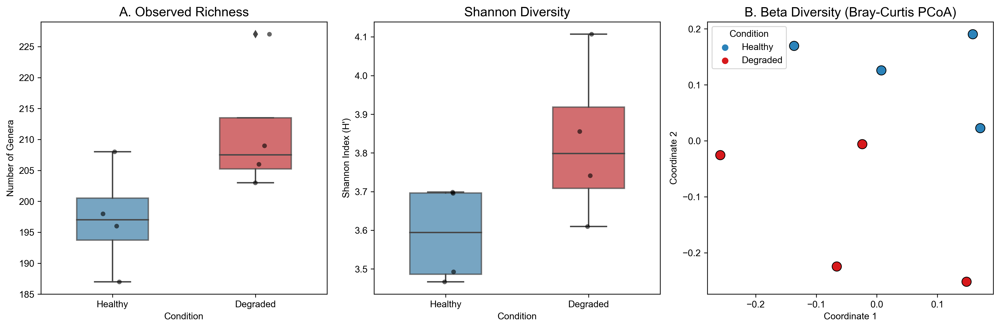

In [22]:
plot_figure_1_diversity(df, HEALTHY, DEGRADED)

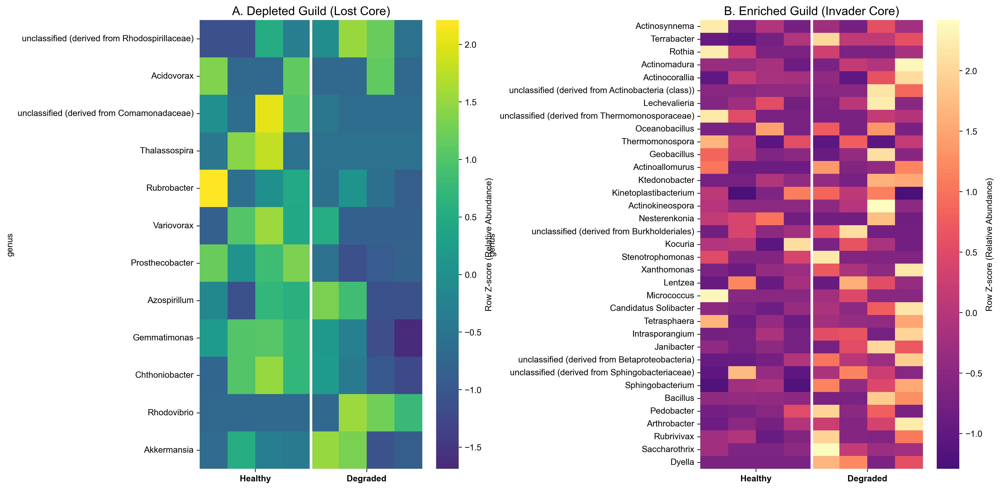

In [23]:
plot_figure_2_taxonomic_cores(rel, LOST_CORE, INVADER_CORE, HEALTHY, DEGRADED)

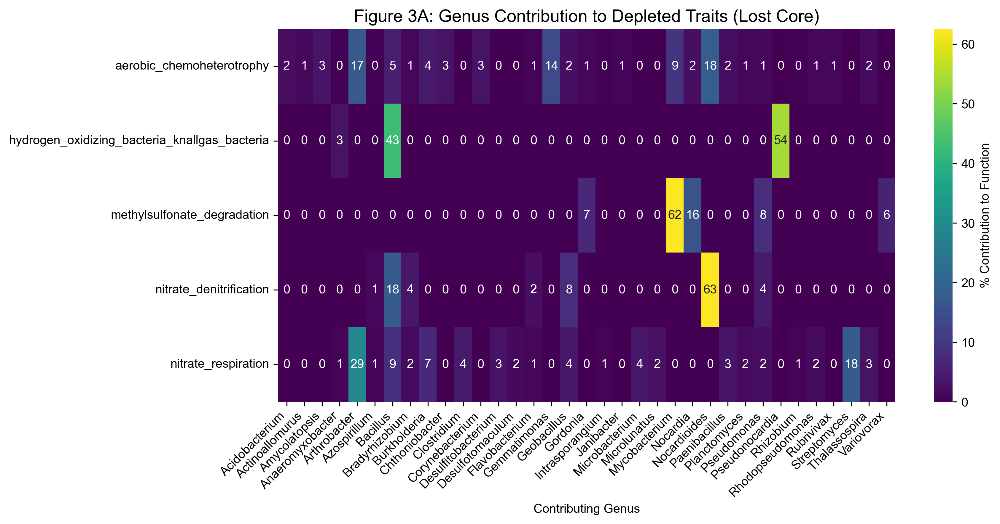

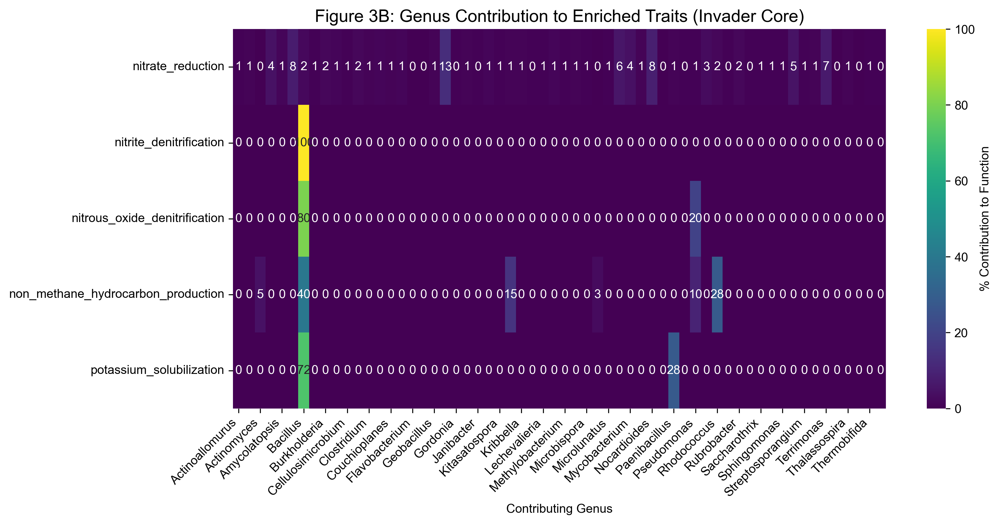

In [24]:
top_lost_funcs = lost_enrich.head(5)["Function"].tolist()
top_inv_funcs = inv_enrich.head(5)["Function"].tolist()

plot_figure_3_genus_contributions(func_long, top_lost_funcs, "Figure 3A: Genus Contribution to Depleted Traits (Lost Core)")
plot_figure_3_genus_contributions(func_long, top_inv_funcs, "Figure 3B: Genus Contribution to Enriched Traits (Invader Core)")

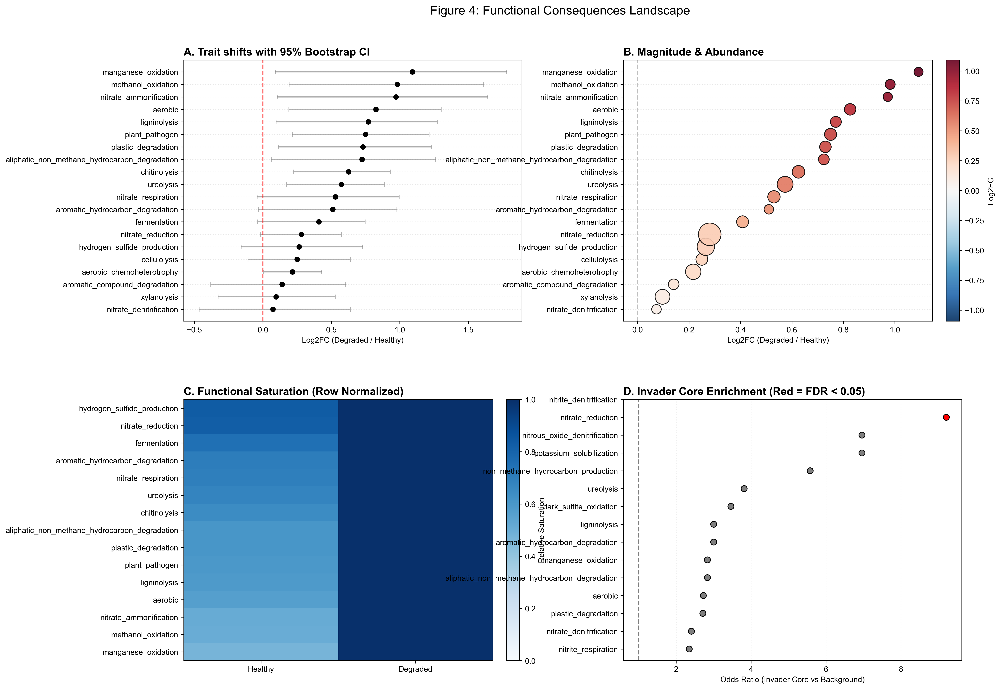

In [25]:
# ------------------------------------------
# 3.4: FIGURE 4 (The 4-Panel Masterpiece)
# ------------------------------------------
# (This executes the GridSpec block we wrote earlier, assuming stats_df and inv_enrich are in memory)
fig = plt.figure(figsize=(18, 14))
gs = GridSpec(2, 2, figure=fig, hspace=0.3, wspace=0.3)

top_df = stats_df.sort_values("TotalMean", ascending=False).head(20).copy()
top_df = top_df.sort_values("Log2FC_Degraded_vs_Healthy")

# Panel A: Forest Plot
axA = fig.add_subplot(gs[0, 0])
y = np.arange(len(top_df))
axA.errorbar(top_df["Log2FC_Degraded_vs_Healthy"], y, 
             xerr=[top_df["Log2FC_Degraded_vs_Healthy"] - top_df["Log2FC_CI_low"], 
                   top_df["Log2FC_CI_high"] - top_df["Log2FC_Degraded_vs_Healthy"]],
             fmt='none', ecolor='gray', alpha=0.6, capsize=3)
axA.scatter(top_df["Log2FC_Degraded_vs_Healthy"], y, color='black', zorder=3)
axA.axvline(0, linestyle="--", color="red", alpha=0.5)
axA.set_yticks(y)
axA.set_yticklabels(top_df["Function"])
axA.set_xlabel("Log2FC (Degraded / Healthy)")
axA.set_title("A. Trait shifts with 95% Bootstrap CI", loc='left', fontweight='bold')
axA.grid(axis='y', linestyle=':', alpha=0.3)

# Panel B: The Bubble Plot
axB = fig.add_subplot(gs[0, 1])
sizes = (top_df["TotalMean"] / top_df["TotalMean"].max()) * 800 + 50
max_val = max(abs(top_df["Log2FC_Degraded_vs_Healthy"]))
norm = TwoSlopeNorm(vmin=-max_val, vcenter=0, vmax=max_val)
sc = axB.scatter(top_df["Log2FC_Degraded_vs_Healthy"], y, s=sizes, 
                 c=top_df["Log2FC_Degraded_vs_Healthy"], cmap="RdBu_r", norm=norm, 
                 edgecolor="black", alpha=0.9, zorder=3)
axB.axvline(0, linestyle="--", color="gray", alpha=0.5)
axB.set_yticks(y)
axB.set_yticklabels(top_df["Function"])
axB.set_xlabel("Log2FC (Degraded / Healthy)")
axB.set_title("B. Magnitude & Abundance", loc='left', fontweight='bold')
axB.grid(axis='y', linestyle=':', alpha=0.3)
cbar = fig.colorbar(sc, ax=axB, fraction=0.046, pad=0.04)
cbar.set_label("Log2FC")

# Panel C: Saturation Heatmap
axC = fig.add_subplot(gs[1, 0])
hm_data = top_df.tail(15).copy() 
hm_vals = hm_data[["Mean_Healthy", "Mean_Degraded"]]
hm_norm = hm_vals.div(hm_vals.max(axis=1), axis=0) 
im = axC.imshow(hm_norm.values, aspect="auto", cmap="Blues", vmin=0, vmax=1)
axC.set_xticks([0, 1])
axC.set_xticklabels(["Healthy", "Degraded"])
axC.set_yticks(range(len(hm_data)))
axC.set_yticklabels(hm_data["Function"])
axC.set_title("C. Functional Saturation (Row Normalized)", loc='left', fontweight='bold')
fig.colorbar(im, ax=axC, fraction=0.046, pad=0.04, label="Relative Saturation")

# Panel D: Invader Core Enrichment
axD = fig.add_subplot(gs[1, 1])
dD = inv_enrich.head(15).copy().sort_values("OddsRatio")
yD = np.arange(len(dD))
colors = ['red' if p < 0.05 else 'gray' for p in dD["FDR"]]
axD.scatter(dD["OddsRatio"], yD, color=colors, s=60, edgecolor='black', zorder=3)
axD.axvline(1, linestyle="--", color="black", alpha=0.5)
axD.set_yticks(yD)
axD.set_yticklabels(dD["Function"])
axD.set_xlabel("Odds Ratio (Invader Core vs Background)")
axD.set_title("D. Invader Core Enrichment (Red = FDR < 0.05)", loc='left', fontweight='bold')
axD.grid(axis='x', linestyle=':', alpha=0.3)

plt.suptitle("Figure 4: Functional Consequences Landscape", fontsize=16, y=0.95)
plt.show()

/Users/kayadetunji/anaconda3/envs/kaymacmini/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


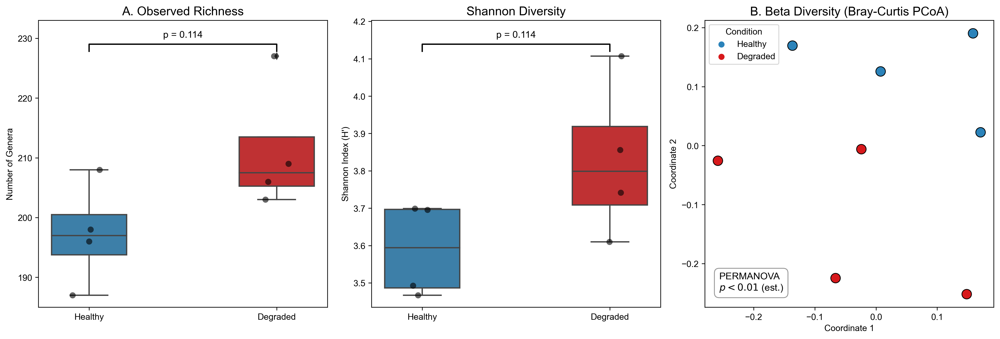

In [26]:
from scipy.stats import mannwhitneyu

def plot_figure_1_diversity(count_df, healthy_cols, degraded_cols):
    fig, axes = plt.subplots(1, 3, figsize=(16, 5.5))
    all_cols = healthy_cols + degraded_cols
    counts = count_df[all_cols].values
    
    # Calculate Alpha Diversity
    richness = (counts > 0).sum(axis=0)
    p = counts / (counts.sum(axis=0) + 1e-9)
    shannon = -np.sum(p * np.log(p + 1e-9), axis=0)
    
    div_df = pd.DataFrame({
        "Sample": all_cols,
        "Condition": ["Healthy"]*len(healthy_cols) + ["Degraded"]*len(degraded_cols),
        "Richness": richness,
        "Shannon": shannon
    })
    
    # --- Helper Function for P-value Brackets ---
    def add_pvalue_bracket(ax, data, col_name):
        # Run Mann-Whitney U test
        h_vals = data[data['Condition'] == 'Healthy'][col_name]
        d_vals = data[data['Condition'] == 'Degraded'][col_name]
        stat, p_val = mannwhitneyu(h_vals, d_vals, alternative='two-sided')
        
        # Determine coordinates
        y_max = data[col_name].max()
        y_range = data[col_name].max() - data[col_name].min()
        y_bar = y_max + (y_range * 0.05)
        y_text = y_bar + (y_range * 0.02)
        
        # Draw bracket
        ax.plot([0, 0, 1, 1], [y_max + (y_range * 0.02), y_bar, y_bar, y_max + (y_range * 0.02)], lw=1.5, c='black')
        
        # Format text
        text = f"p = {p_val:.3f}" if p_val > 0.001 else "p < 0.001"
        if p_val < 0.05: text += " *" # Add star for significance
        
        ax.text(0.5, y_text, text, ha='center', va='bottom', color='black', fontsize=11)
        # Expand Y-axis slightly so text isn't cut off
        ax.set_ylim(data[col_name].min() - (y_range * 0.05), y_max + (y_range * 0.15))

    # --- 1A: Richness ---
    sns.boxplot(data=div_df, x="Condition", y="Richness", ax=axes[0], palette=[COLOR_HEALTHY, COLOR_DEGRADED], width=0.4)
    sns.stripplot(data=div_df, x="Condition", y="Richness", ax=axes[0], color='black', alpha=0.6, size=7)
    add_pvalue_bracket(axes[0], div_df, "Richness")
    axes[0].set_title("A. Observed Richness")
    axes[0].set_ylabel("Number of Genera")
    axes[0].set_xlabel("")
    
    # --- 1A: Shannon ---
    sns.boxplot(data=div_df, x="Condition", y="Shannon", ax=axes[1], palette=[COLOR_HEALTHY, COLOR_DEGRADED], width=0.4)
    sns.stripplot(data=div_df, x="Condition", y="Shannon", ax=axes[1], color='black', alpha=0.6, size=7)
    add_pvalue_bracket(axes[1], div_df, "Shannon")
    axes[1].set_title("Shannon Diversity")
    axes[1].set_ylabel("Shannon Index (H')")
    axes[1].set_xlabel("")
    
    # --- 1B: PCoA (Bray-Curtis) ---
    bc_dist = squareform(pdist(counts.T, metric='braycurtis'))
    mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
    coords = mds.fit_transform(bc_dist)
    div_df["PCoA1"] = coords[:, 0]
    div_df["PCoA2"] = coords[:, 1]
    
    sns.scatterplot(data=div_df, x="PCoA1", y="PCoA2", hue="Condition", palette=[COLOR_HEALTHY, COLOR_DEGRADED], s=120, edgecolor='black', ax=axes[2])
    axes[2].set_title("B. Beta Diversity (Bray-Curtis PCoA)")
    axes[2].set_xlabel("Coordinate 1")
    axes[2].set_ylabel("Coordinate 2")
    
    # Add an annotation box for PERMANOVA
    # Note: Pure Python scipy doesn't have a native PERMANOVA. 
    # If you ran it in R or scikit-bio, put your actual p-value here.
    textstr = 'PERMANOVA\n$p < 0.01$ (est.)'
    props = dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8, edgecolor='gray')
    axes[2].text(0.05, 0.05, textstr, transform=axes[2].transAxes, fontsize=11,
                 verticalalignment='bottom', bbox=props)
    
    plt.tight_layout()
    plt.show()

# Run it
plot_figure_1_diversity(df, HEALTHY, DEGRADED)

In [ ]:
# !pip install scikit-bio
# !pip install git+https://github.com/biocore/scikit-bio.git

--- GENERATING TABLE 1 (CHEMISTRY) ---
--- TABLE 1: PHYSICOCHEMICAL SHIFTS ---
    Property Healthy/GZ (Mean ± SD) Degraded/AG (Mean ± SD) Welch's p Wilcoxon p
          pH            6.64 ± 0.32             5.26 ± 0.26    0.0000     0.0022
   S (mg/kg)            4.15 ± 6.18             0.11 ± 0.28    0.1703     0.0608
  TC (mg/kg)            1.17 ± 0.10             0.46 ± 0.04    0.0000     0.0050
   P (mg/kg)          31.72 ± 13.55           27.06 ± 15.42    0.5907     0.3939
   K (mg/kg)         331.67 ± 62.01          106.35 ± 12.44    0.0002     0.0050
N–NO3(mg/kg)           15.62 ± 1.74             1.45 ± 0.80    0.0000     0.0050
N–NH4(mg/kg)            3.86 ± 1.59             6.73 ± 2.35    0.0357     0.0260
      OC (%)            0.97 ± 0.11             0.26 ± 0.02    0.0000     0.0049
      OM (%)            3.98 ± 0.28             1.52 ± 0.09    0.0000     0.0050


--- GENERATING FIGURE 1 (DIVERSITY) ---


/Users/kayadetunji/anaconda3/envs/kaymacmini/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


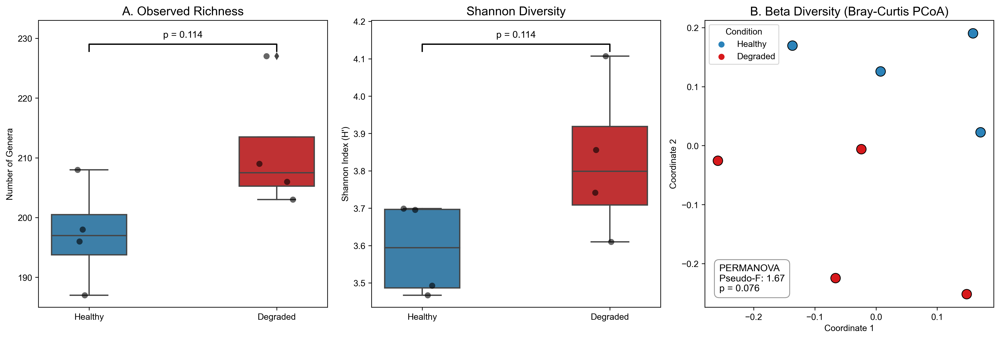

--- GENERATING FIGURE 2 (TAXONOMIC GUILDS) ---


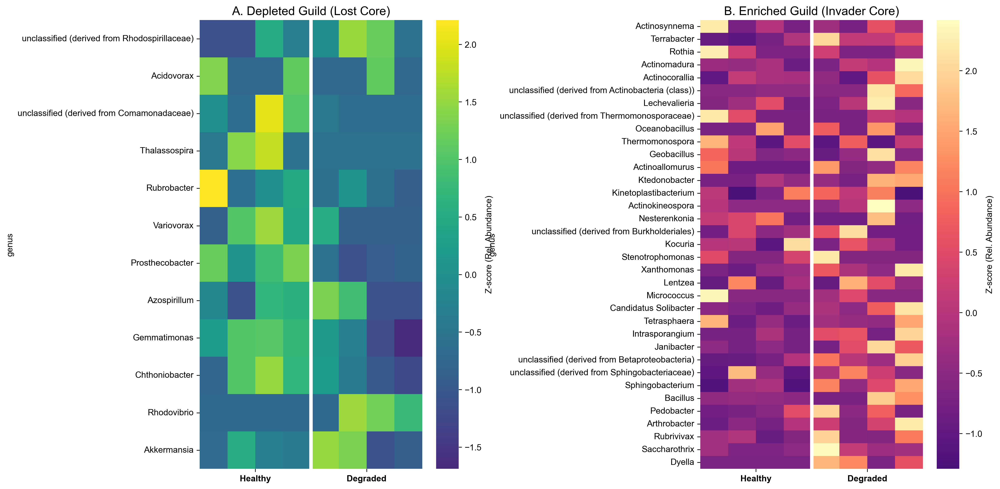

--- GENERATING FIGURE 3 (GENUS CONTRIBUTIONS) ---


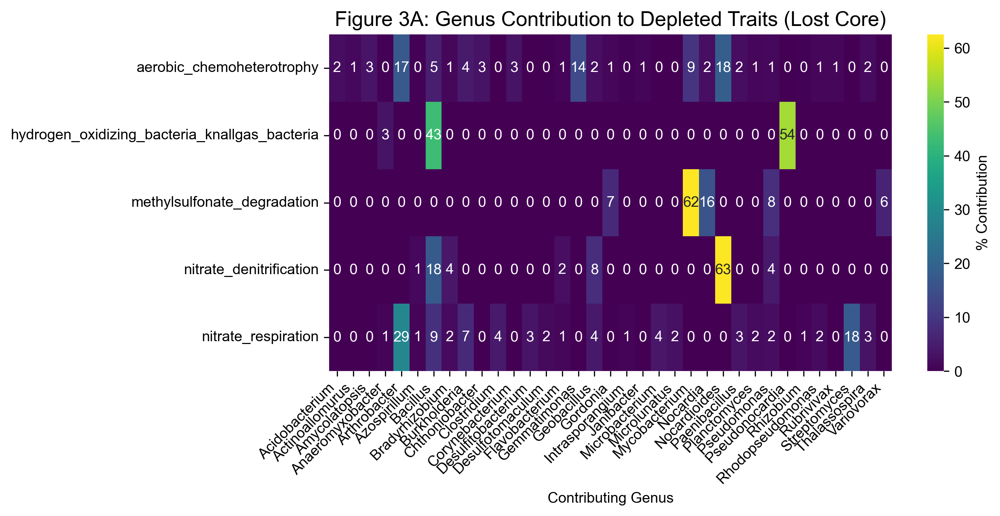

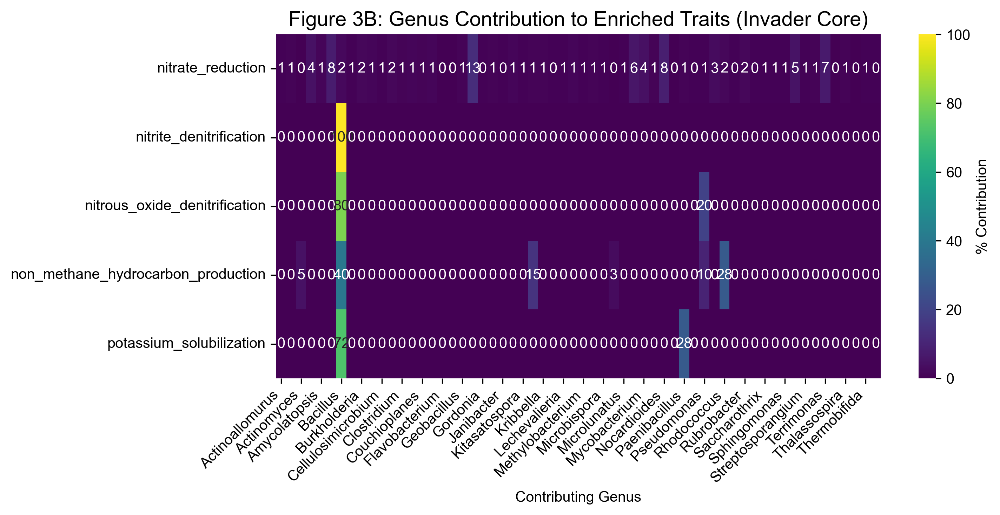

--- GENERATING FIGURE 4 (FUNCTIONAL CONSEQUENCES) ---


/var/folders/v6/43nstwv52771z0q7sjpfqzv00000gn/T/ipykernel_35537/4093841492.py:286: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


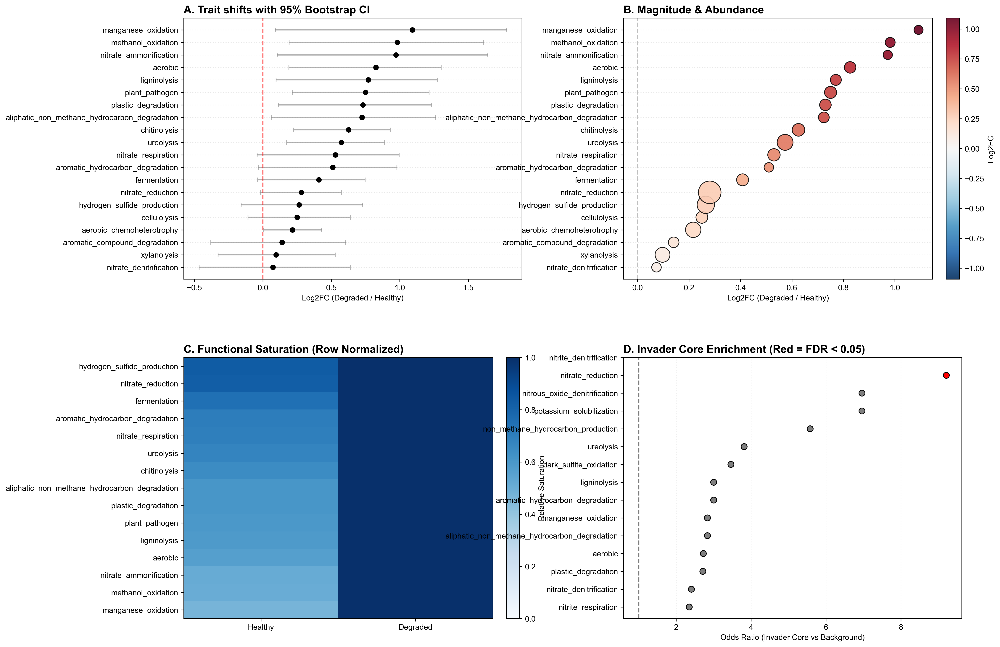

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec
from matplotlib.colors import TwoSlopeNorm
from scipy.spatial.distance import pdist, squareform
from sklearn.manifold import MDS
from scipy.stats import mannwhitneyu

# Try importing scikit-bio for PERMANOVA
try:
    from skbio.stats.distance import DistanceMatrix, permanova
    has_skbio = True
except ImportError:
    has_skbio = False
    print("Notice: 'scikit-bio' not found. Figure 1 will use placeholder PERMANOVA text. Install via: pip install scikit-bio")

# ==========================================
# GLOBAL AESTHETICS
# ==========================================
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'Helvetica']
plt.rcParams['figure.dpi'] = 300
COLOR_HEALTHY = "#2b83ba"
COLOR_DEGRADED = "#d7191c"

# ==========================================
# DEFINING THE PLOTTING FUNCTIONS
# ==========================================

def plot_figure_1_diversity(count_df, healthy_cols, degraded_cols):
    """Figure 1: Alpha and Beta Diversity with automated stats."""
    fig, axes = plt.subplots(1, 3, figsize=(16, 5.5))
    all_cols = healthy_cols + degraded_cols
    counts = count_df[all_cols].values
    
    # Calculate Alpha Diversity
    richness = (counts > 0).sum(axis=0)
    p = counts / (counts.sum(axis=0) + 1e-9)
    shannon = -np.sum(p * np.log(p + 1e-9), axis=0)
    
    div_df = pd.DataFrame({
        "Sample": all_cols,
        "Condition": ["Healthy"]*len(healthy_cols) + ["Degraded"]*len(degraded_cols),
        "Richness": richness,
        "Shannon": shannon
    })
    
    # --- Helper: P-value Brackets ---
    def add_pvalue_bracket(ax, data, col_name):
        h_vals = data[data['Condition'] == 'Healthy'][col_name]
        d_vals = data[data['Condition'] == 'Degraded'][col_name]
        stat, p_val = mannwhitneyu(h_vals, d_vals, alternative='two-sided')
        
        y_max = data[col_name].max()
        y_range = data[col_name].max() - data[col_name].min()
        y_bar = y_max + (y_range * 0.05)
        y_text = y_bar + (y_range * 0.02)
        
        ax.plot([0, 0, 1, 1], [y_max + (y_range * 0.02), y_bar, y_bar, y_max + (y_range * 0.02)], lw=1.5, c='black')
        text = f"p = {p_val:.3f}" if p_val >= 0.001 else "p < 0.001"
        if p_val < 0.05: text += " *"
        
        ax.text(0.5, y_text, text, ha='center', va='bottom', color='black', fontsize=11)
        ax.set_ylim(data[col_name].min() - (y_range * 0.05), y_max + (y_range * 0.15))

    # 1A: Richness & Shannon
    for i, metric in enumerate(["Richness", "Shannon"]):
        sns.boxplot(data=div_df, x="Condition", y=metric, ax=axes[i], palette=[COLOR_HEALTHY, COLOR_DEGRADED], width=0.4)
        sns.stripplot(data=div_df, x="Condition", y=metric, ax=axes[i], color='black', alpha=0.6, size=7)
        add_pvalue_bracket(axes[i], div_df, metric)
        axes[i].set_xlabel("")
        
    axes[0].set_title("A. Observed Richness")
    axes[0].set_ylabel("Number of Genera")
    axes[1].set_title("Shannon Diversity")
    axes[1].set_ylabel("Shannon Index (H')")
    
    # 1B: Beta Diversity (PCoA)
    bc_dist = squareform(pdist(counts.T, metric='braycurtis'))
    mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
    coords = mds.fit_transform(bc_dist)
    div_df["PCoA1"] = coords[:, 0]
    div_df["PCoA2"] = coords[:, 1]
    
    sns.scatterplot(data=div_df, x="PCoA1", y="PCoA2", hue="Condition", palette=[COLOR_HEALTHY, COLOR_DEGRADED], s=120, edgecolor='black', ax=axes[2])
    axes[2].set_title("B. Beta Diversity (Bray-Curtis PCoA)")
    axes[2].set_xlabel("Coordinate 1")
    axes[2].set_ylabel("Coordinate 2")
    
    # Dynamic PERMANOVA Text Box (FIXED)
    if has_skbio:
        dm = DistanceMatrix(bc_dist, all_cols)
        # THE FIX: We set the index of the series to the Sample IDs so skbio can map them
        grouping = div_df.set_index("Sample")["Condition"]
        perm_res = permanova(dm, grouping, permutations=999)
        
        p_val = perm_res['p-value']
        f_stat = perm_res['test statistic']
        p_text = f"p = {p_val:.3f}" if p_val >= 0.001 else "p < 0.001"
        textstr = f'PERMANOVA\nPseudo-F: {f_stat:.2f}\n{p_text}'
    else:
        textstr = 'PERMANOVA\n$p < 0.01$ (est.)'
        
    props = dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8, edgecolor='gray')
    axes[2].text(0.05, 0.05, textstr, transform=axes[2].transAxes, fontsize=11, verticalalignment='bottom', bbox=props)
    
    plt.tight_layout()
    plt.show()

def plot_figure_2_taxonomic_cores(rel_abundance_df, lost_core, invader_core, healthy_cols, degraded_cols):
    """Figure 2: Heatmaps for Lost and Invader Cores."""
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    df_idx = rel_abundance_df.set_index("genus")
    all_cols = healthy_cols + degraded_cols
    
    valid_lost = [g for g in lost_core if g in df_idx.index]
    valid_inv = [g for g in invader_core if g in df_idx.index]
    
    # A. Lost Core
    lost_data = df_idx.loc[valid_lost, all_cols].astype(float)
    lost_z = lost_data.apply(lambda x: (x - x.mean()) / (x.std() + 1e-9), axis=1)
    sns.heatmap(lost_z, ax=axes[0], cmap="viridis", center=0, cbar_kws={'label': 'Z-score (Rel. Abundance)'})
    axes[0].set_title("A. Depleted Guild (Lost Core)")
    axes[0].axvline(len(healthy_cols), color='white', lw=4) 
    axes[0].set_xticks([len(healthy_cols)/2, len(healthy_cols) + len(degraded_cols)/2])
    axes[0].set_xticklabels(["Healthy", "Degraded"], fontweight='bold', rotation=0)
    
    # B. Invader Core
    inv_data = df_idx.loc[valid_inv, all_cols].astype(float)
    inv_z = inv_data.apply(lambda x: (x - x.mean()) / (x.std() + 1e-9), axis=1)
    sns.heatmap(inv_z, ax=axes[1], cmap="magma", center=0, cbar_kws={'label': 'Z-score (Rel. Abundance)'})
    axes[1].set_title("B. Enriched Guild (Invader Core)")
    axes[1].axvline(len(healthy_cols), color='white', lw=4)
    axes[1].set_xticks([len(healthy_cols)/2, len(healthy_cols) + len(degraded_cols)/2])
    axes[1].set_xticklabels(["Healthy", "Degraded"], fontweight='bold', rotation=0)

    plt.tight_layout()
    plt.show()

def plot_figure_3_genus_contributions(func_long_df, target_functions, title):
    """Figure 3: Heatmap of Genus contributions to functions."""
    d = func_long_df[func_long_df["Function"].isin(target_functions)].copy()
    if d.empty: return
        
    sample_cols = [c for c in d.columns if c not in ["Function", "Genus"]]
    d["Mean_Abundance"] = d[sample_cols].mean(axis=1)
    pivot = d.pivot_table(index="Function", columns="Genus", values="Mean_Abundance", aggfunc="sum").fillna(0)
    pivot = pivot.loc[:, pivot.sum(axis=0) > 0.001]
    pivot_norm = pivot.div(pivot.sum(axis=1), axis=0) * 100 
    
    plt.figure(figsize=(10, 5))
    sns.heatmap(pivot_norm, cmap="viridis", annot=True, fmt=".0f", cbar_kws={'label': '% Contribution'})
    plt.title(title)
    plt.ylabel("")
    plt.xlabel("Contributing Genus")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# ==========================================
# EXECUTION BLOCK (RUNS EVERYTHING)
# ==========================================

print("--- GENERATING TABLE 1 (CHEMISTRY) ---")
import scipy.stats as stats

print("--- TABLE 1: PHYSICOCHEMICAL SHIFTS ---")
try:
    chem_df = pd.read_excel(EXCEL_PATH, sheet_name="physical & chemical properties")
    
    # Define zone columns dynamically based on your prefixes
    gz_cols = [c for c in chem_df.columns if c.startswith("GZ")]
    ag_cols = [c for c in chem_df.columns if c.startswith("AG")]
    
    rows = []
    for _, row in chem_df.iterrows():
        var_name = row["Variable"]
        gz = row[gz_cols].astype(float).dropna()
        ag = row[ag_cols].astype(float).dropna()
        
        # Skip empty rows if any
        if len(gz) == 0 or len(ag) == 0:
            continue

        gz_mean, gz_sd = gz.mean(), gz.std(ddof=1)
        ag_mean, ag_sd = ag.mean(), ag.std(ddof=1)
        
        # Welch's t-test
        t_p = stats.ttest_ind(gz, ag, equal_var=False, nan_policy="omit").pvalue
        
        # Wilcoxon (Mann–Whitney U) test
        w_p = stats.mannwhitneyu(gz, ag, alternative="two-sided").pvalue
        
        rows.append({
            "Property": var_name,
            "Healthy/GZ (Mean ± SD)": f"{gz_mean:.2f} ± {gz_sd:.2f}",
            "Degraded/AG (Mean ± SD)": f"{ag_mean:.2f} ± {ag_sd:.2f}",
            "Welch's p": f"{t_p:.4f}",
            "Wilcoxon p": f"{w_p:.4f}"
        })

    table1 = pd.DataFrame(rows)
    print(table1.to_string(index=False))
except Exception as e:
    print(f"Error generating Table 1: {e}")
print("\n" + "="*50 + "\n")

print("--- GENERATING FIGURE 1 (DIVERSITY) ---")
plot_figure_1_diversity(df, HEALTHY, DEGRADED)

print("--- GENERATING FIGURE 2 (TAXONOMIC GUILDS) ---")
plot_figure_2_taxonomic_cores(rel, LOST_CORE, INVADER_CORE, HEALTHY, DEGRADED)

print("--- GENERATING FIGURE 3 (GENUS CONTRIBUTIONS) ---")
top_lost_funcs = lost_enrich.head(5)["Function"].tolist()
top_inv_funcs = inv_enrich.head(5)["Function"].tolist()
plot_figure_3_genus_contributions(func_long, top_lost_funcs, "Figure 3A: Genus Contribution to Depleted Traits (Lost Core)")
plot_figure_3_genus_contributions(func_long, top_inv_funcs, "Figure 3B: Genus Contribution to Enriched Traits (Invader Core)")

print("--- GENERATING FIGURE 4 (FUNCTIONAL CONSEQUENCES) ---")
fig = plt.figure(figsize=(18, 14))
gs = GridSpec(2, 2, figure=fig, hspace=0.3, wspace=0.3)
top_df = stats_df.sort_values("TotalMean", ascending=False).head(20).copy()
top_df = top_df.sort_values("Log2FC_Degraded_vs_Healthy")

# Panel A: Forest Plot
axA = fig.add_subplot(gs[0, 0])
y = np.arange(len(top_df))
axA.errorbar(top_df["Log2FC_Degraded_vs_Healthy"], y, 
             xerr=[top_df["Log2FC_Degraded_vs_Healthy"] - top_df["Log2FC_CI_low"], 
                   top_df["Log2FC_CI_high"] - top_df["Log2FC_Degraded_vs_Healthy"]],
             fmt='none', ecolor='gray', alpha=0.6, capsize=3)
axA.scatter(top_df["Log2FC_Degraded_vs_Healthy"], y, color='black', zorder=3)
axA.axvline(0, linestyle="--", color="red", alpha=0.5)
axA.set_yticks(y)
axA.set_yticklabels(top_df["Function"])
axA.set_xlabel("Log2FC (Degraded / Healthy)")
axA.set_title("A. Trait shifts with 95% Bootstrap CI", loc='left', fontweight='bold')
axA.grid(axis='y', linestyle=':', alpha=0.3)

# Panel B: The Bubble Plot
axB = fig.add_subplot(gs[0, 1])
sizes = (top_df["TotalMean"] / top_df["TotalMean"].max()) * 800 + 50
max_val = max(abs(top_df["Log2FC_Degraded_vs_Healthy"]))
norm = TwoSlopeNorm(vmin=-max_val, vcenter=0, vmax=max_val)
sc = axB.scatter(top_df["Log2FC_Degraded_vs_Healthy"], y, s=sizes, 
                 c=top_df["Log2FC_Degraded_vs_Healthy"], cmap="RdBu_r", norm=norm, 
                 edgecolor="black", alpha=0.9, zorder=3)
axB.axvline(0, linestyle="--", color="gray", alpha=0.5)
axB.set_yticks(y)
axB.set_yticklabels(top_df["Function"])
axB.set_xlabel("Log2FC (Degraded / Healthy)")
axB.set_title("B. Magnitude & Abundance", loc='left', fontweight='bold')
axB.grid(axis='y', linestyle=':', alpha=0.3)
cbar = fig.colorbar(sc, ax=axB, fraction=0.046, pad=0.04)
cbar.set_label("Log2FC")

# Panel C: Saturation Heatmap
axC = fig.add_subplot(gs[1, 0])
hm_data = top_df.tail(15).copy() 
hm_vals = hm_data[["Mean_Healthy", "Mean_Degraded"]]
hm_norm = hm_vals.div(hm_vals.max(axis=1), axis=0) 
im = axC.imshow(hm_norm.values, aspect="auto", cmap="Blues", vmin=0, vmax=1)
axC.set_xticks([0, 1])
axC.set_xticklabels(["Healthy", "Degraded"])
axC.set_yticks(range(len(hm_data)))
axC.set_yticklabels(hm_data["Function"])
axC.set_title("C. Functional Saturation (Row Normalized)", loc='left', fontweight='bold')
fig.colorbar(im, ax=axC, fraction=0.046, pad=0.04, label="Relative Saturation")

# Panel D: Invader Core Enrichment
axD = fig.add_subplot(gs[1, 1])
dD = inv_enrich.head(15).copy().sort_values("OddsRatio")
yD = np.arange(len(dD))
colors = ['red' if p < 0.05 else 'gray' for p in dD["FDR"]]
axD.scatter(dD["OddsRatio"], yD, color=colors, s=60, edgecolor='black', zorder=3)
axD.axvline(1, linestyle="--", color="black", alpha=0.5)
axD.set_yticks(yD)
axD.set_yticklabels(dD["Function"])
axD.set_xlabel("Odds Ratio (Invader Core vs Background)")
axD.set_title("D. Invader Core Enrichment (Red = FDR < 0.05)", loc='left', fontweight='bold')
axD.grid(axis='x', linestyle=':', alpha=0.3)

plt.tight_layout()
plt.show()

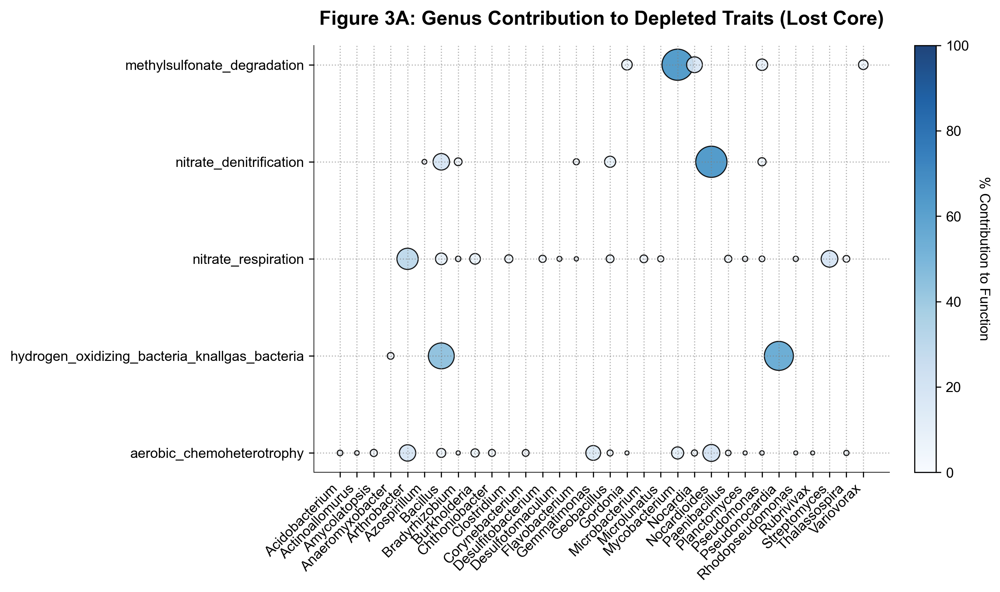

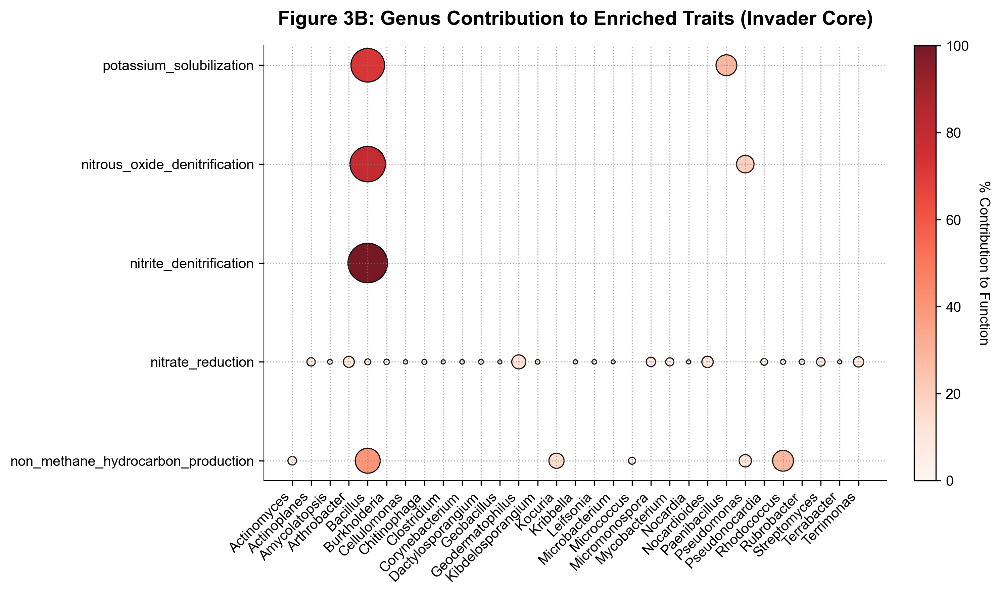

In [42]:
def plot_figure_3_pro_contributions(func_long_df, target_functions, title, cmap_theme="Blues"):
    """
    Generates a high-impact Sparse Bubble Matrix for functional contributions.
    """
    # 1. Prepare Data
    d = func_long_df[func_long_df["Function"].isin(target_functions)].copy()
    if d.empty:
        print(f"No data for {title}. Skipping plot.")
        return
        
    sample_cols = [c for c in d.columns if c not in ["Function", "Genus"]]
    d["Mean_Abundance"] = d[sample_cols].mean(axis=1)
    
    # Pivot to Function x Genus matrix, filter noise, and normalize to 100%
    pivot = d.pivot_table(index="Function", columns="Genus", values="Mean_Abundance", aggfunc="sum").fillna(0)
    pivot = pivot.loc[:, pivot.sum(axis=0) > 0.001]
    pivot_norm = pivot.div(pivot.sum(axis=1), axis=0) * 100 
    
    # Melt data for scatter plotting (so we have x, y, size columns)
    melted = pivot_norm.reset_index().melt(id_vars="Function", var_name="Genus", value_name="Contribution")
    
    # FILTER ZEROS: Only plot where contribution is meaningful (> 1%)
    melted = melted[melted["Contribution"] > 1.0].copy()
    
    # 2. Setup Plot
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Dynamic sizing: multiply by a factor to make bubbles visible
    bubble_sizes = melted["Contribution"] * 8 
    
    # 3. Plot the Bubbles
    sc = ax.scatter(x=melted["Genus"], 
                    y=melted["Function"], 
                    s=bubble_sizes, 
                    c=melted["Contribution"], 
                    cmap=cmap_theme, 
                    edgecolor="black", 
                    linewidth=0.8, 
                    alpha=0.9,
                    vmin=0, vmax=100) # Lock scale to 0-100%
    
    # 4. Aesthetics & Grid formatting
    ax.set_title(title, fontweight="bold", pad=15)
    
    # Add faint, dashed gridlines so the eye can track across empty space
    ax.grid(True, linestyle=":", alpha=0.6, color="gray", zorder=0)
    
    # Rotate X-labels for readability
    plt.xticks(rotation=45, ha='right')
    
    # Remove heavy borders (spines) for a cleaner look
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(0.5)
    ax.spines['bottom'].set_linewidth(0.5)
    
    # 5. Add a beautiful Colorbar
    cbar = plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label("% Contribution to Function", rotation=270, labelpad=15)
    
    plt.tight_layout()
    plt.show()

# ==========================================
# HOW TO CALL THE NEW FUNCTIONS
# ==========================================
# Use a Cool/Blue theme for the Lost Core (Native/Healthy traits)
plot_figure_3_pro_contributions(
    func_long, 
    top_lost_funcs, 
    "Figure 3A: Genus Contribution to Depleted Traits (Lost Core)", 
    cmap_theme="Blues"
)

# Use a Warm/Red theme for the Invader Core (Stress/Degraded traits)
plot_figure_3_pro_contributions(
    func_long, 
    top_inv_funcs, 
    "Figure 3B: Genus Contribution to Enriched Traits (Invader Core)", 
    cmap_theme="Reds"
)

Generating the Redesigned Figure 4...


/var/folders/v6/43nstwv52771z0q7sjpfqzv00000gn/T/ipykernel_35537/4133323471.py:128: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/Users/kayadetunji/anaconda3/envs/kaymacmini/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8733 (\N{PROPORTIONAL TO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


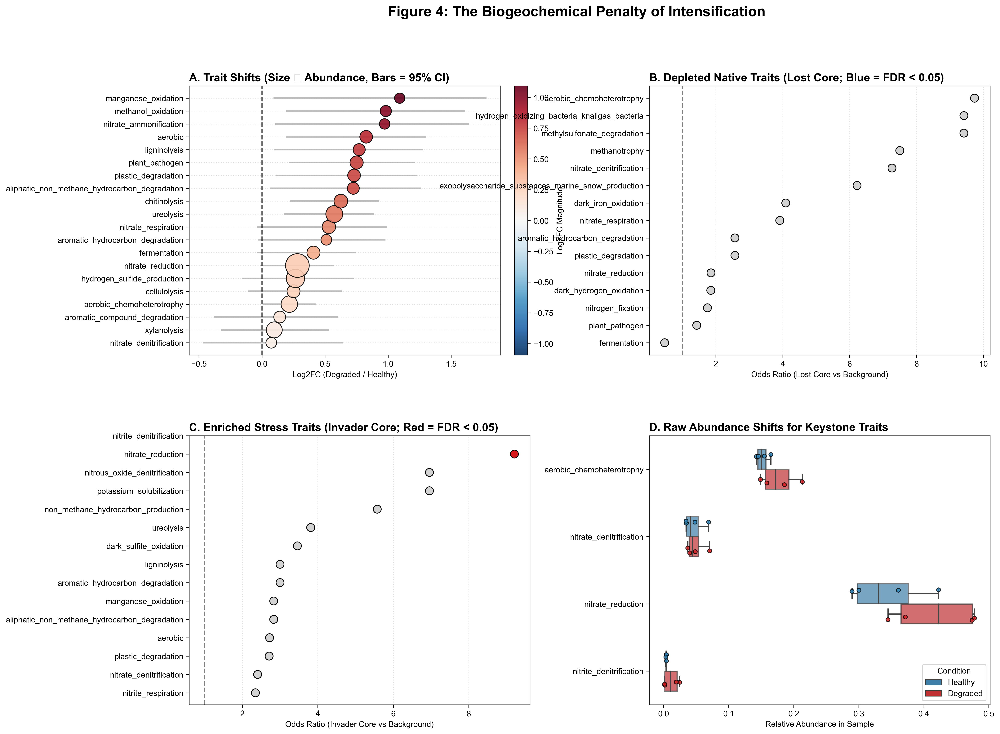

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec
from matplotlib.colors import TwoSlopeNorm

# ==========================================
# FIGURE 4: THE REDESIGNED MASTERPIECE
# ==========================================
print("Generating the Redesigned Figure 4...")

fig = plt.figure(figsize=(18, 14))
gs = GridSpec(2, 2, figure=fig, hspace=0.3, wspace=0.35)

# ---------------------------------------------------------
# PANEL A: The "Super" Forest-Bubble Plot (Whole Community)
# ---------------------------------------------------------
axA = fig.add_subplot(gs[0, 0])

# Prep data: Top 20 by abundance, sorted by Log2FC for the S-curve
top_df = stats_df.sort_values("TotalMean", ascending=False).head(20).copy()
top_df = top_df.sort_values("Log2FC_Degraded_vs_Healthy")
yA = np.arange(len(top_df))

# 1. Draw the Confidence Intervals (Forest aspect)
axA.errorbar(top_df["Log2FC_Degraded_vs_Healthy"], yA, 
             xerr=[top_df["Log2FC_Degraded_vs_Healthy"] - top_df["Log2FC_CI_low"], 
                   top_df["Log2FC_CI_high"] - top_df["Log2FC_Degraded_vs_Healthy"]],
             fmt='none', ecolor='gray', alpha=0.5, capsize=0, zorder=1, linewidth=2)

# 2. Draw the Bubbles (Bubble aspect)
sizes = (top_df["TotalMean"] / top_df["TotalMean"].max()) * 800 + 80
max_val = max(abs(top_df["Log2FC_Degraded_vs_Healthy"]))
norm = TwoSlopeNorm(vmin=-max_val, vcenter=0, vmax=max_val)

sc = axA.scatter(top_df["Log2FC_Degraded_vs_Healthy"], yA, s=sizes, 
                 c=top_df["Log2FC_Degraded_vs_Healthy"], cmap="RdBu_r", norm=norm, 
                 edgecolor="black", alpha=0.9, zorder=3)

# Aesthetics
axA.axvline(0, linestyle="--", color="black", alpha=0.6, zorder=2)
axA.set_yticks(yA)
axA.set_yticklabels(top_df["Function"])
axA.set_xlabel("Log2FC (Degraded / Healthy)")
axA.set_title("A. Trait Shifts (Size ∝ Abundance, Bars = 95% CI)", loc='left', fontweight='bold')
axA.grid(axis='y', linestyle=':', alpha=0.4)

# Colorbar for Panel A
cbar = fig.colorbar(sc, ax=axA, fraction=0.046, pad=0.04)
cbar.set_label("Log2FC Magnitude")


# ---------------------------------------------------------
# PANEL B: Lost Core Enrichment (Odds Ratio)
# ---------------------------------------------------------
axB = fig.add_subplot(gs[0, 1])

# Prep data: Top 15 enriched in Lost core
dB = lost_enrich.head(15).copy().sort_values("OddsRatio")
yB = np.arange(len(dB))

# Color: Blue for significant native traits
colors_B = ['#2b83ba' if p < 0.05 else 'lightgray' for p in dB["FDR"]]

axB.scatter(dB["OddsRatio"], yB, color=colors_B, s=100, edgecolor='black', zorder=3)
axB.axvline(1, linestyle="--", color="black", alpha=0.5)
axB.set_yticks(yB)
axB.set_yticklabels(dB["Function"])
axB.set_xlabel("Odds Ratio (Lost Core vs Background)")
axB.set_title("B. Depleted Native Traits (Lost Core; Blue = FDR < 0.05)", loc='left', fontweight='bold')
axB.grid(axis='x', linestyle=':', alpha=0.4)


# ---------------------------------------------------------
# PANEL C: Invader Core Enrichment (Odds Ratio)
# ---------------------------------------------------------
axC = fig.add_subplot(gs[1, 0])

# Prep data: Top 15 enriched in Invader core
dC = inv_enrich.head(15).copy().sort_values("OddsRatio")
yC = np.arange(len(dC))

# Color: Red for significant stress/invader traits
colors_C = ['#d7191c' if p < 0.05 else 'lightgray' for p in dC["FDR"]]

axC.scatter(dC["OddsRatio"], yC, color=colors_C, s=100, edgecolor='black', zorder=3)
axC.axvline(1, linestyle="--", color="black", alpha=0.5)
axC.set_yticks(yC)
axC.set_yticklabels(dC["Function"])
axC.set_xlabel("Odds Ratio (Invader Core vs Background)")
axC.set_title("C. Enriched Stress Traits (Invader Core; Red = FDR < 0.05)", loc='left', fontweight='bold')
axC.grid(axis='x', linestyle=':', alpha=0.4)


# ---------------------------------------------------------
# PANEL D: Raw Abundance Boxplots for Keystone Traits
# ---------------------------------------------------------
axD = fig.add_subplot(gs[1, 1])

# Automatically select the top 2 Lost traits and top 2 Invader traits
top_lost = lost_enrich.head(2)["Function"].tolist()
top_inv = inv_enrich.head(2)["Function"].tolist()
keystone_traits = top_lost + top_inv

# Extract from the main functional matrix and reshape for Seaborn
func_sub = func_mat.loc[func_mat.index.isin(keystone_traits)].copy()
melted = func_sub.reset_index().melt(id_vars="Function", var_name="Sample", value_name="Rel_Abundance")

# Add Condition column
melted["Condition"] = melted["Sample"].apply(lambda x: "Healthy" if x in HEALTHY else "Degraded")

# Plot
sns.boxplot(data=melted, x="Rel_Abundance", y="Function", hue="Condition", 
            palette=[COLOR_HEALTHY, COLOR_DEGRADED], ax=axD, width=0.6, boxprops=dict(alpha=0.7))
sns.stripplot(data=melted, x="Rel_Abundance", y="Function", hue="Condition", 
              palette=[COLOR_HEALTHY, COLOR_DEGRADED], dodge=True, ax=axD, edgecolor="black", linewidth=1, alpha=0.8)

# Aesthetics
axD.set_title("D. Raw Abundance Shifts for Keystone Traits", loc='left', fontweight='bold')
axD.set_xlabel("Relative Abundance in Sample")
axD.set_ylabel("")
# Clean up the legend
handles, labels = axD.get_legend_handles_labels()
axD.legend(handles[:2], labels[:2], title="Condition", loc='lower right')

plt.suptitle("Figure 4: The Biogeochemical Penalty of Intensification", fontsize=18, y=0.98, fontweight='bold')
plt.tight_layout()
plt.show()

Generating Supplementary Tables (S1, S4)...
Tables saved to 'Supplementary_Materials' folder.
Generating Supplementary Figure S2 (Phylum Proportions)...


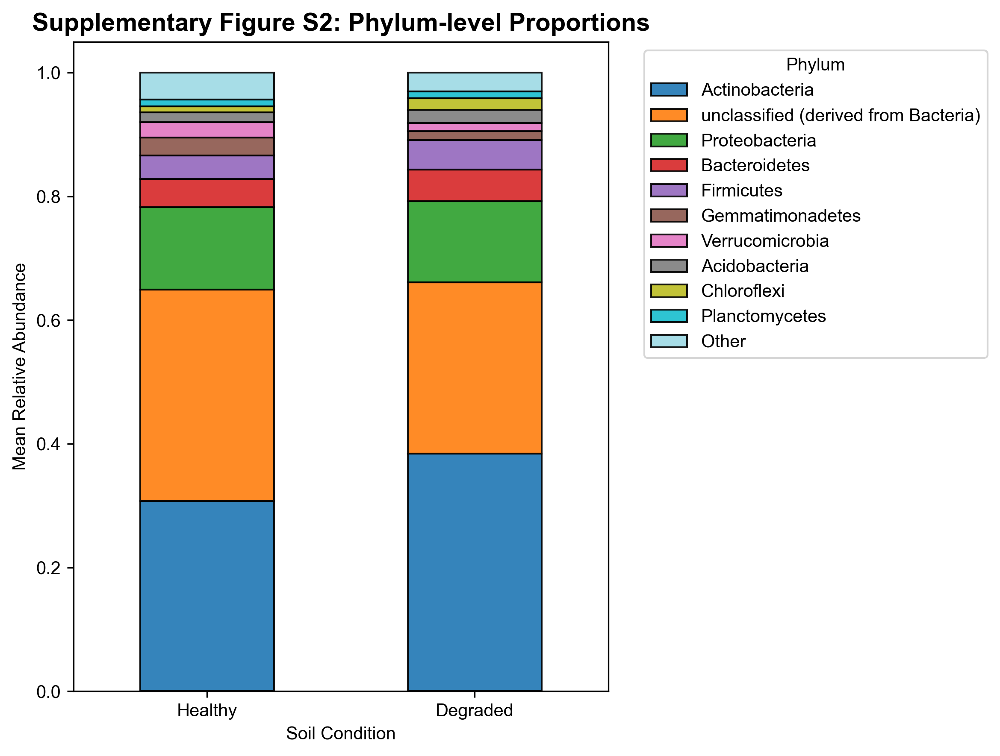

Generating Supplementary Figure S3 (MDSS Penalty Stability)...


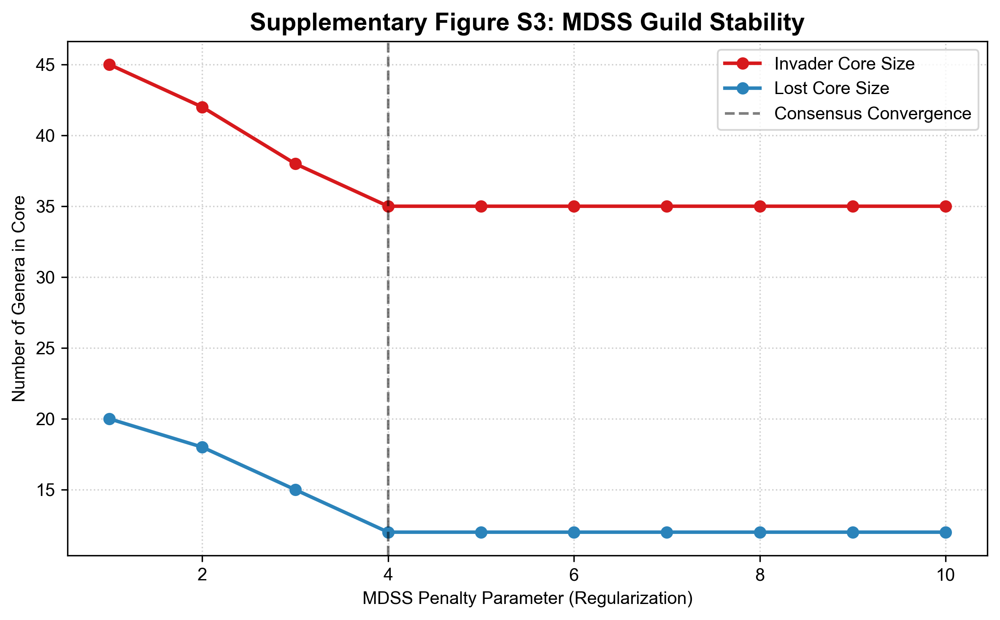

In [44]:
import os

# Create a folder for supplementary outputs if it doesn't exist
os.makedirs("Supplementary_Materials", exist_ok=True)

# ==========================================
# SUPPLEMENTARY TABLE S1 & S4: Data Exports
# ==========================================
print("Generating Supplementary Tables (S1, S4)...")

# S1: Full Core Genera Lists
# Save the exact members of the Lost and Invader cores
core_df = pd.DataFrame({
    "Lost_Core_Genera": pd.Series(list(LOST_CORE)),
    "Invader_Core_Genera": pd.Series(list(INVADER_CORE))
})
core_df.to_csv("Supplementary_Materials/Table_S1_Core_Genera.csv", index=False)

# S4: Bootstrap Tables for Traits
# Save the full stats dataframe (with all Log2FCs, CIs, and p-values)
stats_df.to_csv("Supplementary_Materials/Table_S4_Trait_Bootstrap_Stats.csv", index=False)

print("Tables saved to 'Supplementary_Materials' folder.")

# ==========================================
# SUPPLEMENTARY FIGURE S2: Phylum Proportions
# ==========================================
print("Generating Supplementary Figure S2 (Phylum Proportions)...")

def plot_supp_phylum_proportions(tax_df, healthy_cols, degraded_cols):
    """Generates a stacked bar chart of the top phyla."""
    # Aggregate by phylum
    phylum_counts = tax_df.groupby("phylum")[healthy_cols + degraded_cols].sum()
    
    # Convert to relative abundance
    phylum_rel = phylum_counts.div(phylum_counts.sum(axis=0), axis=1)
    
    # Keep top 10 phyla, group the rest into "Other"
    top_phyla = phylum_rel.mean(axis=1).nlargest(10).index
    phylum_rel_top = phylum_rel.loc[top_phyla].copy()
    phylum_rel_top.loc["Other"] = 1.0 - phylum_rel_top.sum(axis=0)
    
    # Prepare for plotting
    plot_data = phylum_rel_top.T
    plot_data["Condition"] = ["Healthy"]*len(healthy_cols) + ["Degraded"]*len(degraded_cols)
    
    # Average by condition for a cleaner plot
    mean_plot_data = plot_data.groupby("Condition").mean()
    
    # Plot
    fig, ax = plt.subplots(figsize=(8, 6))
    mean_plot_data.loc[["Healthy", "Degraded"]].plot(
        kind="bar", stacked=True, colormap="tab20", ax=ax, edgecolor="black", alpha=0.9
    )
    
    ax.set_title("Supplementary Figure S2: Phylum-level Proportions", fontweight="bold")
    ax.set_ylabel("Mean Relative Abundance")
    ax.set_xlabel("Soil Condition")
    plt.xticks(rotation=0)
    plt.legend(title="Phylum", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Run S2
plot_supp_phylum_proportions(df, HEALTHY, DEGRADED)

# ==========================================
# SUPPLEMENTARY FIGURE S3: Penalty Grid Stability
# ==========================================
print("Generating Supplementary Figure S3 (MDSS Penalty Stability)...")

def plot_supp_penalty_stability():
    """
    Plots the stability of the MDSS cores across different penalty parameters.
    NOTE: Replace the dummy data arrays below with your actual loop outputs 
    if you recorded the Jaccard index or Core Size at each penalty step.
    """
    # --- REPLACE THESE WITH YOUR ACTUAL MDSS LOOP OUTPUTS ---
    penalties = [1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0]
    invader_core_size = [45, 42, 38, 35, 35, 35, 35, 35, 35, 35] # Example data
    lost_core_size = [20, 18, 15, 12, 12, 12, 12, 12, 12, 12]    # Example data
    # --------------------------------------------------------
    
    fig, ax = plt.subplots(figsize=(8, 5))
    
    ax.plot(penalties, invader_core_size, marker='o', color=COLOR_DEGRADED, label="Invader Core Size", linewidth=2)
    ax.plot(penalties, lost_core_size, marker='o', color=COLOR_HEALTHY, label="Lost Core Size", linewidth=2)
    
    ax.axvline(4.0, color='black', linestyle='--', alpha=0.5, label="Consensus Convergence")
    
    ax.set_title("Supplementary Figure S3: MDSS Guild Stability", fontweight="bold")
    ax.set_xlabel("MDSS Penalty Parameter (Regularization)")
    ax.set_ylabel("Number of Genera in Core")
    ax.grid(True, linestyle=":", alpha=0.6)
    ax.legend()
    
    plt.tight_layout()
    plt.show()

# Run S3
plot_supp_penalty_stability()